# Importing Libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings("ignore")

# Reading Data

In [3]:
applicant = pd.read_csv('application_data.csv', encoding='utf-8')

In [4]:
applicant.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [5]:
prev_application = pd.read_csv('previous_application.csv')

In [6]:
prev_application.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
#check the shape

applicant.shape

(307511, 122)

In [8]:
applicant.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=122)

In [9]:
applicant.select_dtypes(include = "object").columns

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE',
       'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE'],
      dtype='object')

In [10]:
applicant.select_dtypes(include=["int64","float64"]).columns

Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=106)

# Check all statistical summary

In [11]:
applicant.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [12]:
#let's check the detailed structure

applicant.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #    Column                        Non-Null Count   Dtype  
---   ------                        --------------   -----  
 0    SK_ID_CURR                    307511 non-null  int64  
 1    TARGET                        307511 non-null  int64  
 2    NAME_CONTRACT_TYPE            307511 non-null  object 
 3    CODE_GENDER                   307511 non-null  object 
 4    FLAG_OWN_CAR                  307511 non-null  object 
 5    FLAG_OWN_REALTY               307511 non-null  object 
 6    CNT_CHILDREN                  307511 non-null  int64  
 7    AMT_INCOME_TOTAL              307511 non-null  float64
 8    AMT_CREDIT                    307511 non-null  float64
 9    AMT_ANNUITY                   307499 non-null  float64
 10   AMT_GOODS_PRICE               307233 non-null  float64
 11   NAME_TYPE_SUITE               306219 non-null  object 
 12   NAME_INCOME_TYPE            

###### There is no any nullable values in this

# Let's check all Data Types

In [13]:
applicant.dtypes

SK_ID_CURR                      int64
TARGET                          int64
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
                               ...   
AMT_REQ_CREDIT_BUREAU_DAY     float64
AMT_REQ_CREDIT_BUREAU_WEEK    float64
AMT_REQ_CREDIT_BUREAU_MON     float64
AMT_REQ_CREDIT_BUREAU_QRT     float64
AMT_REQ_CREDIT_BUREAU_YEAR    float64
Length: 122, dtype: object

In [14]:
applicant.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


#### By looking dataset, NO data types change is required

## Let's deal with Missing values

In [15]:
applicant.isnull().values.any()

True

In [16]:
applicant.isnull().values.sum()

9152465

In [17]:
applicant.columns[applicant.isnull().any()]

Index(['AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE', 'OWN_CAR_AGE',
       'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'EXT_SOURCE_1', 'EXT_SOURCE_2',
       'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG',
       'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG',
       'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG',
       'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG',
       'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE',
       'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE',
       'COMMONAREA_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE',
       'FLOORSMIN_MODE', 'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE',
       'LIVINGAREA_MODE', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE',
       'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI',
       'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI', 'ELEVATORS_MEDI',
       'ENTRANCES_MEDI', 'FLOORSMAX_MEDI', 'FLOORSMI

#### There are many null values in data as we can see

In [18]:
#let's count total null values

len(applicant.columns[applicant.isnull().any()])

67

In [19]:
applicant.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=122)

# Counting Missing value percentage

In [20]:
null_total = applicant.isnull().sum()
null_per = round((applicant.isnull().sum() / applicant.shape[0]) * 100, 2)

In [21]:
null_df = pd.DataFrame({'column_name': applicant.columns, 'null_total': null_total, 'null_per': null_per })
null_df.reset_index(drop = True, inplace = True)

In [22]:
null_df.sort_values(by= 'null_per', ascending=False)

,column_name,null_total,null_per
76,COMMONAREA_MEDI,214865,69.87
48,COMMONAREA_AVG,214865,69.87
62,COMMONAREA_MODE,214865,69.87
70,NONLIVINGAPARTMENTS_MODE,213514,69.43
56,NONLIVINGAPARTMENTS_AVG,213514,69.43
...,...,...,...
14,NAME_FAMILY_STATUS,0,0.00
13,NAME_EDUCATION_TYPE,0,0.00
12,NAME_INCOME_TYPE,0,0.00
9,AMT_ANNUITY,12,0.00


# Removing columns with Null values >  40%

In [23]:
columns_to_delete = null_df[null_df['null_per'] > 40].column_name.to_list()

In [24]:
columns_to_delete

['OWN_CAR_AGE',
 'EXT_SOURCE_1',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXPLUATATION_MODE',
 'YEARS_BUILD_MODE',
 'COMMONAREA_MODE',
 'ELEVATORS_MODE',
 'ENTRANCES_MODE',
 'FLOORSMAX_MODE',
 'FLOORSMIN_MODE',
 'LANDAREA_MODE',
 'LIVINGAPARTMENTS_MODE',
 'LIVINGAREA_MODE',
 'NONLIVINGAPARTMENTS_MODE',
 'NONLIVINGAREA_MODE',
 'APARTMENTS_MEDI',
 'BASEMENTAREA_MEDI',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'YEARS_BUILD_MEDI',
 'COMMONAREA_MEDI',
 'ELEVATORS_MEDI',
 'ENTRANCES_MEDI',
 'FLOORSMAX_MEDI',
 'FLOORSMIN_MEDI',
 'LANDAREA_MEDI',
 'LIVINGAPARTMENTS_MEDI',
 'LIVINGAREA_MEDI',
 'NONLIVINGAPARTMENTS_MEDI',
 'NONLIVINGAREA_MEDI',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'TOTALAREA_MOD

In [25]:
len(columns_to_delete)

49

In [26]:
applicant.drop(columns = columns_to_delete, inplace = True)

In [27]:
applicant.shape

(307511, 73)

#### 49 Columns has been dropped and now total Columns are 73, working perfectly

# Checking columns with Null values < 40%

In [28]:
null_under40 = null_df[null_df['null_per'] < 40]

In [29]:
null_under40.sort_values(by = 'null_per', ascending = False)

,column_name,null_total,null_per
28,OCCUPATION_TYPE,96391,31.35
43,EXT_SOURCE_3,60965,19.83
121,AMT_REQ_CREDIT_BUREAU_YEAR,41519,13.50
120,AMT_REQ_CREDIT_BUREAU_QRT,41519,13.50
119,AMT_REQ_CREDIT_BUREAU_MON,41519,13.50
...,...,...,...
33,HOUR_APPR_PROCESS_START,0,0.00
34,REG_REGION_NOT_LIVE_REGION,0,0.00
35,REG_REGION_NOT_WORK_REGION,0,0.00
36,LIVE_REGION_NOT_WORK_REGION,0,0.00


# Let's analysed OCCUPATION_TYPE

In [30]:
applicant['OCCUPATION_TYPE'].value_counts()

Laborers                 55186
Sales staff              32102
Core staff               27570
Managers                 21371
Drivers                  18603
High skill tech staff    11380
Accountants               9813
Medicine staff            8537
Security staff            6721
Cooking staff             5946
Cleaning staff            4653
Private service staff     2652
Low-skill Laborers        2093
Waiters/barmen staff      1348
Secretaries               1305
Realty agents              751
HR staff                   563
IT staff                   526
Name: OCCUPATION_TYPE, dtype: int64

In [31]:
applicant.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL',
       'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE',
       'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'ORGANIZATION_TYPE', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_C

In [32]:
applicant['OCCUPATION_TYPE'].fillna(value = 'Unknown', inplace = True)

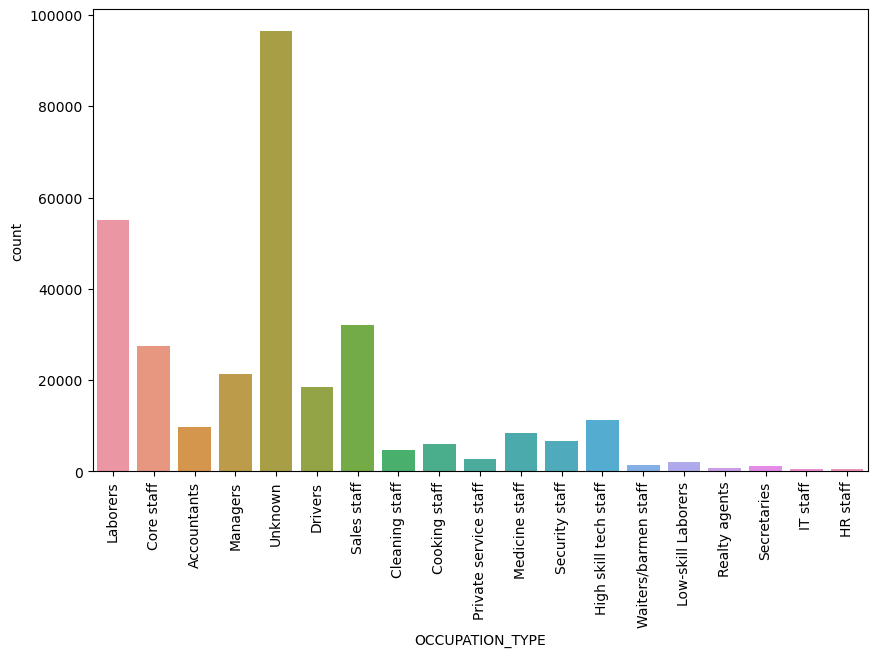

In [33]:
plt.figure(figsize=[10,6])
sns.countplot(data = applicant, x = 'OCCUPATION_TYPE')
plt.xticks(rotation=90)
plt.show()

## At a Glance :
#### Here we can see that most of the applicants are from Laborers
#### We should not impute values by using mean, median etc because it would affect our future data as missing values are 31.35%

# Analysis of 'EXT_SOURCE_3'

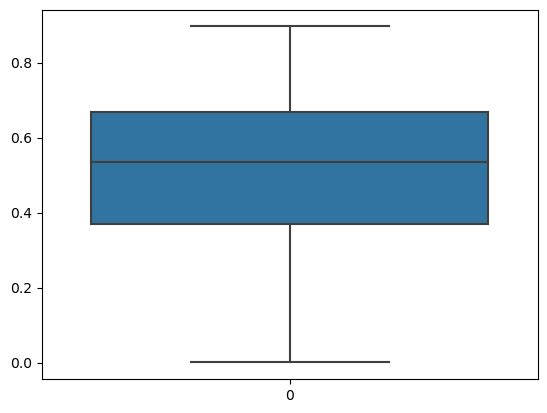

In [34]:
sns.boxplot(applicant.EXT_SOURCE_3)
plt.show()

In [35]:
#Getting quantile

applicant.EXT_SOURCE_3.quantile(q= [0.25, 0.50, 0.75, 1])

0.25    0.370650
0.50    0.535276
0.75    0.669057
1.00    0.896010
Name: EXT_SOURCE_3, dtype: float64

In [36]:
applicant.EXT_SOURCE_3.mode()[0]

0.746300213050371

In [37]:
applicant.EXT_SOURCE_3.median()

0.5352762504724826

In [38]:
applicant.EXT_SOURCE_3.mean()

0.5108529061799658

### Mean and Median are same for imputations but let's leave as it is because missing values percentage is high (19.83)

# Let's analysed same percentage of missing values columns (13.5%)

- AMT_REQ_CREDIT_BUREAU_YEAR
- AMT_REQ_CREDIT_BUREAU_QRT
- AMT_REQ_CREDIT_BUREAU_MON
- AMT_REQ_CREDIT_BUREAU_WEEK
- AMT_REQ_CREDIT_BUREAU_DAY
- AMT_REQ_CREDIT_BUREAU_HOUR

In [39]:
applicant[['AMT_REQ_CREDIT_BUREAU_YEAR', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_WEEK',
           'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_HOUR']].mode()

,AMT_REQ_CREDIT_BUREAU_YEAR,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_HOUR
0,0.0,0.0,0.0,0.0,0.0,0.0


In [40]:
applicant[['AMT_REQ_CREDIT_BUREAU_YEAR', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_WEEK',
           'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_HOUR']].describe()

,AMT_REQ_CREDIT_BUREAU_YEAR,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_HOUR
count,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,1.899974,0.265474,0.267395,0.034362,0.007000,0.006402
std,1.869295,0.794056,0.916002,0.204685,0.110757,0.083849
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,25.000000,261.000000,27.000000,8.000000,9.000000,4.000000


## Let's observed above columns:

- Mode is same (0) for all columns

* AMT_REQ_CREDIT_BUREAU_YEAR :
- Mean is 1.8999
- Median is 1.0000
- Nullable values are higher so no need to impute values, it will bias the data

* AMT_REQ_CREDIT_BUREAU_QRT :
- Mean is 0.2654
- Median is 0.0000
- Nullable values are higher so no need to impute values, it will bias the data

* AMT_REQ_CREDIT_BUREAU_MON :
- Mean is 0.2673
- Median is 0.0000
- Nullable values are higher so no need to impute values, it will bias the data

* AMT_REQ_CREDIT_BUREAU_WEEK :
- Mean is 0.034
- Median is 0.0000
- Nullable values are higher so no need to impute values, it will bias the data

* AMT_REQ_CREDIT_BUREAU_DAY :
- Mean is 0.0070
- Median is 0.0000
- Nullable values are higher so no need to impute values, it will bias the data

* AMT_REQ_CREDIT_BUREAU_HOUR :
- Mean is 0.0064
- Median is 0.0000
- Nullable values are higher so no need to impute values, it will bias the data

# Let's check missing values columns with > 0% & <1%

In [41]:
df_below1 = null_df[ (null_df['null_per'] > 0) & (null_df['null_per'] < 1) ]

In [42]:
df_below1.sort_values(by = 'null_per', ascending= False)

,column_name,null_total,null_per
11,NAME_TYPE_SUITE,1292,0.42
91,OBS_30_CNT_SOCIAL_CIRCLE,1021,0.33
92,DEF_30_CNT_SOCIAL_CIRCLE,1021,0.33
93,OBS_60_CNT_SOCIAL_CIRCLE,1021,0.33
94,DEF_60_CNT_SOCIAL_CIRCLE,1021,0.33
42,EXT_SOURCE_2,660,0.21
10,AMT_GOODS_PRICE,278,0.09


   #### Analysis of 'NAME_TYPE_SUITE'

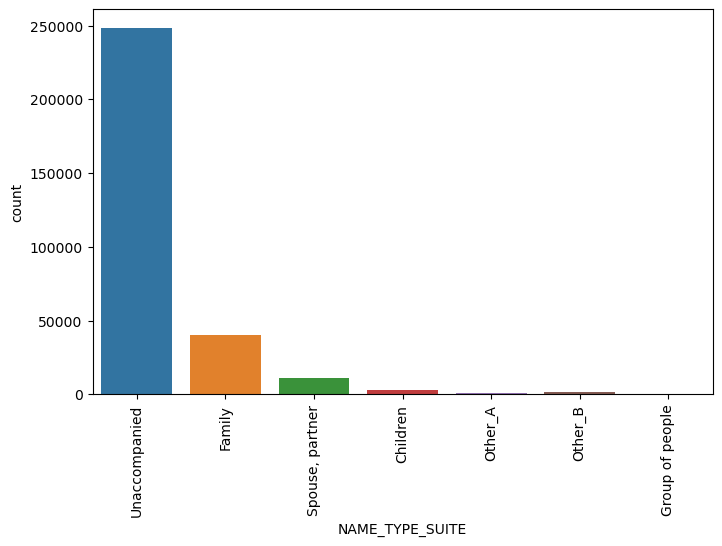

In [43]:
#Let's plot a graph to understand easily

plt.figure(figsize=[8,5])
sns.countplot(data = applicant, x= 'NAME_TYPE_SUITE')
plt.xticks(rotation=90)
plt.show()

### Observations :
- 'Unaccompanied' has the highest number of applicant
- We can impute ''Unaccompanied' in the dataframe

In [44]:
# Let me check total value counts

applicant['NAME_TYPE_SUITE'].value_counts()

Unaccompanied      248526
Family              40149
Spouse, partner     11370
Children             3267
Other_B              1770
Other_A               866
Group of people       271
Name: NAME_TYPE_SUITE, dtype: int64

#### Analysis of 'OBS_30_CNT_SOCIAL_CIRCLE'

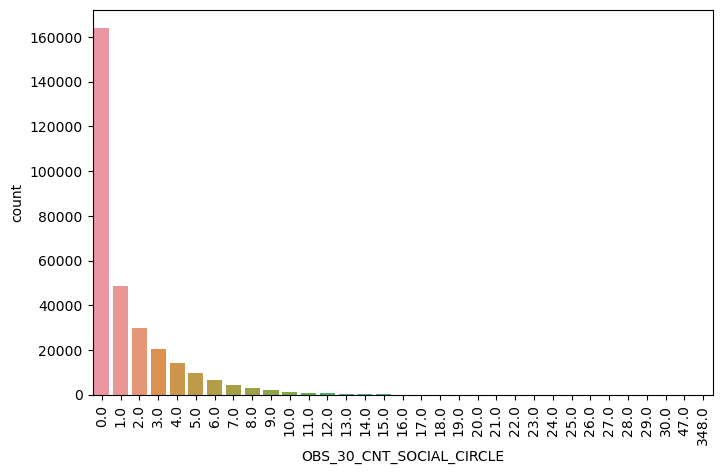

In [45]:
#Let's plot a graph to understand easily

plt.figure(figsize=[8,5])
sns.countplot(data = applicant, x= 'OBS_30_CNT_SOCIAL_CIRCLE')
plt.xticks(rotation=90)
plt.show()

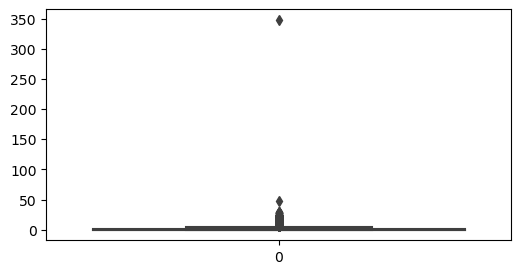

In [46]:
#for better understanding

plt.figure(figsize=[6,3])
sns.boxplot(applicant.OBS_30_CNT_SOCIAL_CIRCLE)
#plt.xticks(rotation=90)
plt.show()

In [47]:
applicant['OBS_30_CNT_SOCIAL_CIRCLE'].value_counts().head()

0.0    163910
1.0     48783
2.0     29808
3.0     20322
4.0     14143
Name: OBS_30_CNT_SOCIAL_CIRCLE, dtype: int64

In [48]:
applicant.OBS_30_CNT_SOCIAL_CIRCLE.quantile(q = [0, 0.25, 0.75, 1])

0.00      0.0
0.25      0.0
0.75      2.0
1.00    348.0
Name: OBS_30_CNT_SOCIAL_CIRCLE, dtype: float64

In [49]:
applicant.OBS_30_CNT_SOCIAL_CIRCLE.mode()[0]

0.0

In [50]:
applicant.OBS_30_CNT_SOCIAL_CIRCLE.median()

0.0

In [51]:
applicant.OBS_30_CNT_SOCIAL_CIRCLE.mean()

1.4222454239942575

### Observations :
- Median and mode are 0
- Mean is 1.42
- Outliners are 50 and 350
- Mode and Mean are close enough that we can use for future imputations as missing values are smaller 0.33%

#### Analysis of 'DEF_30_CNT_SOCIAL_CIRCLE'

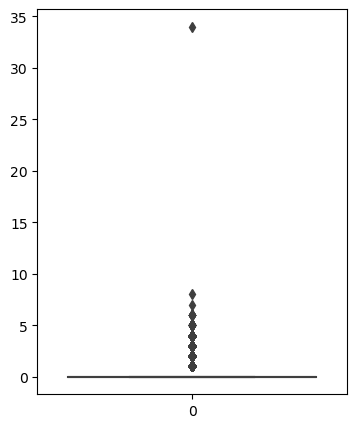

In [52]:
plt.figure(figsize=[4,5])
sns.boxplot(applicant.DEF_30_CNT_SOCIAL_CIRCLE)
plt.show()

In [53]:
applicant['DEF_30_CNT_SOCIAL_CIRCLE'].value_counts().head()

0.0    271324
1.0     28328
2.0      5323
3.0      1192
4.0       253
Name: DEF_30_CNT_SOCIAL_CIRCLE, dtype: int64

In [54]:
applicant.DEF_30_CNT_SOCIAL_CIRCLE.quantile(q = [0, 0.25, 0.75, 1])

0.00     0.0
0.25     0.0
0.75     0.0
1.00    34.0
Name: DEF_30_CNT_SOCIAL_CIRCLE, dtype: float64

In [55]:
applicant.DEF_30_CNT_SOCIAL_CIRCLE.mean()

0.1434206662533851

In [56]:
applicant.DEF_30_CNT_SOCIAL_CIRCLE.median()

0.0

In [57]:
applicant.DEF_30_CNT_SOCIAL_CIRCLE.mode()[0]

0.0

### Observations :
- As we can see in boxplot, mode and median are 0
- There are many Outliers, in which largest is around 33 
- Mean and Median are close enough that we can use for future imputations as missing values are smaller 0.33%

#### Analysis of 'OBS_60_CNT_SOCIAL_CIRCLE'

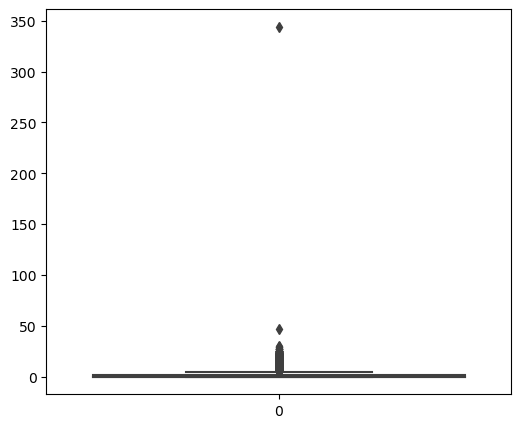

In [58]:
plt.figure(figsize=[6,5])
sns.boxplot(applicant.OBS_60_CNT_SOCIAL_CIRCLE)
plt.show()

In [59]:
applicant['OBS_60_CNT_SOCIAL_CIRCLE'].value_counts().head()

0.0    164666
1.0     48870
2.0     29766
3.0     20215
4.0     13946
Name: OBS_60_CNT_SOCIAL_CIRCLE, dtype: int64

In [60]:
applicant.OBS_60_CNT_SOCIAL_CIRCLE.quantile(q = [0, 0.25, 0.75, 1])

0.00      0.0
0.25      0.0
0.75      2.0
1.00    344.0
Name: OBS_60_CNT_SOCIAL_CIRCLE, dtype: float64

In [61]:
applicant.OBS_60_CNT_SOCIAL_CIRCLE.mode()[0]

0.0

In [62]:
applicant.OBS_60_CNT_SOCIAL_CIRCLE.median()

0.0

In [63]:
applicant.OBS_60_CNT_SOCIAL_CIRCLE.mean()

1.4052921791901856

### Observations :
- As we can see in boxplot, mode and median are 0
- Mean is 1.40
- Outiers are at 50 and 350 around 
- Mean and Median are close enough that we can use for future imputations as missing values are smaller 0.33%

#### Analysis of 'DEF_60_CNT_SOCIAL_CIRCLE'

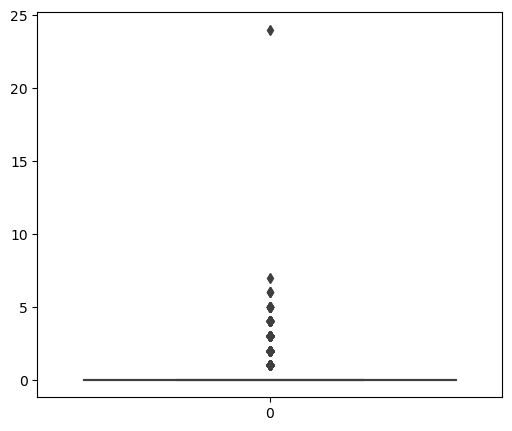

In [64]:
plt.figure(figsize=[6,5])
sns.boxplot(applicant.DEF_60_CNT_SOCIAL_CIRCLE)
plt.show()

In [65]:
applicant['DEF_60_CNT_SOCIAL_CIRCLE'].value_counts().head()

0.0    280721
1.0     21841
2.0      3170
3.0       598
4.0       135
Name: DEF_60_CNT_SOCIAL_CIRCLE, dtype: int64

In [66]:
applicant.DEF_60_CNT_SOCIAL_CIRCLE.quantile(q = [0, 0.25, 0.75, 1])

0.00     0.0
0.25     0.0
0.75     0.0
1.00    24.0
Name: DEF_60_CNT_SOCIAL_CIRCLE, dtype: float64

In [67]:
applicant.DEF_60_CNT_SOCIAL_CIRCLE.mode()[0]

0.0

In [68]:
applicant.DEF_60_CNT_SOCIAL_CIRCLE.median()

0.0

In [69]:
applicant.DEF_60_CNT_SOCIAL_CIRCLE.mean()

0.10004894123788705

### Observations :
- As we can see in boxplot, mode and median are 0
- Mean is 0.100
- & outliners are there, 24th is the largest outlier
- Mean and Median are close enough that we can use for future imputations as missing values are smaller 0.33%

#### Analysis of 'DEF_60_CNT_SOCIAL_CIRCLE'

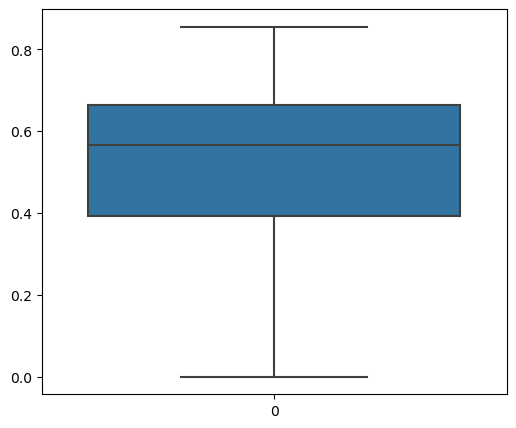

In [70]:
plt.figure(figsize=[6,5])
sns.boxplot(applicant.EXT_SOURCE_2)
plt.show()

In [71]:
applicant['EXT_SOURCE_2'].value_counts().head()

0.285898    721
0.262258    417
0.265256    343
0.159679    322
0.265312    306
Name: EXT_SOURCE_2, dtype: int64

In [72]:
applicant.EXT_SOURCE_2.quantile(q = [0.25, 0.75, 0.99, 1])

0.25    0.392457
0.75    0.663617
0.99    0.782793
1.00    0.855000
Name: EXT_SOURCE_2, dtype: float64

In [73]:
applicant.EXT_SOURCE_2.mode()[0]

0.2858978721410488

In [74]:
applicant.EXT_SOURCE_2.mean()

0.5143926741308462

In [75]:
applicant.EXT_SOURCE_2.median()

0.5659614260608526

### Observations :
- Mode is 0.28
- Mean is 0.51
- There are NO outliners in this data
- Mean and Median are close enough that we can use for future imputations as missing values are smaller 0.21%

#### Analysis of 'AMT_GOODS_PRICE'

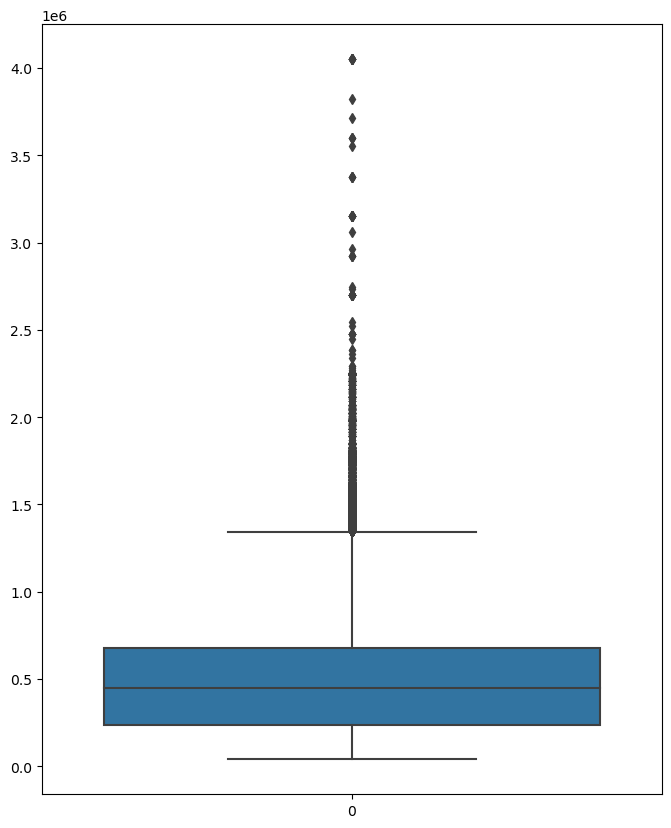

In [76]:
plt.figure(figsize=[8,10])
sns.boxplot(applicant.AMT_GOODS_PRICE)
plt.show()

In [77]:
applicant['AMT_GOODS_PRICE'].value_counts().head()

450000.0    26022
225000.0    25282
675000.0    24962
900000.0    15416
270000.0    11428
Name: AMT_GOODS_PRICE, dtype: int64

In [78]:
applicant.AMT_GOODS_PRICE.quantile(q = [0.25, 0.75, 0.99, 1])

0.25     238500.0
0.75     679500.0
0.99    1800000.0
1.00    4050000.0
Name: AMT_GOODS_PRICE, dtype: float64

In [79]:
applicant.AMT_GOODS_PRICE.mode()[0]

450000.0

In [80]:
applicant.AMT_GOODS_PRICE.median()

450000.0

In [81]:
applicant.AMT_GOODS_PRICE.mean()

538396.2074288895

### Observations :
- Mode and Median are excatly same
- Mean is 538396.20742
- There are multiple outlieres after 2500000 so it might be valid data
- Mode and Median are close enough that we can use for future imputations as missing values are smaller 0.09%

# Let's check the Incorrect data values

In [82]:
applicant.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL',
       'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE',
       'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'ORGANIZATION_TYPE', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_C

## Here we'll check and change few coulmns' format

## Let's check Code Gender

In [83]:
# Code Gender

applicant['CODE_GENDER'].value_counts()

F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64

#### Code Gendeer must be Male or Female not XNA, so we'll replaced XNA

In [84]:
(applicant['CODE_GENDER'] == 'XNA').sum()

4

In [85]:
applicant[applicant['CODE_GENDER'] == 'XNA']

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
35657,141289,0,Revolving loans,XNA,Y,Y,0,207000.0,382500.0,19125.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
38566,144669,0,Revolving loans,XNA,N,Y,2,157500.0,270000.0,13500.0,...,0,0,0,0,0.0,0.0,0.0,3.0,0.0,4.0
83382,196708,0,Revolving loans,XNA,N,Y,1,135000.0,405000.0,20250.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
189640,319880,0,Revolving loans,XNA,Y,Y,0,247500.0,540000.0,27000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,6.0


##### We can see, Female has double loan applicant than Male, so we'll impute these 4 values into Female category

In [86]:
applicant['CODE_GENDER'] = applicant['CODE_GENDER'].apply(lambda x: 'F' if x == 'XNA' else x)

In [87]:
applicant['CODE_GENDER'].value_counts()

F    202452
M    105059
Name: CODE_GENDER, dtype: int64

#### So here Female category has incresed by 4 in total, XNA has been removed

## Let's check Days Birth column

In [88]:
applicant['DAYS_BIRTH'].value_counts()

-13749    43
-13481    42
-18248    41
-10020    41
-15771    40
          ..
-24898     1
-24868     1
-8017      1
-25098     1
-25061     1
Name: DAYS_BIRTH, Length: 17460, dtype: int64

#### There are many negative values, we needd to convert to Positive first and make one new column of birth year

In [89]:
applicant['DAYS_BIRTH'].nunique()

17460

##### 17K + negative values

In [90]:
applicant['DAYS_BIRTH'] = applicant['DAYS_BIRTH'].apply(lambda x: -x if x < 0 else x)

In [91]:
applicant['DAYS_BIRTH'].value_counts()

13749    43
13481    42
18248    41
10020    41
15771    40
         ..
24898     1
24868     1
8017      1
25098     1
25061     1
Name: DAYS_BIRTH, Length: 17460, dtype: int64

#### Now it seems positive ones

In [92]:
applicant['YEARS_BIRTH'] = applicant['DAYS_BIRTH'].apply(lambda x: round(x / 365))

In [93]:
applicant.dtypes

SK_ID_CURR                      int64
TARGET                          int64
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
                               ...   
AMT_REQ_CREDIT_BUREAU_WEEK    float64
AMT_REQ_CREDIT_BUREAU_MON     float64
AMT_REQ_CREDIT_BUREAU_QRT     float64
AMT_REQ_CREDIT_BUREAU_YEAR    float64
YEARS_BIRTH                     int64
Length: 74, dtype: object

## Let's check NAME_FAMILY_STATUS

In [94]:
applicant['NAME_FAMILY_STATUS'].value_counts()

Married                 196432
Single / not married     45444
Civil marriage           29775
Separated                19770
Widow                    16088
Unknown                      2
Name: NAME_FAMILY_STATUS, dtype: int64

#### Gender must be Male or Female. Here we need to impute at 'Unknown' value

In [95]:
applicant[applicant['NAME_FAMILY_STATUS'] == 'Unknown']

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,YEARS_BIRTH
41982,148605,0,Revolving loans,M,N,Y,0,450000.0,675000.0,33750.0,...,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,34
187348,317181,0,Revolving loans,F,N,Y,0,202500.0,585000.0,29250.0,...,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,35


#### Since data is valid so we can't delete but will impute

In [96]:
applicant['NAME_FAMILY_STATUS'].value_counts(normalize=True) * 100

Married                 63.878040
Single / not married    14.778008
Civil marriage           9.682580
Separated                6.429038
Widow                    5.231683
Unknown                  0.000650
Name: NAME_FAMILY_STATUS, dtype: float64

* Married ppl percentage is 63%
* This would good option to impute Unknown values as Marrried

In [97]:
applicant['NAME_FAMILY_STATUS'] = applicant['NAME_FAMILY_STATUS'].apply(lambda x: 'Married' if x == 'Unknown' else x)

In [98]:
applicant['NAME_FAMILY_STATUS'].value_counts()

Married                 196434
Single / not married     45444
Civil marriage           29775
Separated                19770
Widow                    16088
Name: NAME_FAMILY_STATUS, dtype: int64

#### Unknown gets removed, Married count has been incresed to +2

### Let's check DAYS_EMPLOYED

In [99]:
applicant['DAYS_EMPLOYED'].value_counts(normalize= True).head() * 100

 365243    18.007161
-200        0.050730
-224        0.049429
-230        0.049104
-199        0.049104
Name: DAYS_EMPLOYED, dtype: float64

In [100]:
applicant['DAYS_EMPLOYED'].value_counts().head()

 365243    55374
-200         156
-224         152
-230         151
-199         151
Name: DAYS_EMPLOYED, dtype: int64

In [101]:
len(applicant[applicant['DAYS_EMPLOYED'] < 365243 ])

252137

In [102]:
applicant['DAYS_EMPLOYED'].nunique()

12574

In [103]:
applicant['DAYS_EMPLOYED'].unique()

array([  -637,  -1188,   -225, ..., -12971, -11084,  -8694], dtype=int64)

In [104]:
#We need to convert negative days values to positive ones

applicant['DAYS_EMPLOYED'] = applicant['DAYS_EMPLOYED'].apply(lambda x: -x if x < 0 else x)

In [105]:
applicant['DAYS_EMPLOYED'].value_counts().head()

365243    55374
200         156
224         152
230         151
199         151
Name: DAYS_EMPLOYED, dtype: int64

#### We can see all are positives values now

### Observations :

- DAYS_EMPLOYED indicates that how many days before applicant has started his/her curent employment, so officer should have fill   negative values for those days
- There are 55K+ records which has 365243 DAYS_EMPLOYED, which is 18% of data
- And we have seen 252K+ have negative values for days
- 12K+ have positive values for days
- Concluding this, either 18% are the Pensioneres or Unemployed
  - Either we can keep data as it is or
  - we need to calculate avg, median, mode etc and impute instead of 365243 days of Pensioneres. 0 Day for Unemployed.

In [106]:
#Let's check Pensioneres and Unemployed column

applicant[applicant['DAYS_EMPLOYED'] == 365243].NAME_INCOME_TYPE.value_counts()

Pensioner     55352
Unemployed       22
Name: NAME_INCOME_TYPE, dtype: int64

#### We can see and our conclusion was correct abt this two categories

#### Let's create new column of YEARS_EMPLOYED

In [107]:
applicant['YEAR_EMPLOYED'] = applicant['DAYS_EMPLOYED'].apply(lambda x: round(x / 365))

In [108]:
applicant.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL',
       'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE',
       'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'ORGANIZATION_TYPE', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_C

In [109]:
applicant.shape

(307511, 75)

### Let's check 'DAYS_REGISTRATION'

In [110]:
applicant['DAYS_REGISTRATION'].value_counts().head()

-1.0    113
-7.0     98
-6.0     96
-4.0     92
-2.0     92
Name: DAYS_REGISTRATION, dtype: int64

In [111]:
applicant['DAYS_REGISTRATION'].value_counts(normalize = True).head()

-1.0    0.000367
-7.0    0.000319
-6.0    0.000312
-4.0    0.000299
-2.0    0.000299
Name: DAYS_REGISTRATION, dtype: float64

In [112]:
applicant['DAYS_REGISTRATION'].nunique()

15688

In [113]:
#We need to convert negative days values to positive ones

applicant['DAYS_REGISTRATION'] = applicant['DAYS_REGISTRATION'].apply(lambda x: -x if x < 0 else x)

In [114]:
applicant['DAYS_REGISTRATION'].value_counts().head()

1.0    113
7.0     98
6.0     96
4.0     92
2.0     92
Name: DAYS_REGISTRATION, dtype: int64

#### We can see all are positives values now

In [115]:
#Create a new column for Years Registration

applicant['YEARS_REGISTRATION'] = applicant['DAYS_REGISTRATION'].apply(lambda x: round(x / 365))

### Let's check 'DAYS_ID_PUBLISH'

In [116]:
applicant['DAYS_ID_PUBLISH'].value_counts(normalize= True).head()

-4053    0.000550
-4095    0.000527
-4046    0.000524
-4417    0.000517
-4256    0.000514
Name: DAYS_ID_PUBLISH, dtype: float64

In [117]:
applicant['DAYS_ID_PUBLISH'].unique()

array([-2120,  -291, -2531, ..., -6194, -5854, -6211], dtype=int64)

In [118]:
applicant['DAYS_ID_PUBLISH'].nunique()

6168

In [119]:
#Let's convert into positive values

applicant['DAYS_ID_PUBLISH'] = applicant['DAYS_ID_PUBLISH'].apply(lambda x: -x if x < 0 else x)

In [120]:
applicant['DAYS_ID_PUBLISH'].value_counts().head()

4053    169
4095    162
4046    161
4417    159
4256    158
Name: DAYS_ID_PUBLISH, dtype: int64

In [121]:
#Create a new column for Year ID Publish

applicant['YEAR_ID_PUBLISH'] = applicant['DAYS_ID_PUBLISH'].apply(lambda x: round(x / 365))

### Let's check 'DAYS_LAST_PHONE_CHANGE'

In [122]:
applicant['DAYS_LAST_PHONE_CHANGE'].value_counts(normalize= True).head()

 0.0    0.122507
-1.0    0.009144
-2.0    0.007538
-3.0    0.005733
-4.0    0.004179
Name: DAYS_LAST_PHONE_CHANGE, dtype: float64

In [123]:
applicant['DAYS_LAST_PHONE_CHANGE'].unique()

array([-1134.,  -828.,  -815., ..., -3988., -3899., -3538.])

In [124]:
applicant['DAYS_LAST_PHONE_CHANGE'].nunique()

3773

In [125]:
applicant['DAYS_LAST_PHONE_CHANGE'] = applicant['DAYS_LAST_PHONE_CHANGE'].apply(lambda x: -x if x < 0 else x)

In [126]:
applicant['DAYS_LAST_PHONE_CHANGE'].value_counts().head()

0.0    37672
1.0     2812
2.0     2318
3.0     1763
4.0     1285
Name: DAYS_LAST_PHONE_CHANGE, dtype: int64

In [127]:
#Create a new column for Year Phone Change

applicant['YEAR_LAST_PHONE_CHANGE'] = applicant['DAYS_LAST_PHONE_CHANGE'].apply(lambda x: round(x / 365,0))

# Let's deal with Outliers for 'Numerical Columns'

#### Before dive into all plots and analysis, I'll create a Automation Function for Analysis to utilised code rather than typing everytime.

#### Dist & Box plot for Numerical Columns Outlieres

In [128]:
def func_box_dist(dataset,column):
    plt.subplots(1,2 ,figsize = (20,8))

    plt.subplot(121)
    #red_diamond = dict(markerfacecolor='r', marker='D')
    sns.boxplot(y = column, data = dataset)
    
    plt.subplot(122)
    sns.distplot(dataset[column], color = 'blue')
    plt.ticklabel_format(style='plain', axis='x')
    
    plt.tight_layout(pad = 4)
    plt.show()

### age_category function

In [129]:
def age_category(years):
    if years <= 20:
        return '0-20'
    elif years > 20 and years <= 30:
        return '20-30'
    elif years > 30 and years <= 40:
        return '30-40'  
    elif years > 40 and years <= 50:
        return '40-50'
    elif years > 50 and years <= 60:
        return '50-60'
    elif years > 60 and years <= 70:
        return '60-70'
    elif years > 70:
        return '70+'

## Univariate Analysis Countplot for categorial

In [130]:
def func_uni_countplot(column):
    plt.figure(figsize = [20,8])
    palt = sns.color_palette("muted")

    plt.subplot(1,2,1)
    pltname = column + ' clients with payment difficulties'
    plt.title(pltname)
    sns.countplot(x = column, data = df1, order = sorted(df1[column].unique(), reverse = True), palette = palt)
    plt.xticks(rotation = 90)
    
    plt.subplot(1,2,2)
    pltname = column + ' clients with on-time payments'
    plt.title(pltname)
    sns.countplot(x = column, data = df0, order = sorted(df0[column].unique(), reverse = True), palette = palt)
    plt.xticks(rotation = 90)
    
    plt.tight_layout(pad = 4)
    plt.show()

## Univariate Analysis Piechart for categorial

In [131]:
def func_uni_piechart(column):
    plt.figure(figsize = [20,12])

    plt.subplot(1,2,1)
    pltname = column + ' clients with Payment Difficulties'
    plt.title(pltname)
    df1[column].value_counts().plot.pie(autopct='%1.1f%%', colors = ['maroon','blue','skyblue','orange','pink'], labeldistance=None)
    plt.legend()
    
    plt.subplot(1,2,2)
    pltname = column + ' clients with On-Time Payments'
    plt.title(pltname)
    df0[column].value_counts().plot.pie(autopct='%1.1f%%', colors = ['maroon','blue','skyblue','orange','pink'], labeldistance=None)
    
    plt.legend()
    plt.tight_layout(pad = 4)
    plt.show()

### Analysis of 'AMT_INCOME_TOTAL'

In [132]:
applicant['AMT_INCOME_TOTAL'].describe(percentiles= [0.75, 0.99, 0.999])

count    3.075110e+05
mean     1.687979e+05
std      2.371231e+05
min      2.565000e+04
50%      1.471500e+05
75%      2.025000e+05
99%      4.725000e+05
99.9%    9.000000e+05
max      1.170000e+08
Name: AMT_INCOME_TOTAL, dtype: float64

In [133]:
(applicant['AMT_INCOME_TOTAL'].value_counts(normalize= True).sort_values(ascending = False) * 100).head()

135000.0    11.625600
112500.0    10.087119
157500.0     8.635789
180000.0     8.038412
90000.0      7.311283
Name: AMT_INCOME_TOTAL, dtype: float64

In [134]:
applicant['AMT_INCOME_TOTAL'].value_counts().sort_values(ascending = False).head()

135000.0    35750
112500.0    31019
157500.0    26556
180000.0    24719
90000.0     22483
Name: AMT_INCOME_TOTAL, dtype: int64

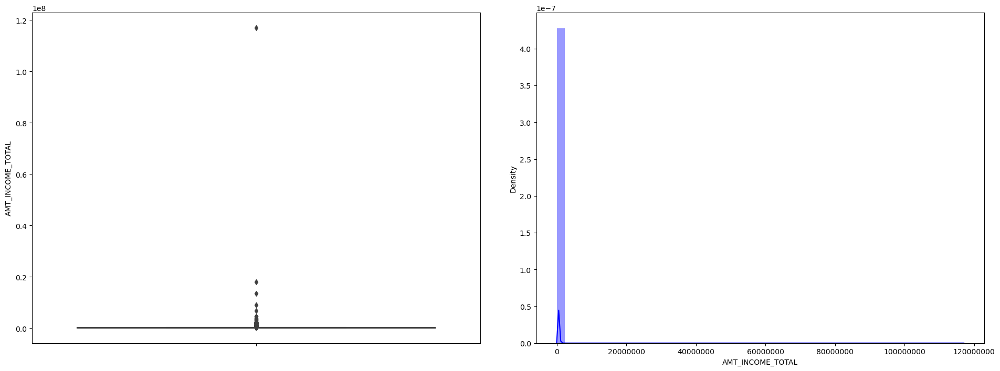

In [135]:
# I'll call our Automation function which is created above

func_box_dist(applicant,'AMT_INCOME_TOTAL')

#### We can't easily notice as they seems to be thin, need to plot another plots.
- But we can see above 120M+ are outlires.

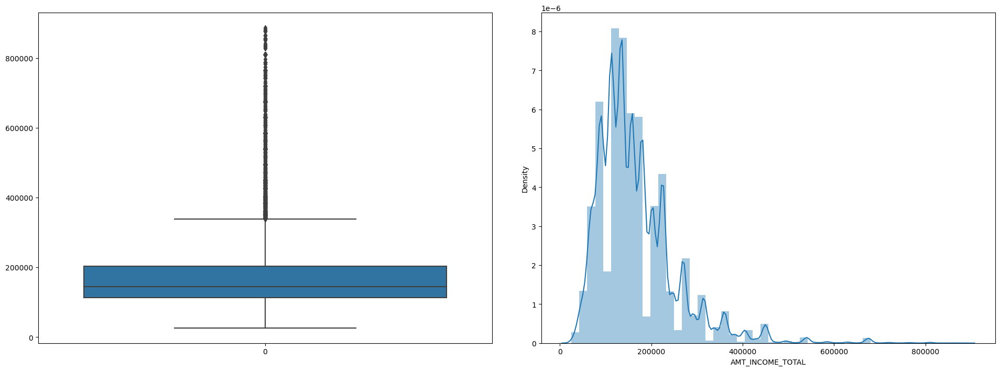

In [136]:
plt.subplots(1,2 ,figsize = (20,8))

plt.subplot(121)
sns.boxplot(applicant[applicant['AMT_INCOME_TOTAL'] < 900000].AMT_INCOME_TOTAL)

plt.subplot(122)
sns.distplot(applicant[applicant['AMT_INCOME_TOTAL'] < 900000].AMT_INCOME_TOTAL)

plt.tight_layout(pad = 4)
plt.show()

#### Now it's visible that Income above 900K are outlires.

In [137]:
applicant[applicant['AMT_INCOME_TOTAL'] > 900000].head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,YEARS_BIRTH,YEAR_EMPLOYED,YEARS_REGISTRATION,YEAR_ID_PUBLISH,YEAR_LAST_PHONE_CHANGE
1504,101769,0,Revolving loans,M,Y,Y,0,1080000.0,180000.0,9000.0,...,0.0,0.0,0.0,0.0,0.0,37,15,0,14,1.0
1723,102015,0,Cash loans,F,N,Y,0,1935000.0,269550.0,10534.5,...,0.0,0.0,0.0,0.0,0.0,51,1001,9,6,1.0
3371,103938,0,Cash loans,F,N,N,1,1350000.0,2410380.0,109053.0,...,0.0,0.0,3.0,0.0,0.0,33,2,2,11,0.0
4603,105384,0,Revolving loans,F,Y,Y,0,1350000.0,405000.0,20250.0,...,0.0,0.0,0.0,0.0,0.0,40,13,10,11,0.0
5673,106637,0,Cash loans,M,Y,Y,3,967500.0,450000.0,30073.5,...,0.0,0.0,1.0,1.0,0.0,33,1,8,1,0.0


### Observations :
- Both plots shows same trend.
- Above 900K Income data are outlires.

### Analysis of 'CNT_CHILDREN'

In [138]:
applicant['CNT_CHILDREN'].value_counts().sort_values(ascending = False).head()

0    215371
1     61119
2     26749
3      3717
4       429
Name: CNT_CHILDREN, dtype: int64

In [139]:
(applicant['CNT_CHILDREN'].value_counts(normalize=True).sort_values(ascending = False) * 100).head()

0    70.036844
1    19.875387
2     8.698551
3     1.208737
4     0.139507
Name: CNT_CHILDREN, dtype: float64

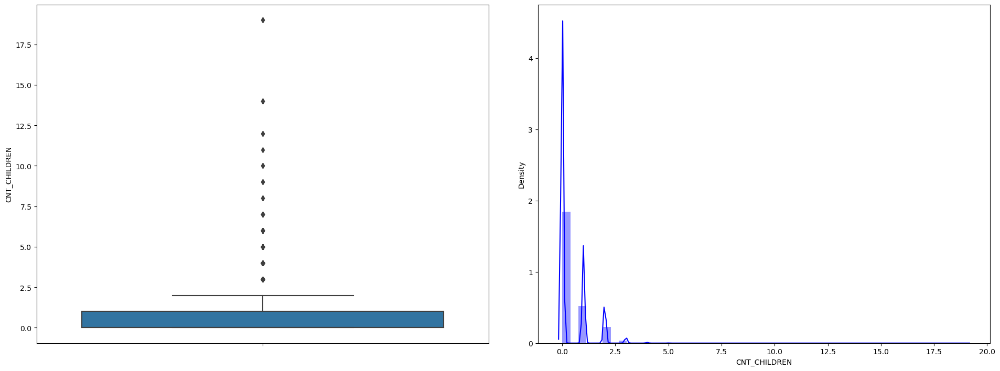

In [140]:
func_box_dist(applicant, 'CNT_CHILDREN')

In [141]:
# Let's calculate IQR for better understanding

Q1 = applicant['CNT_CHILDREN'].quantile(0.25)
Q3 = applicant['CNT_CHILDREN'].quantile(0.75)
IQR = Q3- Q1
IQR

1.0

In [142]:
#Let me count Min and Max values for outlier

MinVal = (Q1 - 1.5 * IQR)
MaxVal = (Q3 + 1.5 * IQR)

print('Min Value before outlier :', MinVal)
print('Max Value after outlier :', MaxVal)

Min Value before outlier : -1.5
Max Value after outlier : 2.5


### Observations :

- Both the plots clearly show that the values beyond 2.5 are outliers.
- The applicant who has 3+ children are outlires.

### Analysis of 'CNT_FAM_MEMBERS'

In [143]:
applicant['CNT_FAM_MEMBERS'].value_counts().sort_values(ascending = False).head()

2.0    158357
1.0     67847
3.0     52601
4.0     24697
5.0      3478
Name: CNT_FAM_MEMBERS, dtype: int64

In [144]:
(applicant['CNT_FAM_MEMBERS'].value_counts(normalize=True).sort_values(ascending = False)* 100).head()

2.0    51.496704
1.0    22.063419
3.0    17.105516
4.0     8.031310
5.0     1.131024
Name: CNT_FAM_MEMBERS, dtype: float64

In [145]:
applicant['CNT_FAM_MEMBERS'].describe(percentiles= [0.75, 0.99, 0.999])

count    307509.000000
mean          2.152665
std           0.910682
min           1.000000
50%           2.000000
75%           3.000000
99%           5.000000
99.9%         6.000000
max          20.000000
Name: CNT_FAM_MEMBERS, dtype: float64

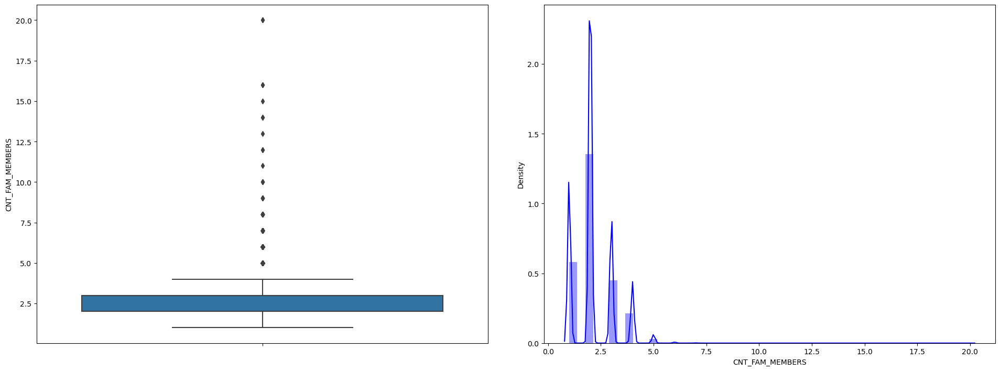

In [146]:
func_box_dist(applicant, 'CNT_FAM_MEMBERS')

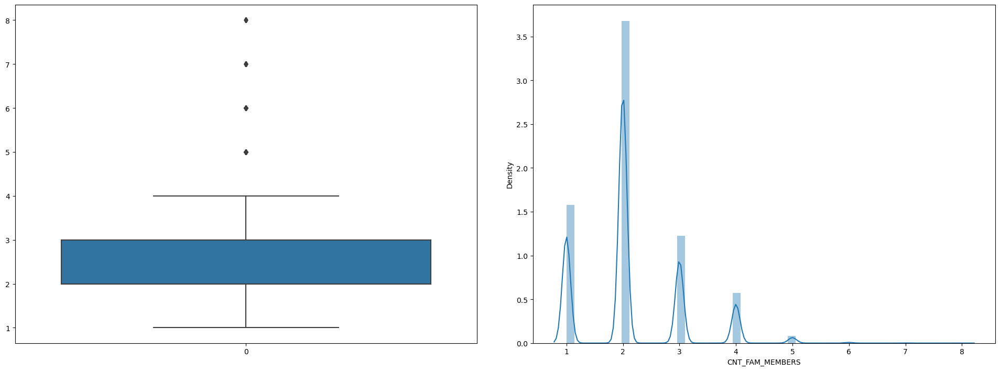

In [147]:
#Let's plot for clear picture

plt.subplots(1,2 ,figsize = (20,8))

plt.subplot(121)
sns.boxplot(applicant[applicant['CNT_FAM_MEMBERS'] <= 8].CNT_FAM_MEMBERS)

plt.subplot(122)
sns.distplot(applicant[applicant['CNT_FAM_MEMBERS'] <= 8].CNT_FAM_MEMBERS)

plt.tight_layout(pad = 4)
plt.show()

### Observations :
- Now it's clearly visible that above 5 children are outlires.

## Analysis of 'AMT_ANNUITY'

In [148]:
applicant['AMT_ANNUITY'].value_counts().sort_values(ascending = False).head()

9000.0     6385
13500.0    5514
6750.0     2279
10125.0    2035
37800.0    1602
Name: AMT_ANNUITY, dtype: int64

In [149]:
(applicant['AMT_ANNUITY'].value_counts(normalize= True).sort_values(ascending = False)* 100).head()

9000.0     2.076430
13500.0    1.793177
6750.0     0.741141
10125.0    0.661791
37800.0    0.520977
Name: AMT_ANNUITY, dtype: float64

In [150]:
applicant['AMT_ANNUITY'].describe(percentiles= [0.75, 0.99, 0.999])

count    307499.000000
mean      27108.573909
std       14493.737315
min        1615.500000
50%       24903.000000
75%       34596.000000
99%       70006.500000
99.9%    110047.500000
max      258025.500000
Name: AMT_ANNUITY, dtype: float64

In [151]:
# Let's calculate IQR for better understanding

Q1 = applicant['AMT_ANNUITY'].quantile(0.25)
Q3 = applicant['AMT_ANNUITY'].quantile(0.75)
IQR = Q3- Q1
IQR

18072.0

In [152]:
#Let me count Min and Max values for outlier

MinVal = (Q1 - 1.5 * IQR)
MaxVal = (Q3 + 1.5 * IQR)

print('Min Value before outlier :', MinVal)
print('Max Value after outlier :', MaxVal)

Min Value before outlier : -10584.0
Max Value after outlier : 61704.0


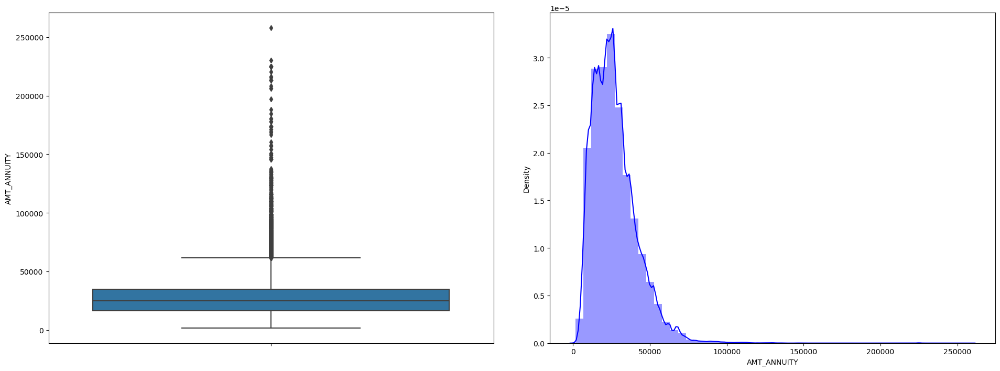

In [153]:
# Let's plot

func_box_dist(applicant, 'AMT_ANNUITY')

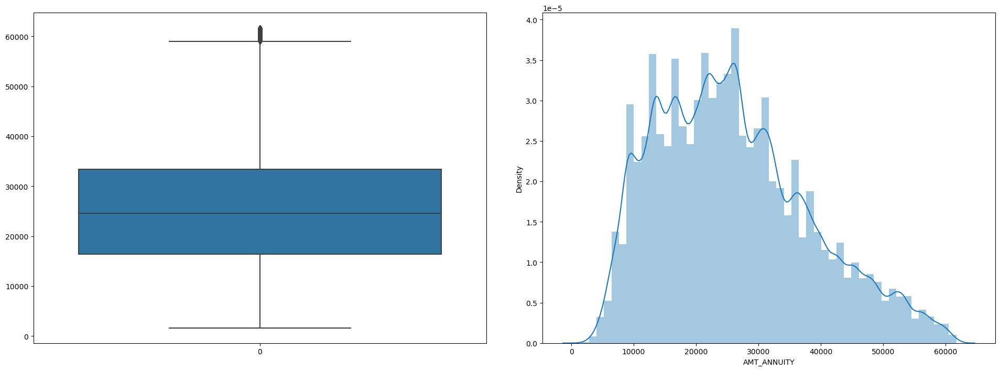

In [154]:
#Let's plot for clear picture

plt.subplots(1,2 ,figsize = (20,8))

plt.subplot(121)
sns.boxplot(applicant[applicant['AMT_ANNUITY'] <= 61704].AMT_ANNUITY)

plt.subplot(122)
sns.distplot(applicant[applicant['AMT_ANNUITY'] <= 61704].AMT_ANNUITY)

plt.tight_layout(pad = 4)
plt.show()

## Observations :
- Now we can see the trend, 'AMT_ANNUITY' above 61K are outlires.
- 61K value is derived using MaxVal equation

## Analysis of 'AMT_CREDIT'

In [155]:
applicant['AMT_CREDIT'].value_counts().sort_values(ascending = False).head()

450000.0    9709
675000.0    8877
225000.0    8162
180000.0    7342
270000.0    7241
Name: AMT_CREDIT, dtype: int64

In [156]:
(applicant['AMT_CREDIT'].value_counts(normalize= True).sort_values(ascending = False)* 100).head()

450000.0    3.157285
675000.0    2.886726
225000.0    2.654214
180000.0    2.387557
270000.0    2.354713
Name: AMT_CREDIT, dtype: float64

In [157]:
applicant['AMT_CREDIT'].describe(percentiles = [0.75,0.99,0.999])

count    3.075110e+05
mean     5.990260e+05
std      4.024908e+05
min      4.500000e+04
50%      5.135310e+05
75%      8.086500e+05
99%      1.854000e+06
99.9%    2.517300e+06
max      4.050000e+06
Name: AMT_CREDIT, dtype: float64

In [158]:
Q1 = applicant['AMT_CREDIT'].quantile(0.25)
Q3 = applicant['AMT_CREDIT'].quantile(0.75)
IQR = Q3 - Q1
IQR

538650.0

In [159]:
MinVal = (Q1 - 1.5 * IQR)
MaxVal = (Q3 + 1.5 * IQR)
print('Min Value before outlier :', MinVal)
print('Max Value after outlier :', MaxVal)

Min Value before outlier : -537975.0
Max Value after outlier : 1616625.0


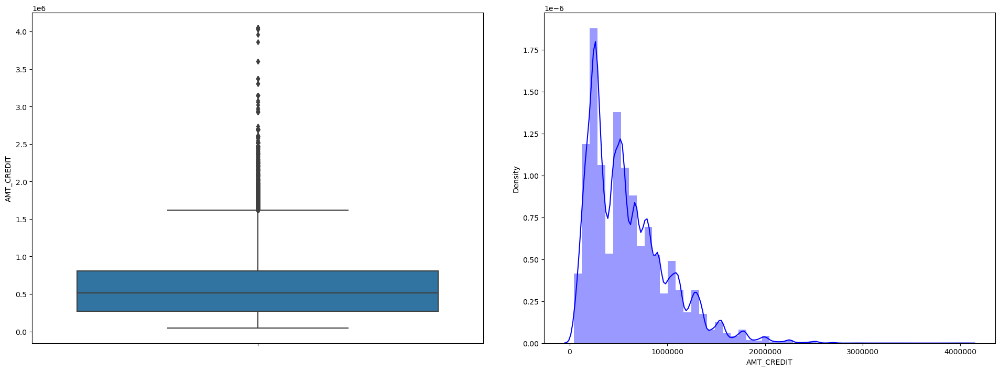

In [160]:
func_box_dist(applicant, 'AMT_CREDIT')

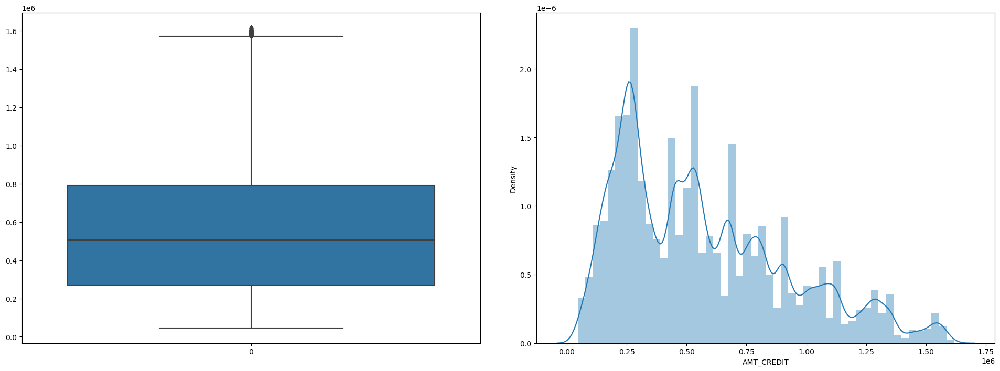

In [161]:
#Let's plot for clear picture

plt.subplots(1,2 ,figsize = (20,8))

plt.subplot(121)
sns.boxplot(applicant[applicant['AMT_CREDIT'] <= 1616625].AMT_CREDIT)

plt.subplot(122)
sns.distplot(applicant[applicant['AMT_CREDIT'] <= 1616625].AMT_CREDIT)

plt.tight_layout(pad = 4)
plt.show()

## Observations :
- Now we can see the trend, applicant with 'AMT_CREDIT' above 1616625 are outlires.
- 1616625 value is derived using MaxVal equation

## Analysis of 'DAYS_LAST_PHONE_CHANGE'

In [162]:
applicant['DAYS_LAST_PHONE_CHANGE'].value_counts().sort_values(ascending = False).head()

0.0    37672
1.0     2812
2.0     2318
3.0     1763
4.0     1285
Name: DAYS_LAST_PHONE_CHANGE, dtype: int64

In [163]:
(applicant['DAYS_LAST_PHONE_CHANGE'].value_counts(normalize=True).sort_values(ascending = False)* 100).head()

0.0    12.250659
1.0     0.914442
2.0     0.753797
3.0     0.573315
4.0     0.417873
Name: DAYS_LAST_PHONE_CHANGE, dtype: float64

In [164]:
applicant['DAYS_LAST_PHONE_CHANGE'].describe(percentiles = [0.75,0.99,0.9999])

count     307510.000000
mean         962.858788
std          826.808487
min            0.000000
50%          757.000000
75%         1570.000000
99%         3149.000000
99.99%      3999.747300
max         4292.000000
Name: DAYS_LAST_PHONE_CHANGE, dtype: float64

In [165]:
Q1 = applicant['DAYS_LAST_PHONE_CHANGE'].quantile(0.25)
Q3 = applicant['DAYS_LAST_PHONE_CHANGE'].quantile(0.75)
IQR = Q3 - Q1
IQR

1296.0

In [166]:
MinVal = (Q1 - 1.5 * IQR)
MaxVal = (Q3 + 1.5 * IQR)
print('Min Value before outlier :', MinVal)
print('Max Value after outlier :', MaxVal)

Min Value before outlier : -1670.0
Max Value after outlier : 3514.0


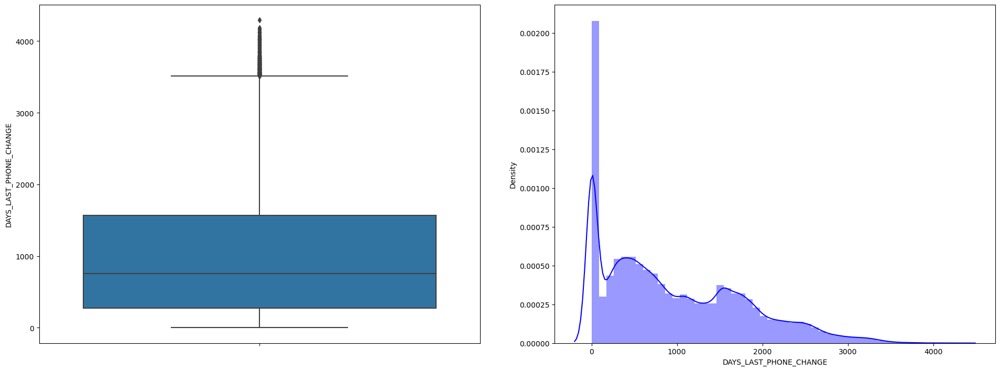

In [167]:
func_box_dist(applicant, 'DAYS_LAST_PHONE_CHANGE')

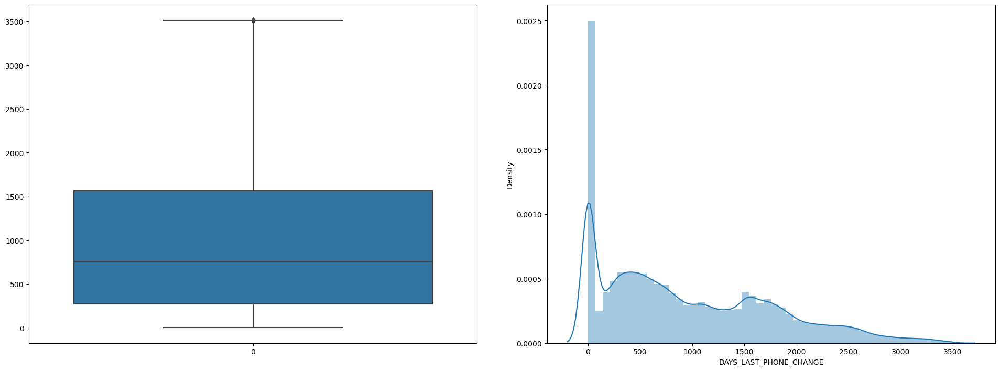

In [168]:
#Let's plot for clear picture

plt.subplots(1,2 ,figsize = (20,8))

plt.subplot(121)
sns.boxplot(applicant[applicant['DAYS_LAST_PHONE_CHANGE'] <= 3514].DAYS_LAST_PHONE_CHANGE)

plt.subplot(122)
sns.distplot(applicant[applicant['DAYS_LAST_PHONE_CHANGE'] <= 3514].DAYS_LAST_PHONE_CHANGE)

plt.tight_layout(pad = 4)
plt.show()

## Observations :
- Now we can see the trend, applicants with 'DAYS_LAST_PHONE_CHANGE' above 3514 are outlires.
- 3514 value is derived using MaxVal equation

# Binning of Continuous Columns

### Categorizing 'AMT_GOODS_PRICE'

In [169]:
applicant['AMT_GOODS_PRICE'].value_counts().sort_values(ascending=False).head()

450000.0    26022
225000.0    25282
675000.0    24962
900000.0    15416
270000.0    11428
Name: AMT_GOODS_PRICE, dtype: int64

In [170]:
(applicant['AMT_GOODS_PRICE'].value_counts(normalize=True).sort_values(ascending=False)*100).head()

450000.0    8.469793
225000.0    8.228934
675000.0    8.124778
900000.0    5.017690
270000.0    3.719653
Name: AMT_GOODS_PRICE, dtype: float64

In [171]:
applicant['AMT_GOODS_PRICE'].describe(percentiles = [0.25,0.75,0.99,0.9999])

count     3.072330e+05
mean      5.383962e+05
std       3.694465e+05
min       4.050000e+04
25%       2.385000e+05
50%       4.500000e+05
75%       6.795000e+05
99%       1.800000e+06
99.99%    2.934965e+06
max       4.050000e+06
Name: AMT_GOODS_PRICE, dtype: float64

##### We'll create new column for binning as 'AMT_GOODS_PRICE_CATEGORY'

In [172]:
applicant['AMT_GOODS_PRICE_CATEGORY'] = pd.cut(applicant['AMT_GOODS_PRICE'], bins = 5,
                                               labels = ['very low','low','medium','high','very high'])

In [173]:
applicant['AMT_GOODS_PRICE_CATEGORY'].value_counts()

very low     246973
low           56087
medium         4108
high             47
very high        18
Name: AMT_GOODS_PRICE_CATEGORY, dtype: int64

### Categorizing 'YEARS_BIRTH'

In [174]:
applicant['YEARS_BIRTH'].value_counts().sort_values(ascending = False).head()

39    9023
38    8793
37    8727
40    8602
41    8495
Name: YEARS_BIRTH, dtype: int64

In [175]:
(applicant['YEARS_BIRTH'].value_counts(normalize = True).sort_values(ascending = False) * 100).head()

39    2.934204
38    2.859410
37    2.837947
40    2.797298
41    2.762503
Name: YEARS_BIRTH, dtype: float64

In [176]:
applicant['YEARS_BIRTH'].describe(percentiles = [0.25,0.75,0.99,0.9999])

count     307511.000000
mean          43.938646
std           11.964047
min           21.000000
25%           34.000000
50%           43.000000
75%           54.000000
99%           67.000000
99.99%        69.000000
max           69.000000
Name: YEARS_BIRTH, dtype: float64

In [177]:
applicant['YEARS_BIRTH_CATEGORY'] = applicant['YEARS_BIRTH'].apply(age_category)

In [178]:
applicant['YEARS_BIRTH_CATEGORY'].value_counts().sort_values(ascending = False)

30-40    82770
40-50    75509
50-60    67955
20-30    48869
60-70    32408
Name: YEARS_BIRTH_CATEGORY, dtype: int64

### Categorizing 'YEARS_REGISTRATION'

In [179]:
applicant['YEARS_REGISTRATION'].value_counts().sort_values(ascending = False).head()

1     15661
2     15564
3     13894
13    12866
12    12697
Name: YEARS_REGISTRATION, dtype: int64

In [180]:
(applicant['YEARS_REGISTRATION'].value_counts(normalize = True).sort_values(ascending = False) * 100).head()

1     5.092826
2     5.061282
3     4.518212
13    4.183915
12    4.128958
Name: YEARS_REGISTRATION, dtype: float64

In [181]:
# Let's create new column

applicant['YEARS_REGISTRATION_CATEGORY'] = applicant['YEARS_REGISTRATION'].apply(age_category)

In [182]:
applicant['YEARS_REGISTRATION_CATEGORY'].value_counts().sort_values(ascending = False)

0-20     230697
20-30     59288
30-40     16051
40-50      1406
50-60        60
60-70         9
Name: YEARS_REGISTRATION_CATEGORY, dtype: int64

In [183]:
applicant['YEARS_REGISTRATION_CATEGORY'].describe()

count     307511
unique         6
top         0-20
freq      230697
Name: YEARS_REGISTRATION_CATEGORY, dtype: object

# Analysing Imbalance for target column

### First analysing TARGET column

In [184]:
applicant['TARGET'].value_counts().sort_values(ascending = False)

0    282686
1     24825
Name: TARGET, dtype: int64

In [185]:
applicant['TARGET'].value_counts(normalize = True).sort_values(ascending = False) * 100

0    91.927118
1     8.072882
Name: TARGET, dtype: float64

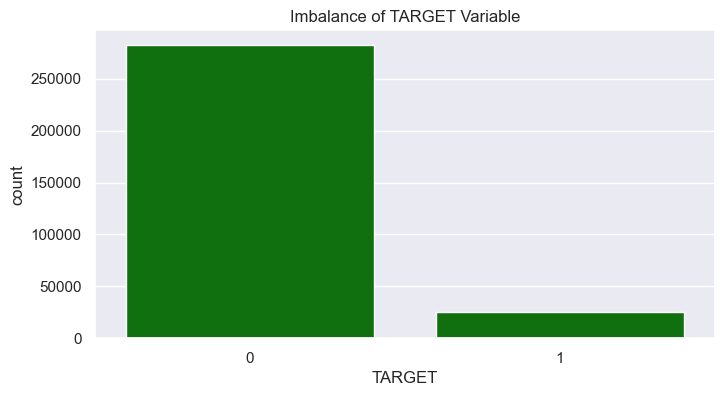

In [186]:
# let's plot for better understanding

plt.figure(figsize = (8,4))
sns.set(style="darkgrid")
sns.countplot(x = applicant['TARGET'], data = applicant, color='green')
plt.title('Imbalance of TARGET Variable')
plt.show()

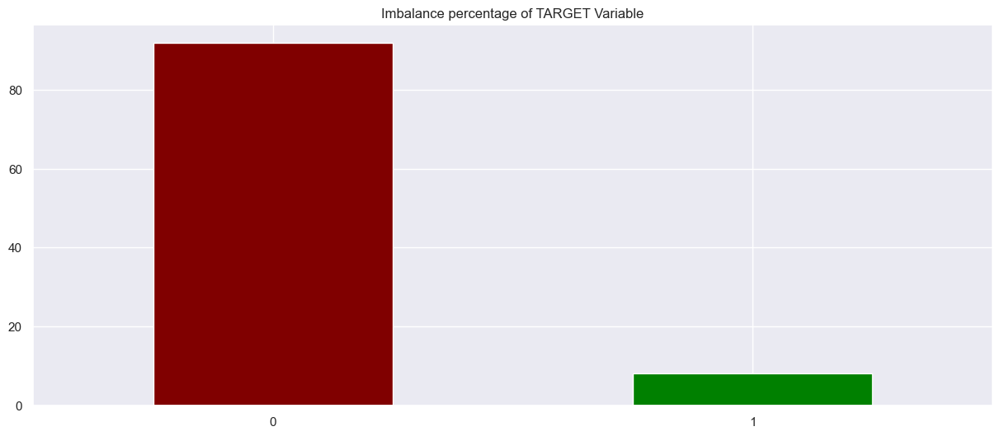

In [187]:
plt.figure(figsize = [15,6])
(applicant['TARGET'].value_counts(normalize=True) * 100).plot.bar(title = "Imbalance percentage of TARGET Variable",
                              color=['maroon', 'green'])
plt.xticks(rotation=0)
plt.show()

## Observations :
- As we can clearly see imbalance between Target variable
- TARGET var 1 (8.07%) has lower % compare to var 0 (91.92%)

# Let's Split the data on TARGET

#### Creating new dataframe for Target value 1

In [188]:
df1= applicant[applicant['TARGET'] == 1]

In [189]:
df1.TARGET.value_counts()

1    24825
Name: TARGET, dtype: int64

#### Creating new dataframe for Target value 0

In [190]:
df0 = applicant[applicant['TARGET'] == 0]

In [191]:
df0.TARGET.value_counts()

0    282686
Name: TARGET, dtype: int64

# Univariate Analysis of Categorical variable

#### Analysis of 'CODE_GENDER'

In [192]:
# CODE_GENDER with payment difficulties

df1['CODE_GENDER'].value_counts().sort_values(ascending = False)

F    14170
M    10655
Name: CODE_GENDER, dtype: int64

In [193]:
# CODE_GENDER on-time payment

df0['CODE_GENDER'].value_counts().sort_values(ascending = False)

F    188282
M     94404
Name: CODE_GENDER, dtype: int64

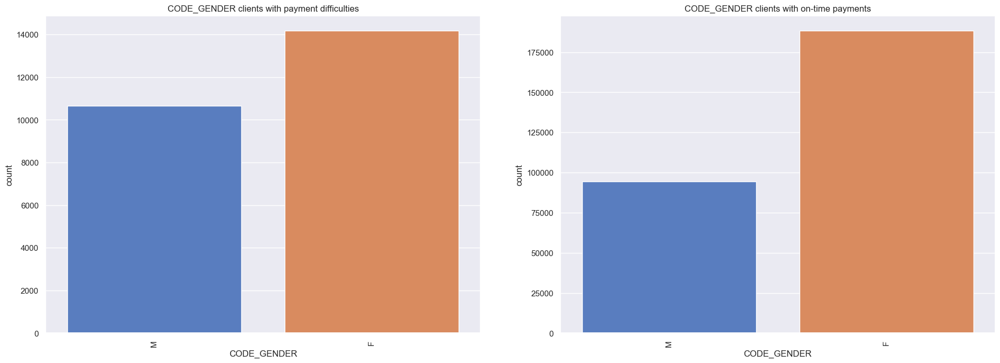

In [194]:
func_uni_countplot('CODE_GENDER')

### Observations :
- As we can see that CODE_GENDER column provide that Male client have more payment difficulties than Female, which is weak inference.

#### Analysis of 'NAME_CONTRACT_TYPE'

In [195]:
# NAME_CONTRACT_TYPE with payment difficulties

df1['NAME_CONTRACT_TYPE'].value_counts().sort_values(ascending = False)

Cash loans         23221
Revolving loans     1604
Name: NAME_CONTRACT_TYPE, dtype: int64

In [196]:
# NAME_CONTRACT_TYPE on-time payment

df0['NAME_CONTRACT_TYPE'].value_counts().sort_values(ascending = False)

Cash loans         255011
Revolving loans     27675
Name: NAME_CONTRACT_TYPE, dtype: int64

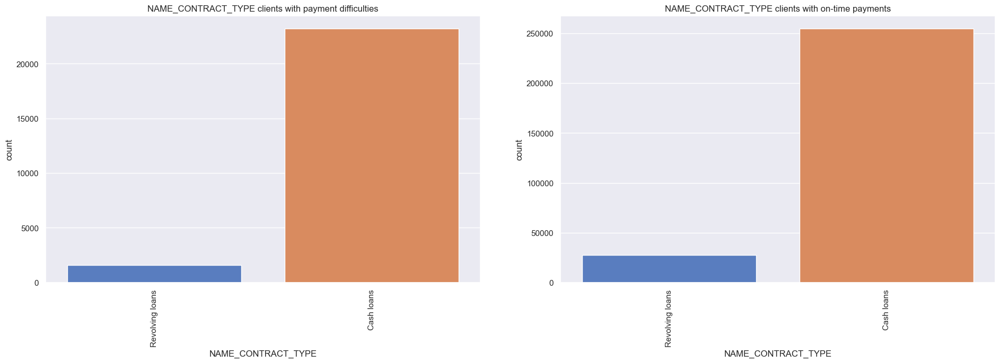

In [197]:
func_uni_countplot('NAME_CONTRACT_TYPE')

### Observations :
- We can't see any solid results between payment difficulties and on-time  payments.

#### Analysis of 'FLAG_OWN_CAR'

In [198]:
# FLAG_OWN_CAR with payment difficulties

df1['FLAG_OWN_CAR'].value_counts().sort_values(ascending = False)

N    17249
Y     7576
Name: FLAG_OWN_CAR, dtype: int64

In [199]:
# FLAG_OWN_CAR on-time payment

df0['FLAG_OWN_CAR'].value_counts().sort_values(ascending = False)

N    185675
Y     97011
Name: FLAG_OWN_CAR, dtype: int64

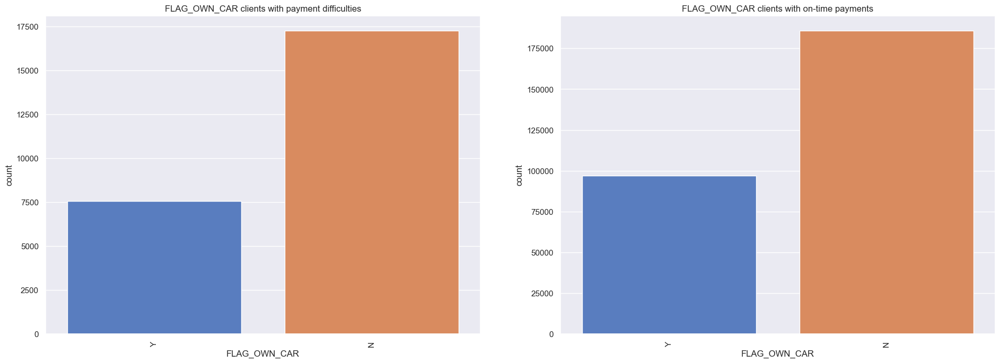

In [200]:
func_uni_countplot('FLAG_OWN_CAR')

### Observations :
- We can't see any solid results in FLAG_OWN_CAR between payment difficulties and on-time payments.

#### Analysis of 'NAME_INCOME_TYPE'

In [201]:
# NAME_INCOME_TYPE with payment difficulties

df1['NAME_INCOME_TYPE'].value_counts().sort_values(ascending = False)

Working                 15224
Commercial associate     5360
Pensioner                2982
State servant            1249
Unemployed                  8
Maternity leave             2
Name: NAME_INCOME_TYPE, dtype: int64

In [202]:
# NAME_INCOME_TYPE on-time payment

df0['NAME_INCOME_TYPE'].value_counts().sort_values(ascending = False)

Working                 143550
Commercial associate     66257
Pensioner                52380
State servant            20454
Student                     18
Unemployed                  14
Businessman                 10
Maternity leave              3
Name: NAME_INCOME_TYPE, dtype: int64

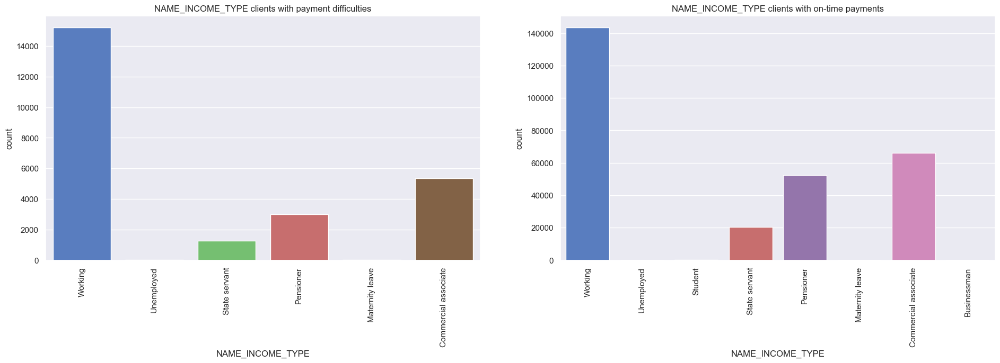

In [203]:
func_uni_countplot('NAME_INCOME_TYPE')

### Observations :

- Student and Business man has no payment difficulties.
- Student have 18 and business man have 10 observations. This is weak correlation.
- Pensioners have more on-time payments.

#### Analysis of 'NAME_EDUCATION_TYPE'

In [204]:
# NAME_EDUCATION_TYPE with payment difficulties

df1['NAME_EDUCATION_TYPE'].value_counts().sort_values(ascending = False)

Secondary / secondary special    19524
Higher education                  4009
Incomplete higher                  872
Lower secondary                    417
Academic degree                      3
Name: NAME_EDUCATION_TYPE, dtype: int64

In [205]:
# NAME_EDUCATION_TYPE on-time payment

df0['NAME_EDUCATION_TYPE'].value_counts().sort_values(ascending = False)

Secondary / secondary special    198867
Higher education                  70854
Incomplete higher                  9405
Lower secondary                    3399
Academic degree                     161
Name: NAME_EDUCATION_TYPE, dtype: int64

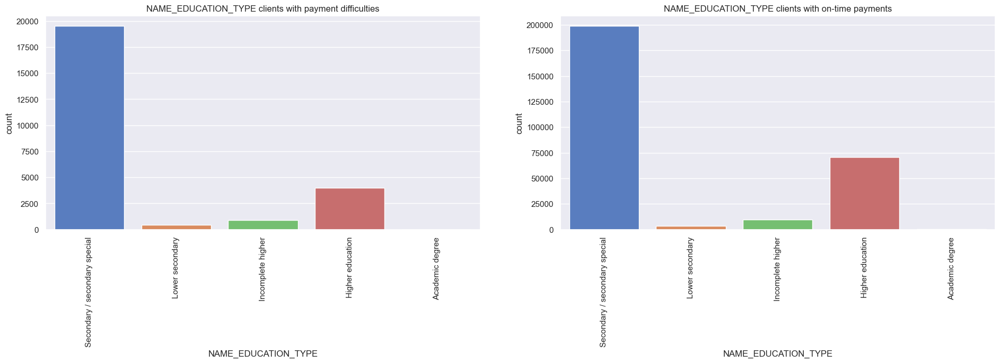

In [206]:
func_uni_countplot('NAME_EDUCATION_TYPE')

### Observations :

- Clients with Higher education have better on-time payments than payment difficulties.

#### Analysis of 'NAME_FAMILY_STATUS'

In [207]:
# NAME_FAMILY_STATUS with payment difficulties

df1['NAME_FAMILY_STATUS'].value_counts().sort_values(ascending = False)

Married                 14850
Single / not married     4457
Civil marriage           2961
Separated                1620
Widow                     937
Name: NAME_FAMILY_STATUS, dtype: int64

In [208]:
# NAME_FAMILY_STATUS on-time payment

df0['NAME_FAMILY_STATUS'].value_counts().sort_values(ascending = False)

Married                 181584
Single / not married     40987
Civil marriage           26814
Separated                18150
Widow                    15151
Name: NAME_FAMILY_STATUS, dtype: int64

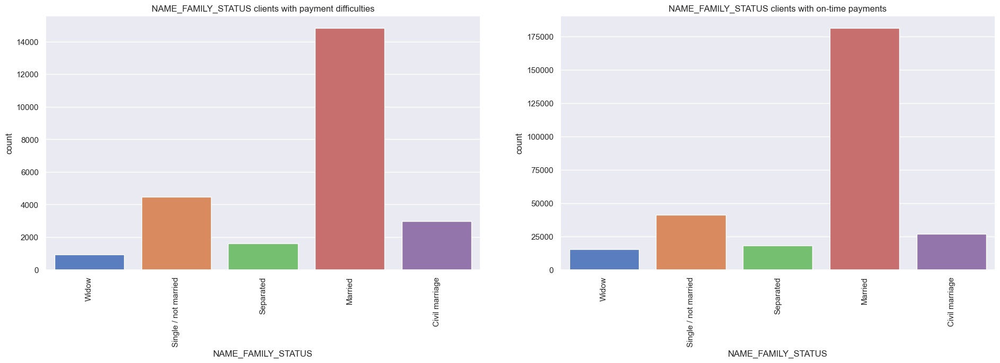

In [209]:
func_uni_countplot('NAME_FAMILY_STATUS')

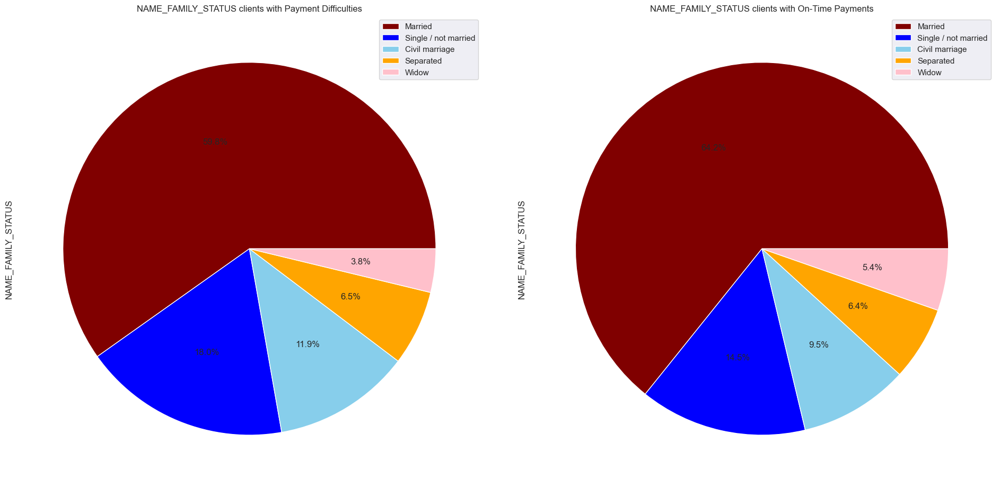

In [210]:
func_uni_piechart('NAME_FAMILY_STATUS')

### Observations :

- Married and Widow do on-time payments. But there is no correlation between this.
- Single / Not Married have more difficulties for on-time payments.

# Correlation Analysis of Numerical Variables :

### Let's check corelation matrix with payment difficulties :

In [211]:
corr1 = df1.select_dtypes(include = ['int64', 'float64']).corr()

In [212]:
corr1.head()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,YEARS_BIRTH,YEAR_EMPLOYED,YEARS_REGISTRATION,YEAR_ID_PUBLISH,YEAR_LAST_PHONE_CHANGE
SK_ID_CURR,1.000000,NaN,-0.005144,-0.010165,-0.001290,-0.007578,-0.001816,0.006301,0.001254,-0.005161,...,-0.007954,-0.002999,0.006436,-0.000880,0.008916,0.001299,-0.005166,-0.006408,0.002450,-0.002190
TARGET,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CNT_CHILDREN,-0.005144,NaN,1.000000,0.004796,-0.001675,0.031257,-0.008112,-0.031975,-0.259109,-0.192864,...,-0.013004,-0.011792,-0.012583,-0.018174,-0.035427,-0.258910,-0.192862,-0.149369,0.032679,-0.012285
AMT_INCOME_TOTAL,-0.010165,NaN,0.004796,1.000000,0.038131,0.046421,0.037583,0.009135,-0.003096,-0.014977,...,-0.000272,0.000018,0.004114,-0.001133,0.001752,-0.002872,-0.014967,0.000144,0.004242,0.002357
AMT_CREDIT,-0.001290,NaN,-0.001675,0.038131,1.000000,0.752195,0.983103,0.069161,0.135316,0.001930,...,0.003008,0.007650,0.055038,-0.017467,-0.035719,0.135318,0.001933,0.025925,0.052461,0.108885


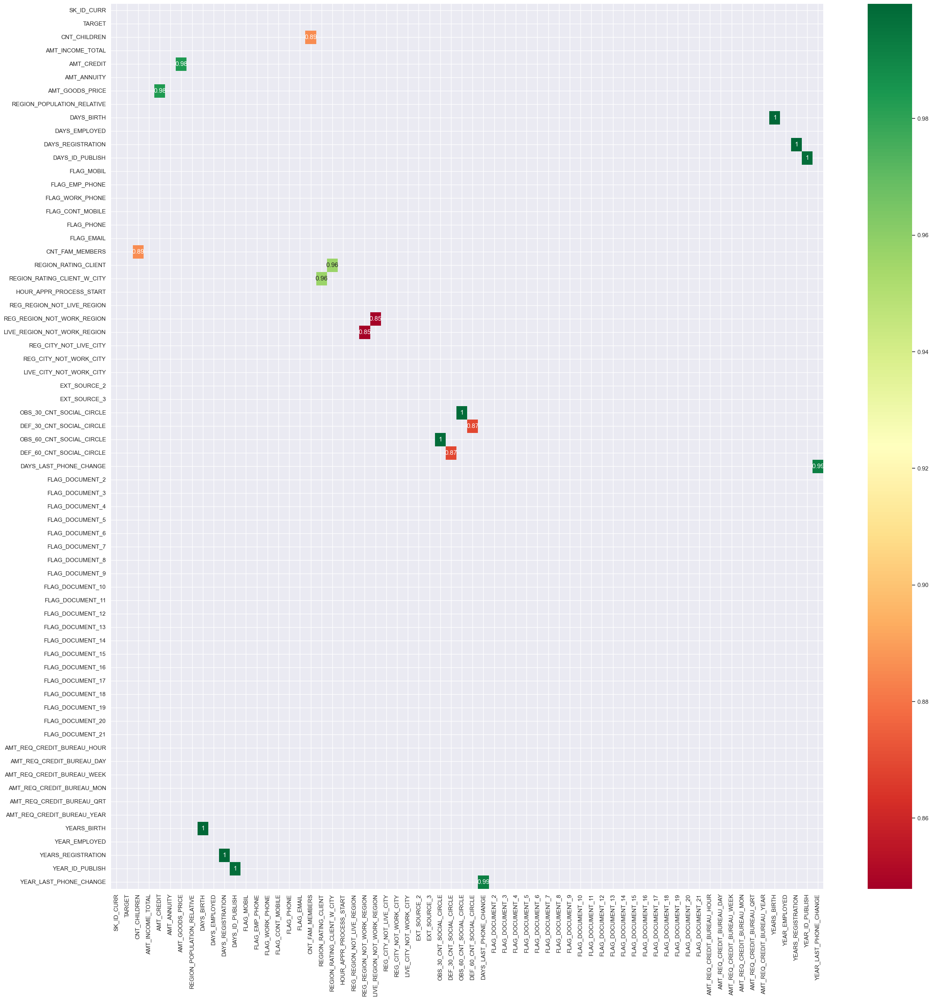

In [213]:
# let's map heatmap for better view :

plt.figure(figsize= [30, 30])
sns.heatmap(data = corr1[(corr1 >= 0.8) & (corr1 < 0.9999)], cmap='RdYlGn', annot=True, cbar=True)
plt.show()

### As we need to find Top 10 correlations, here it is :

In [214]:
corr1[corr1 <= 0.99].unstack().sort_values(ascending = False).head(30)

AMT_GOODS_PRICE              AMT_CREDIT                     0.983103
AMT_CREDIT                   AMT_GOODS_PRICE                0.983103
REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT           0.956637
REGION_RATING_CLIENT         REGION_RATING_CLIENT_W_CITY    0.956637
CNT_FAM_MEMBERS              CNT_CHILDREN                   0.885484
CNT_CHILDREN                 CNT_FAM_MEMBERS                0.885484
DEF_60_CNT_SOCIAL_CIRCLE     DEF_30_CNT_SOCIAL_CIRCLE       0.868994
DEF_30_CNT_SOCIAL_CIRCLE     DEF_60_CNT_SOCIAL_CIRCLE       0.868994
LIVE_REGION_NOT_WORK_REGION  REG_REGION_NOT_WORK_REGION     0.847885
REG_REGION_NOT_WORK_REGION   LIVE_REGION_NOT_WORK_REGION    0.847885
LIVE_CITY_NOT_WORK_CITY      REG_CITY_NOT_WORK_CITY         0.778540
REG_CITY_NOT_WORK_CITY       LIVE_CITY_NOT_WORK_CITY        0.778540
AMT_ANNUITY                  AMT_GOODS_PRICE                0.752699
AMT_GOODS_PRICE              AMT_ANNUITY                    0.752699
AMT_ANNUITY                  AMT_C

#### We got many duplicates columns, after removing we'll have as below :

    - AMT_GOODS_PRICE              AMT_CREDIT                     0.983103
    - REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT           0.956637
    - CNT_FAM_MEMBERS              CNT_CHILDREN                   0.885484
    - DEF_60_CNT_SOCIAL_CIRCLE     DEF_30_CNT_SOCIAL_CIRCLE       0.868994
    - LIVE_REGION_NOT_WORK_REGION  REG_REGION_NOT_WORK_REGION     0.847885
    - LIVE_CITY_NOT_WORK_CITY      REG_CITY_NOT_WORK_CITY         0.778540
    - AMT_ANNUITY                  AMT_GOODS_PRICE                0.752699
    - AMT_ANNUITY                  AMT_CREDIT                     0.752195
    - DAYS_EMPLOYED                FLAG_DOCUMENT_6                0.617646
    - DAYS_BIRTH                   DAYS_EMPLOYED                  0.582185


### Let's check corelation matrix with on-time payments :

In [215]:
corr0 = df0.select_dtypes(include = ['int64', 'float64']).corr()

In [216]:
corr0.head()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,YEARS_BIRTH,YEAR_EMPLOYED,YEARS_REGISTRATION,YEAR_ID_PUBLISH,YEAR_LAST_PHONE_CHANGE
SK_ID_CURR,1.000000,NaN,-0.000716,0.001739,-0.000342,0.000068,-0.000205,0.000360,0.001346,0.001744,...,-0.001725,0.002524,0.000054,0.001148,0.004349,0.001324,0.001744,0.001535,0.000123,0.001052
TARGET,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CNT_CHILDREN,-0.000716,NaN,1.000000,0.027397,0.003081,0.020905,-0.000525,-0.024363,-0.336966,-0.245174,...,0.000648,-0.001632,-0.010455,-0.007087,-0.042547,-0.336847,-0.245174,-0.185586,0.028569,0.008606
AMT_INCOME_TOTAL,0.001739,NaN,0.027397,1.000000,0.342799,0.418953,0.349462,0.167851,-0.062609,-0.140392,...,0.007862,0.006234,0.061470,0.013128,0.029536,-0.062597,-0.140389,-0.064963,-0.022840,0.041174
AMT_CREDIT,-0.000342,NaN,0.003081,0.342799,1.000000,0.771309,0.987250,0.100604,0.047378,-0.070104,...,0.004409,-0.001883,0.054071,0.017767,-0.048866,0.047426,-0.070102,-0.013409,0.001405,0.068155


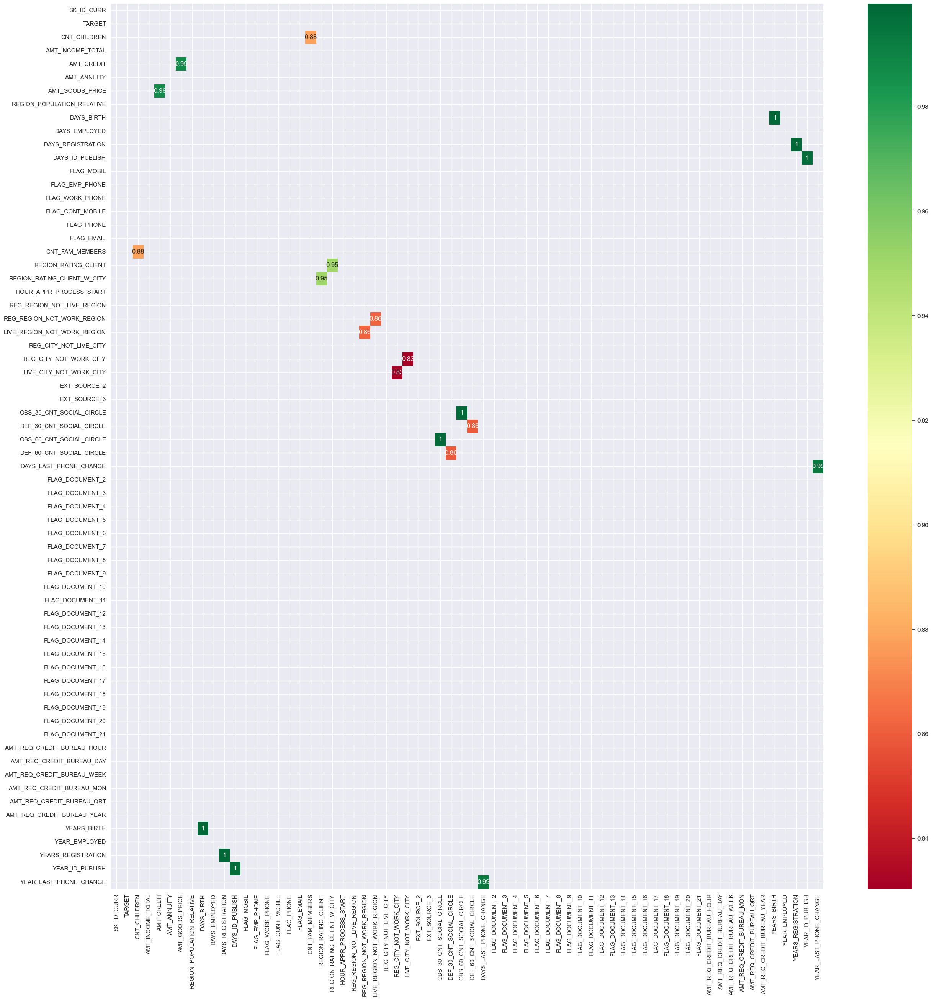

In [217]:
# let's map heatmap for better view :

plt.figure(figsize= [30, 30])
sns.heatmap(data = corr0[(corr0 >= 0.8) & (corr0 < 0.9999)], cmap='RdYlGn', annot=True, cbar=True)
plt.show()

### As we need to find Top 10 correlations, here it is :

In [218]:
corr0[corr0 <= 0.99].unstack().sort_values(ascending = False).head(30)

AMT_CREDIT                   AMT_GOODS_PRICE                0.987250
AMT_GOODS_PRICE              AMT_CREDIT                     0.987250
REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT           0.950149
REGION_RATING_CLIENT         REGION_RATING_CLIENT_W_CITY    0.950149
CNT_CHILDREN                 CNT_FAM_MEMBERS                0.878571
CNT_FAM_MEMBERS              CNT_CHILDREN                   0.878571
REG_REGION_NOT_WORK_REGION   LIVE_REGION_NOT_WORK_REGION    0.861861
LIVE_REGION_NOT_WORK_REGION  REG_REGION_NOT_WORK_REGION     0.861861
DEF_60_CNT_SOCIAL_CIRCLE     DEF_30_CNT_SOCIAL_CIRCLE       0.859332
DEF_30_CNT_SOCIAL_CIRCLE     DEF_60_CNT_SOCIAL_CIRCLE       0.859332
REG_CITY_NOT_WORK_CITY       LIVE_CITY_NOT_WORK_CITY        0.830381
LIVE_CITY_NOT_WORK_CITY      REG_CITY_NOT_WORK_CITY         0.830381
AMT_ANNUITY                  AMT_GOODS_PRICE                0.776686
AMT_GOODS_PRICE              AMT_ANNUITY                    0.776686
AMT_CREDIT                   AMT_A

#### We got many duplicates columns, after removing we'll have as below :

    - AMT_CREDIT                   AMT_GOODS_PRICE                0.987250
    - REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT           0.950149
    - CNT_CHILDREN                 CNT_FAM_MEMBERS                0.878571
    - REG_REGION_NOT_WORK_REGION   LIVE_REGION_NOT_WORK_REGION    0.861861
    - DEF_60_CNT_SOCIAL_CIRCLE     DEF_30_CNT_SOCIAL_CIRCLE       0.859332
    - REG_CITY_NOT_WORK_CITY       LIVE_CITY_NOT_WORK_CITY        0.830381
    - AMT_ANNUITY                  AMT_GOODS_PRICE                0.776686
    - AMT_CREDIT                   AMT_ANNUITY                    0.771309
    - DAYS_EMPLOYED                DAYS_BIRTH                     0.626114
    - FLAG_DOCUMENT_6              YEAR_EMPLOYED                  0.596277

## Observations :
    - Most of the correlations are same in both the cases except few minor differences.
    - AMT_CREDIT & AMT_GOODS_PRICE combination has the highest correlation.
    - In Payment difficulties data, highest correlation is between AMT_GOODS_PRICE & AMT_CREDIT for 0.98%
    - In On-Time Payment data, highest correlation is between AMT_GOODS_PRICE & AMT_CREDIT for 0.99%

# Univariate Analysis of Numerical Variables :

### Analysis of AMT_CREDIT

#### Check the outlier of AMT_CREDIT with payment difficulties :

In [219]:
Q1 = df1['AMT_CREDIT'].quantile(0.25)
Q3 = df1['AMT_CREDIT'].quantile(0.75)
IQR = Q3 - Q1
IQR

448915.5

In [220]:
# Values before (Q1 - 1.5 * IQR) and (Q3 + 1.5 * IQR) are outliers

MinVal1 = (Q1 - 1.5 * IQR)
MaxVal1 = (Q3 + 1.5 * IQR)
print('Min value before outlier :', MinVal1)
print('Max value after outlier :', MaxVal1)

Min value before outlier : -388973.25
Max value after outlier : 1406688.75


#### Check the outlier of AMT_CREDIT with on-time payment :

In [221]:
Q1 = df0['AMT_CREDIT'].quantile(0.25)
Q3 = df0['AMT_CREDIT'].quantile(0.75)
IQR = Q3 - Q1
IQR

540000.0

In [222]:
# Values before (Q1 - 1.5 * IQR) and (Q3 + 1.5 * IQR) are outliers

MinVal0 = (Q1 - 1.5 * IQR)
MaxVal0 = (Q3 + 1.5 * IQR)
print('Min value before outlier :', MinVal0)
print('Max value after outlier :', MaxVal0)

Min value before outlier : -540000.0
Max value after outlier : 1620000.0


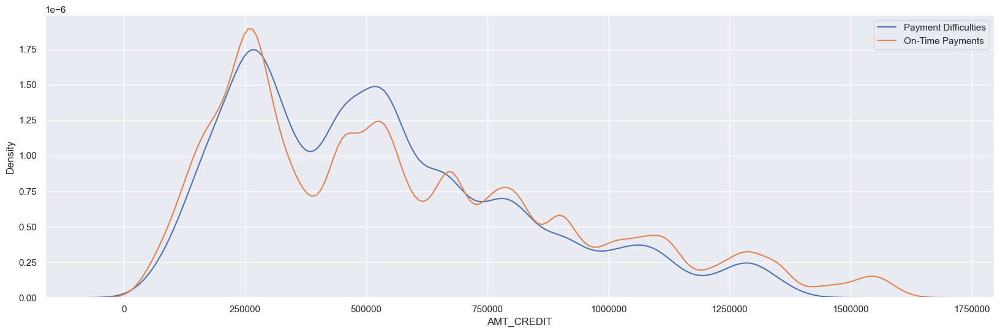

In [223]:
# Let's plot distplot and will remove Outliers :

plt.figure(figsize= [20, 6])
sns.distplot( df1[df1['AMT_CREDIT'] <= MaxVal1].AMT_CREDIT, label = 'Payment Difficulties', hist=False)
sns.distplot( df0[df0['AMT_CREDIT'] <= MaxVal0].AMT_CREDIT,label = 'On-Time Payments', hist=False)
plt.ticklabel_format(style='plain', axis='x')
#plt.xticks(rotation = 90)
plt.legend()
plt.show()

## Observations :
- AMT_CREDIT between 2,50,000 and 7,50,000, client have payment difficulties.
- AMT_CREDIT after 7,50,000, more clients are doing on-time payments.

### Analysis of YEARS_BIRTH

#### Check the outlier of YEARS_BIRTH with payment difficulties :

In [224]:
Q1 = df1['YEARS_BIRTH'].quantile(0.25)
Q3 = df1['YEARS_BIRTH'].quantile(0.75)
IQR = Q3 - Q1
IQR

18.0

In [225]:
# Values before (Q1 - 1.5 * IQR) and (Q3 + 1.5 * IQR) are outliers

MinVal1 = (Q1 - 1.5 * IQR)
MaxVal1 = (Q3 + 1.5 * IQR)
print('Min value before outlier :', MinVal1)
print('Max value after outlier :', MaxVal1)

Min value before outlier : 4.0
Max value after outlier : 76.0


#### Check the outlier of YEARS_BIRTH with on-time payment :

In [226]:
Q1 = df0['YEARS_BIRTH'].quantile(0.25)
Q3 = df0['YEARS_BIRTH'].quantile(0.75)
IQR = Q3 - Q1
IQR

20.0

In [227]:
# Values before (Q1 - 1.5 * IQR) and (Q3 + 1.5 * IQR) are outliers

MinVal0 = (Q1 - 1.5 * IQR)
MaxVal0 = (Q3 + 1.5 * IQR)
print('Min value before outlier :', MinVal0)
print('Max value after outlier :', MaxVal0)

Min value before outlier : 4.0
Max value after outlier : 84.0


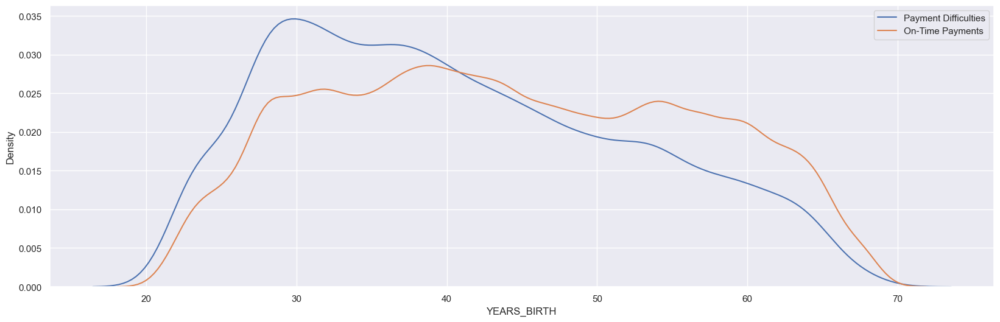

In [228]:
# Let's plot distplot and will remove Outliers :

plt.figure(figsize= [20, 6])
sns.distplot( df1[df1['YEARS_BIRTH'] <= MaxVal1].YEARS_BIRTH, label = 'Payment Difficulties', hist=False)
sns.distplot( df0[df0['YEARS_BIRTH'] <= MaxVal0].YEARS_BIRTH,label = 'On-Time Payments', hist=False)
plt.ticklabel_format(style='plain', axis='x')
#plt.xticks(rotation = 90)
plt.legend()
plt.show()

## Observations :
- For YEARS_BIRTH, age between 20 to 40 has more payment difficulties.
- Age after 30 are more clients with on-time payments.

### Analysis of AMT_GOODS_PRICE

#### Check the outlier of AMT_GOODS_PRICE with payment difficulties :

In [229]:
Q1 = df1['AMT_GOODS_PRICE'].quantile(0.25)
Q3 = df1['AMT_GOODS_PRICE'].quantile(0.75)
IQR = Q3 - Q1
IQR

436500.0

In [230]:
# Values before (Q1 - 1.5 * IQR) and (Q3 + 1.5 * IQR) are outliers

MinVal1 = (Q1 - 1.5 * IQR)
MaxVal1 = (Q3 + 1.5 * IQR)
print('Min value before outlier :', MinVal1)
print('Max value after outlier :', MaxVal1)

Min value before outlier : -416250.0
Max value after outlier : 1329750.0


#### Check the outlier of AMT_GOODS_PRICE  with on-time payment :

In [231]:
Q1 = df0['AMT_GOODS_PRICE'].quantile(0.25)
Q3 = df0['AMT_GOODS_PRICE'].quantile(0.75)
IQR = Q3 - Q1
IQR

450000.0

In [232]:
# Values before (Q1 - 1.5 * IQR) and (Q3 + 1.5 * IQR) are outliers

MinVal0 = (Q1 - 1.5 * IQR)
MaxVal0 = (Q3 + 1.5 * IQR)
print('Min value before outlier :', MinVal0)
print('Max value after outlier :', MaxVal0)

Min value before outlier : -436500.0
Max value after outlier : 1363500.0


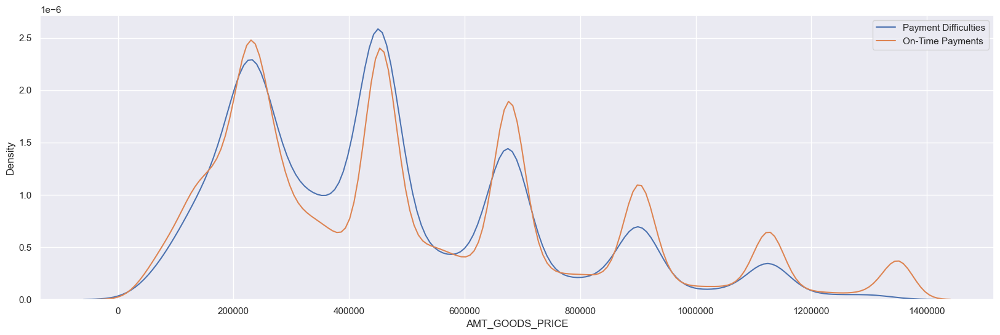

In [233]:
# Let's plot distplot and will remove Outliers :

plt.figure(figsize= [20, 6])
sns.distplot( df1[df1['AMT_GOODS_PRICE'] <= MaxVal1].AMT_GOODS_PRICE, label = 'Payment Difficulties', hist=False)
sns.distplot( df0[df0['AMT_GOODS_PRICE'] <= MaxVal0].AMT_GOODS_PRICE,label = 'On-Time Payments', hist=False)
plt.ticklabel_format(style='plain', axis='x')
#plt.xticks(rotation = 90)
plt.legend()
plt.show()

## Observations :
- For AMT_GOODS_PRICE between 2,50,000 and 5,50,000 there are more clients with Payment difficulties.

### Analysis of DAYS_EMPLOYED

#### Check the outlier of DAYS_EMPLOYED with payment difficulties :

In [234]:
Q1 = df1['DAYS_EMPLOYED'].quantile(0.25)
Q3 = df1['DAYS_EMPLOYED'].quantile(0.75)
IQR = Q3 - Q1
IQR

2603.0

In [235]:
# Values before (Q1 - 1.5 * IQR) and (Q3 + 1.5 * IQR) are outliers

MinVal1 = (Q1 - 1.5 * IQR)
MaxVal1 = (Q3 + 1.5 * IQR)
print('Min value before outlier :', MinVal1)
print('Max value after outlier :', MaxVal1)

Min value before outlier : -3227.5
Max value after outlier : 7184.5


#### Check the outlier of DAYS_EMPLOYED  with on-time payment :

In [236]:
Q1 = df0['DAYS_EMPLOYED'].quantile(0.25)
Q3 = df0['DAYS_EMPLOYED'].quantile(0.75)
IQR = Q3 - Q1
IQR

5107.0

In [237]:
# Values before (Q1 - 1.5 * IQR) and (Q3 + 1.5 * IQR) are outliers

MinVal0 = (Q1 - 1.5 * IQR)
MaxVal0 = (Q3 + 1.5 * IQR)
print('Min value before outlier :', MinVal0)
print('Max value after outlier :', MaxVal0)

Min value before outlier : -6693.5
Max value after outlier : 13734.5


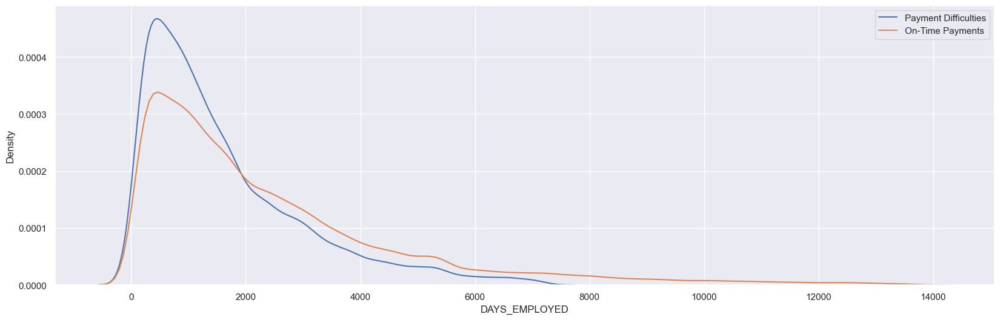

In [238]:
# Let's plot distplot and will remove Outliers :

plt.figure(figsize= [20, 6])
sns.distplot( df1[df1['DAYS_EMPLOYED'] <= MaxVal1].DAYS_EMPLOYED, label = 'Payment Difficulties', hist=False)
sns.distplot( df0[df0['DAYS_EMPLOYED'] <= MaxVal0].DAYS_EMPLOYED,label = 'On-Time Payments', hist=False)
plt.ticklabel_format(style='plain', axis='x')
#plt.xticks(rotation = 90)
plt.legend()
plt.show()

## Observations :
- Less than 2000 DAYS_EMPLOYED clients have payment issues.
- More than 2000 DAYS_EMPLOYES have more clients do on-time payments.

### Analysis of CNT_CHILDREN

#### Check the outlier of CNT_CHILDREN with payment difficulties :

In [239]:
Q1 = df1['CNT_CHILDREN'].quantile(0.25)
Q3 = df1['CNT_CHILDREN'].quantile(0.75)
IQR = Q3 - Q1
IQR

1.0

In [240]:
# Values before (Q1 - 1.5 * IQR) and (Q3 + 1.5 * IQR) are outliers

MinVal1 = (Q1 - 1.5 * IQR)
MaxVal1 = (Q3 + 1.5 * IQR)
print('Min value before outlier :', MinVal1)
print('Max value after outlier :', MaxVal1)

Min value before outlier : -1.5
Max value after outlier : 2.5


#### Check the outlier of CNT_CHILDREN  with on-time payment :

In [241]:
Q1 = df0['CNT_CHILDREN'].quantile(0.25)
Q3 = df0['CNT_CHILDREN'].quantile(0.75)
IQR = Q3 - Q1
IQR

1.0

In [242]:
# Values before (Q1 - 1.5 * IQR) and (Q3 + 1.5 * IQR) are outliers

MinVal0 = (Q1 - 1.5 * IQR)
MaxVal0 = (Q3 + 1.5 * IQR)
print('Min value before outlier :', MinVal0)
print('Max value after outlier :', MaxVal0)

Min value before outlier : -1.5
Max value after outlier : 2.5


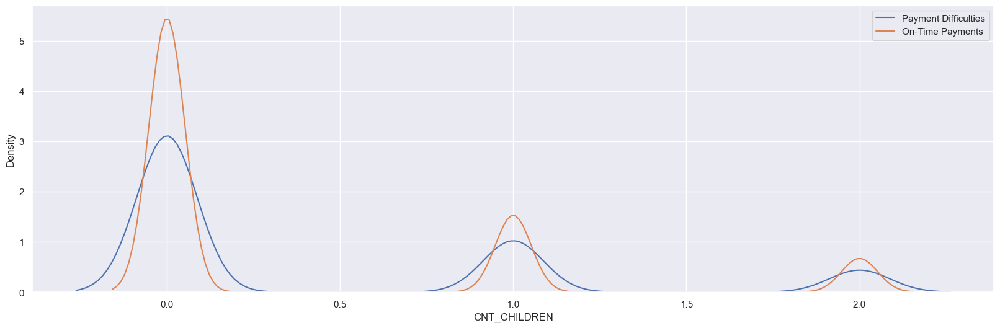

In [243]:
# Let's plot distplot and will remove Outliers :

plt.figure(figsize= [20, 6])
sns.distplot( df1[df1['CNT_CHILDREN'] <= MaxVal1].CNT_CHILDREN, label = 'Payment Difficulties', hist=False)
sns.distplot( df0[df0['CNT_CHILDREN'] <= MaxVal0].CNT_CHILDREN,label = 'On-Time Payments', hist=False)
plt.ticklabel_format(style='plain', axis='x')
#plt.xticks(rotation = 90)
plt.legend()
plt.show()

## Observations :
- For CNT_CHILDREN 0 has on-time payments.
- Those who has 1 or more than that Children also do on-time payments. 

### Analysis of AMT_INCOME_TOTAL

#### Check the outlier of AMT_INCOME_TOTAL with payment difficulties :

In [244]:
Q1 = df1['AMT_INCOME_TOTAL'].quantile(0.25)
Q3 = df1['AMT_INCOME_TOTAL'].quantile(0.75)
IQR = Q3 - Q1
IQR

90000.0

In [245]:
# Values before (Q1 - 1.5 * IQR) and (Q3 + 1.5 * IQR) are outliers

MinVal1 = (Q1 - 1.5 * IQR)
MaxVal1 = (Q3 + 1.5 * IQR)
print('Min value before outlier :', MinVal1)
print('Max value after outlier :', MaxVal1)

Min value before outlier : -22500.0
Max value after outlier : 337500.0


#### Check the outlier of AMT_INCOME_TOTAL  with on-time payment :

In [246]:
Q1 = df0['AMT_INCOME_TOTAL'].quantile(0.25)
Q3 = df0['AMT_INCOME_TOTAL'].quantile(0.75)
IQR = Q3 - Q1
IQR

90000.0

In [247]:
# Values before (Q1 - 1.5 * IQR) and (Q3 + 1.5 * IQR) are outliers

MinVal0 = (Q1 - 1.5 * IQR)
MaxVal0 = (Q3 + 1.5 * IQR)
print('Min value before outlier :', MinVal0)
print('Max value after outlier :', MaxVal0)

Min value before outlier : -22500.0
Max value after outlier : 337500.0


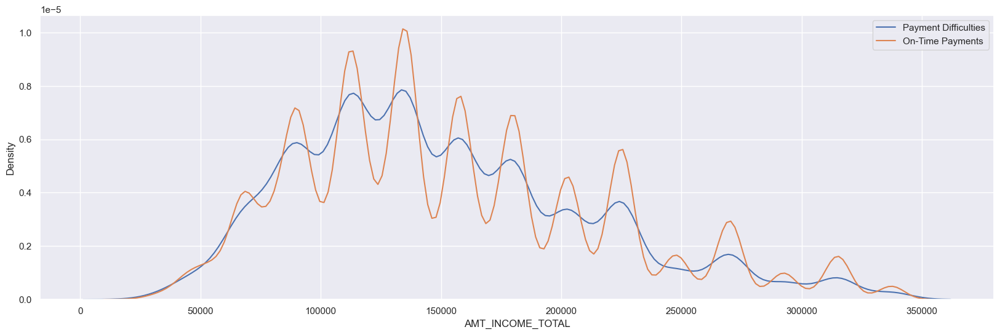

In [248]:
# Let's plot distplot and will remove Outliers :

plt.figure(figsize= [20, 6])
sns.distplot( df1[df1['AMT_INCOME_TOTAL'] <= MaxVal1].AMT_INCOME_TOTAL, label = 'Payment Difficulties', hist=False)
sns.distplot( df0[df0['AMT_INCOME_TOTAL'] <= MaxVal0].AMT_INCOME_TOTAL,label = 'On-Time Payments', hist=False)
plt.ticklabel_format(style='plain', axis='x')
#plt.xticks(rotation = 90)
plt.legend()
plt.show()

## Observations :
- There is no solid observations for those clients who do on-time payments.
- But we can see normal distribution for clients with payment difficulties.

# Multivariate Analysis :

### Analysis of Continuous Vs Continuous variable

#### Function for numerical columns to calculate Min and Max outlier :

In [249]:
def outlier_range(dataset,column):
    Q1 = dataset[column].quantile(0.25)
    Q3 = dataset[column].quantile(0.75)
    IQR = Q3 - Q1
    Min_value = (Q1 - 1.5 * IQR)
    Max_value = (Q3 + 1.5 * IQR)
    return Max_value

##### Let's analysed AMT_GOODS_PRICE and AMT_CREDIT

In [250]:
# Outliner analysis of AMT_GOOD_PRICE with payment difficulties

max_val1_agp = outlier_range(df1, 'AMT_GOODS_PRICE')
max_val1_agp

1329750.0

In [251]:
# Outliner analysis of AMT_CREDIT with payment difficulties

max_val1_ac = outlier_range(df1, 'AMT_CREDIT')
max_val1_ac

1406688.75

In [252]:
# Outliner analysis of AMT_GOOD_PRICE with on-time payment:

max_val0_agp = outlier_range(df0, 'AMT_GOODS_PRICE')
max_val0_agp

1363500.0

In [253]:
# Outliner analysis of AMT_CREDIT with on-time payment:

max_val0_ac = outlier_range(df0, 'AMT_CREDIT')
max_val0_ac

1620000.0

### Now plot to compare two variables using Scatterplot and also removing Outliers :

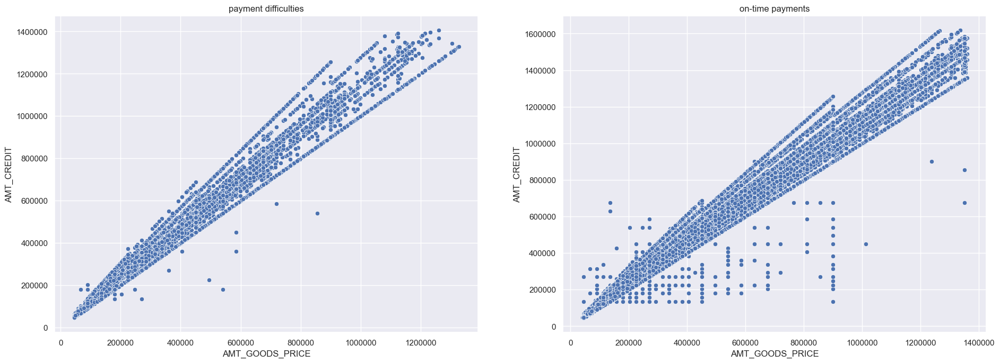

In [254]:
plt.figure(figsize = [20,8])

plt.subplot(1,2,1)
plt.title('payment difficulties')
sns.scatterplot(x = df1[df1['AMT_GOODS_PRICE'] < max_val1_agp].AMT_GOODS_PRICE, 
                y = df1[df1['AMT_CREDIT'] < max_val1_ac].AMT_CREDIT, data = df1)
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.subplot(1,2,2)
plt.title('on-time payments')
sns.scatterplot(x = df0[df0['AMT_GOODS_PRICE'] < max_val0_agp].AMT_GOODS_PRICE, 
                y = df0[df0['AMT_CREDIT'] < max_val0_ac].AMT_CREDIT, data = df0)
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.tight_layout(pad = 4)
plt.show()

### Observations :
    - It's a strong correlation b/w AMT_GOODS_PRICE and AMT_CREDIT.
    - As good price increses along with that credit amount also increses.

##### Let's analysed AMT_ANNUITY and AMT_CREDIT

In [255]:
# Outliner analysis of AMT_ANNUITY with payment difficulties

max_val1_amt_annuity = outlier_range(df1, 'AMT_ANNUITY')
max_val1_amt_annuity

56398.5

In [256]:
# Outliner analysis of AMT_CREDIT with payment difficulties

max_val1_ac = outlier_range(df1, 'AMT_CREDIT')
max_val1_ac

1406688.75

In [257]:
# Outliner analysis of AMT_ANNUITY with on-time payment:

max_val0_amt_annuity = outlier_range(df0, 'AMT_ANNUITY')
max_val0_amt_annuity

62187.75

In [258]:
# Outliner analysis of AMT_CREDIT with  on-time payment:

max_val0_ac = outlier_range(df0, 'AMT_CREDIT')
max_val0_ac

1620000.0

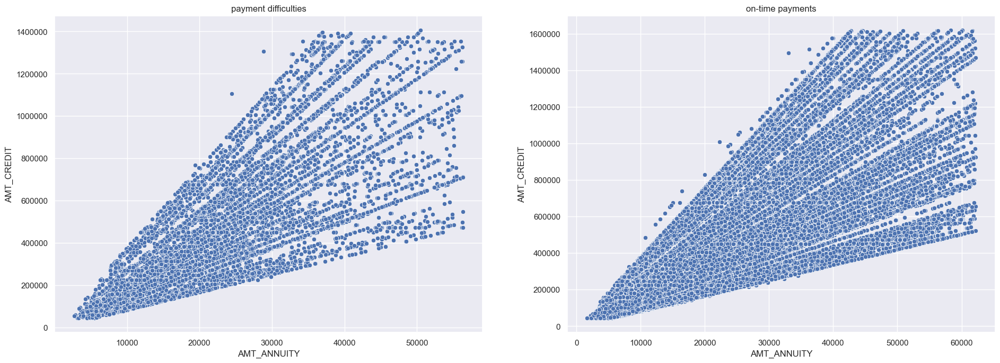

In [259]:
plt.figure(figsize = [20,8])

plt.subplot(1,2,1)
plt.title('payment difficulties')
sns.scatterplot(x = df1[df1['AMT_ANNUITY'] < max_val1_amt_annuity].AMT_ANNUITY, 
                y = df1[df1['AMT_CREDIT'] < max_val1_ac].AMT_CREDIT, data = df1)

plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.subplot(1,2,2)
plt.title('on-time payments')
sns.scatterplot(x = df0[df0['AMT_ANNUITY'] < max_val0_amt_annuity].AMT_ANNUITY, 
                y = df0[df0['AMT_CREDIT'] < max_val0_ac].AMT_CREDIT, data = df0)

plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.tight_layout(pad = 4)
plt.show()

### Observations :
    - It's a strong correlation b/w AMT_ANNUITY and AMT_CREDIT.
    - As annuity price increses along with that credit amount also increses.

##### Let's analysed DAYS_EMPLOYED and AMT_INCOME_TOTAL:

In [260]:
# Outliner analysis of DAYS_EMPLOYED with payment difficulties

max_val1_daysemp = outlier_range(df1, 'DAYS_EMPLOYED')
max_val1_daysemp

7184.5

In [261]:
# Outliner analysis of AMT_INCOME_TOTAL with payment difficulties

max_val1_amt_income_tot = outlier_range(df1, 'AMT_INCOME_TOTAL')
max_val1_amt_income_tot

337500.0

In [262]:
# Outliner analysis of DAYS_EMPLOYED with on-time payment:

max_val0_daysemp = outlier_range(df0, 'DAYS_EMPLOYED')
max_val0_daysemp

13734.5

In [263]:
# Outliner analysis of AMT_INCOME_TOTAL with  on-time payment:

max_val0_amt_income_tot = outlier_range(df0, 'AMT_INCOME_TOTAL')
max_val0_amt_income_tot

337500.0

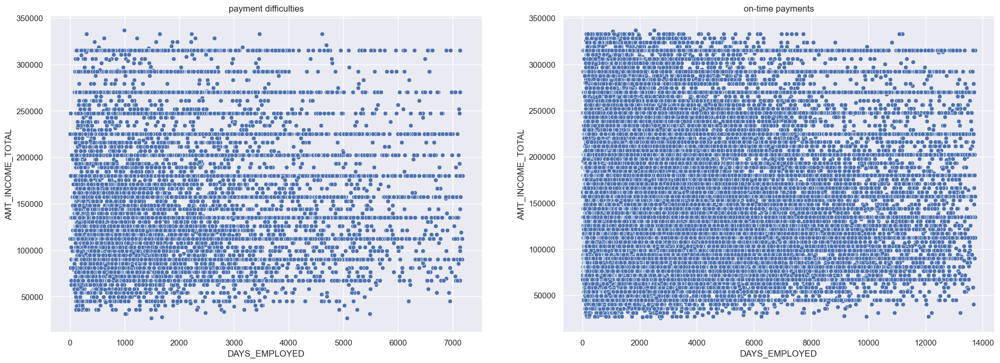

In [264]:
# let's plot to undesrtsnad :


plt.figure(figsize = [20,8])

plt.subplot(1,2,1)
plt.title('payment difficulties')
sns.scatterplot(x = df1[df1['DAYS_EMPLOYED'] < max_val1_daysemp].DAYS_EMPLOYED, 
                y = df1[df1['AMT_INCOME_TOTAL'] < max_val1_amt_income_tot].AMT_INCOME_TOTAL, data = df1)

plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.subplot(1,2,2)
plt.title('on-time payments')
sns.scatterplot(x = df0[df0['DAYS_EMPLOYED'] < max_val0_daysemp].DAYS_EMPLOYED, 
                y = df0[df0['AMT_INCOME_TOTAL'] < max_val0_amt_income_tot].AMT_INCOME_TOTAL, data = df0)

plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.tight_layout(pad = 4)
plt.show()

## Observations :
- In payment difficulties, clients who's working days are > 3000 they don't have that juch difficulties.
- Working days > 5000 are doing on-time payments.

##### Let's analysed AMT_ANNUITY and AMT_GOODS_PRICE :

In [265]:
# Outliner analysis of AMT_ANNUITY with payment difficulties

max_val1_amt_annuity = outlier_range(df1, 'AMT_ANNUITY')
max_val1_amt_annuity

56398.5

In [266]:
# Outliner analysis of AMT_GOOD_PRICE with payment difficulties

max_val1_agp = outlier_range(df1, 'AMT_GOODS_PRICE')
max_val1_agp

1329750.0

In [267]:
# Outliner analysis of AMT_ANNUITY with on-time payment

max_val1_amt_annuity = outlier_range(df0, 'AMT_ANNUITY')
max_val1_amt_annuity

62187.75

In [268]:
# Outliner analysis of AMT_GOOD_PRICE with on-time payment

max_val1_agp = outlier_range(df0, 'AMT_GOODS_PRICE')
max_val1_agp

1363500.0

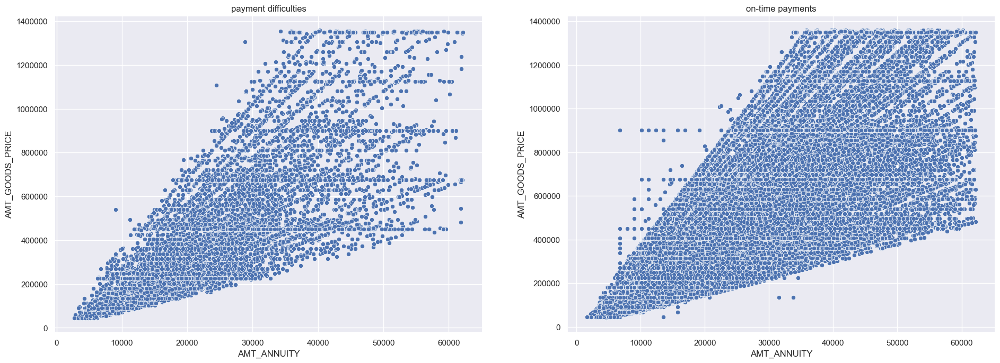

In [269]:
# let's plot to undesrtsnad :

plt.figure(figsize = [20,8])

plt.subplot(1,2,1)
plt.title('payment difficulties')
sns.scatterplot(x = df1[df1['AMT_ANNUITY'] < max_val1_amt_annuity].AMT_ANNUITY,
                y = df1[df1['AMT_GOODS_PRICE'] < max_val1_agp].AMT_GOODS_PRICE, data = df1)

plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.subplot(1,2,2)
plt.title('on-time payments')
sns.scatterplot(x = df0[df0['AMT_ANNUITY'] < max_val0_amt_annuity].AMT_ANNUITY, 
                y = df0[df0['AMT_GOODS_PRICE'] < max_val0_agp].AMT_GOODS_PRICE, data = df0)

plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.tight_layout(pad = 4)
plt.show()

## Observations :
    - Here is the strong correlation b/w AMT_ANNUITY and AMT_GOOD_PRICE. As anuuity increses so does good price too.

##### Analysis of AMT_CREDIT and DAYS_BIRTH

In [270]:
# Outliner analysis of AMT_CREDIT with payment difficulties

max_val1_ac = outlier_range(df1, 'AMT_CREDIT')
max_val1_ac

1406688.75

In [271]:
# Outliner analysis of DAYS_BIRTH with payment difficulties

max_val1_days_birth = outlier_range(df1, 'DAYS_BIRTH')
max_val1_days_birth

27998.5

In [272]:
# Outliner analysis of AMT_CREDIT with payment difficulties

max_val0_ac = outlier_range(df0, 'AMT_CREDIT')
max_val0_ac

1620000.0

In [273]:
# Outliner analysis of DAYS_BIRTH with payment difficulties

max_val0_days_birth = outlier_range(df0, 'DAYS_BIRTH')
max_val0_days_birth

30680.375

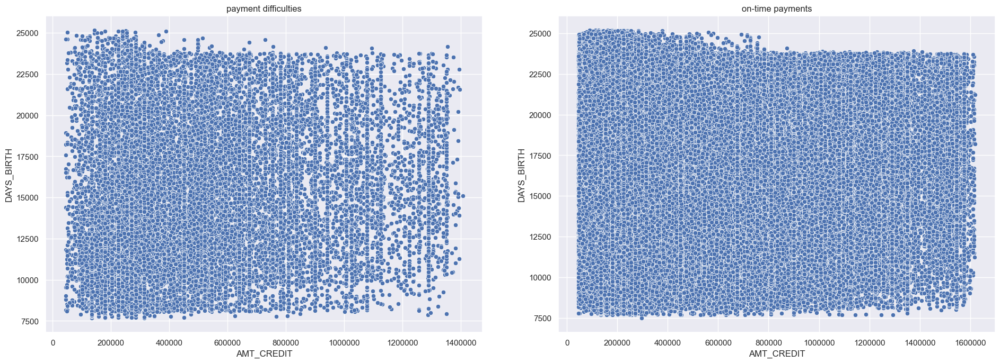

In [274]:
# let's plot to undesrtsnad :

plt.figure(figsize = [20,8])

plt.subplot(1,2,1)
plt.title('payment difficulties')
sns.scatterplot(x = df1[df1['AMT_CREDIT'] < max_val1_ac].AMT_CREDIT,
                y = df1[df1['DAYS_BIRTH'] < max_val1_days_birth].DAYS_BIRTH, data = df1)

plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.subplot(1,2,2)
plt.title('on-time payments')
sns.scatterplot(x = df0[df0['AMT_CREDIT'] < max_val0_ac].AMT_CREDIT, 
                y = df0[df0['DAYS_BIRTH'] < max_val0_days_birth].DAYS_BIRTH, data = df0)

plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.tight_layout(pad = 4)
plt.show()

## Observation:
- Can't see any strong correlation b/w these two variables.

# Continuous vs Categorical variable :

## Analysis of NAME_EDUCATION_TYPE vs AMT_CREDIT vs CODE_GENDER

#### Analysing outliner of AMT_CREDIT with payment difficulties :

In [275]:
max_val1_ac = outlier_range(df1,'AMT_CREDIT')
max_val1_ac

1406688.75

#### Analysing outliner of AMT_CREDIT with on-time payemnts :

In [276]:
max_val0_ac = outlier_range(df0,'AMT_CREDIT')
max_val0_ac

1620000.0

#### client with payment difficulties

In [277]:
df1.groupby(by = ['NAME_EDUCATION_TYPE', 'CODE_GENDER']).AMT_CREDIT.describe().head()

count           mean            std  \
NAME_EDUCATION_TYPE CODE_GENDER                                         
Academic degree     F               3.0  950245.500000  504711.375348   
Higher education    F            2438.0  648500.581624  410415.703440   
                    M            1571.0  642070.944940  409695.934841   
Incomplete higher   F             504.0  520150.348214  352227.493127   
                    M             368.0  554723.816576  347843.706372   

                                      min       25%       50%          75%  \
NAME_EDUCATION_TYPE CODE_GENDER                                              
Academic degree     F            544491.0  667660.5  790830.0  1153122.750   
Higher education    F             47970.0  323595.0  545040.0   877500.000   
                    M             45000.0  329202.0  545040.0   832797.000   
Incomplete higher   F             91692.0  269550.0  450000.0   675000.000   
                    M             74628.0  284400.0  497520.0   699976.125   

                                       max  
NAME_EDUCATION_TYPE CODE_GENDER             
Academic degree     F            1515415.5  
Higher education    F            2687355.0  
                    M            2695500.0  
Incomplete higher   F            2695500.0  
                    M            2013840.0

#### client who do on-time payments :

In [278]:
df0.groupby(by = ['NAME_EDUCATION_TYPE', 'CODE_GENDER']).AMT_CREDIT.describe().head()

count           mean            std  \
NAME_EDUCATION_TYPE CODE_GENDER                                          
Academic degree     F               97.0  708770.737113  463052.418484   
                    M               64.0  735235.382812  497739.972619   
Higher education    F            47852.0  682485.002194  456642.778578   
                    M            23002.0  713144.543844  486073.660453   
Incomplete higher   F             5780.0  555340.534256  385980.597875   

                                      min       25%       50%        75%  \
NAME_EDUCATION_TYPE CODE_GENDER                                            
Academic degree     F            130824.0  354469.5  607500.0  1006920.0   
                    M             74182.5  309519.0  610056.0  1036890.0   
Higher education    F             45000.0  302206.5  568057.5   916470.0   
                    M             45000.0  315000.0  592560.0   973503.0   
Incomplete higher   F             45000.0  253737.0  454500.0   760225.5   

                                       max  
NAME_EDUCATION_TYPE CODE_GENDER             
Academic degree     F            2463840.0  
                    M            1984500.0  
Higher education    F            4050000.0  
                    M            4050000.0  
Incomplete higher   F            2517300.0

In [279]:
def func_bi_boxplot(categorical, continuous, max_continuous1, max_continuous0, hue_column):
    plt.figure(figsize = [20,12])

    plt.subplot(1,2,1)
    plt.title('payment difficulties')
    sns.boxplot(x = categorical, 
                y = df1[df1[continuous] < max_continuous1][continuous], 
                data = df1, 
                order = sorted(df1[categorical].unique(), reverse = True),
                hue = hue_column, hue_order = sorted(df0[hue_column].unique(), reverse = True))
    plt.ticklabel_format(style='plain', axis='y')
    plt.xticks(rotation=90)

    plt.subplot(1,2,2)
    plt.title('On-time payments')
    sns.boxplot(x = categorical, 
                y = df0[df0[continuous] < max_continuous0][continuous], 
                data = df0, 
                order = sorted(df0[categorical].unique(), reverse = True),
                hue = hue_column, hue_order = sorted(df0[hue_column].unique(), reverse = True))
    plt.ticklabel_format(style='plain', axis='y')
    plt.xticks(rotation=90)

    plt.tight_layout(pad = 4)
    plt.show()

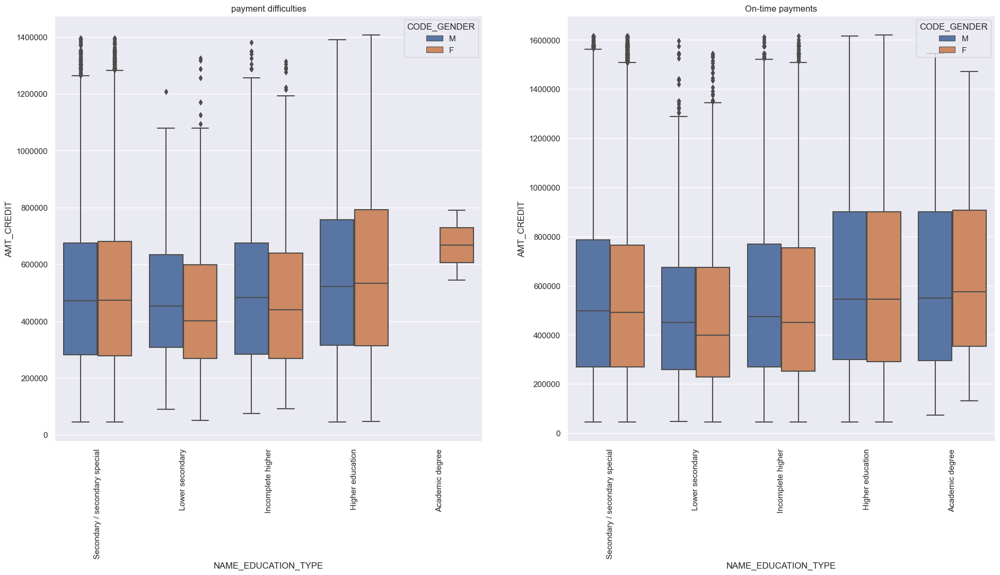

In [280]:
func_bi_boxplot('NAME_EDUCATION_TYPE','AMT_CREDIT',max_val1_ac,max_val0_ac,'CODE_GENDER')

## Observations :
- Male clients do on-time payments who have academic degree.
- Client who have academic degree do on-time payments compare to payment difficulties. They don't face that much difficulties as per the survey.

## Analysis of NAME_FAMILY_STATUS vs AMT_INCOME_TOTAL vs CODE_GENDER

#### Analysing outliner of AMT_INCOME_TOTAL with payment difficulties :

In [281]:
max_val1_amt_income_tot = outlier_range(df1,'AMT_INCOME_TOTAL')
max_val1_amt_income_tot

337500.0

#### Analysing outliner of AMT_INCOME_TOTAL with on-time payments :

In [282]:
max_val0_amt_income_tot = outlier_range(df0,'AMT_INCOME_TOTAL')
max_val0_amt_income_tot

337500.0

#### Client with payment difficulties :

In [283]:
df1.groupby(by = ['NAME_FAMILY_STATUS','CODE_GENDER']).AMT_INCOME_TOTAL.describe().head()

count           mean           std      min  \
NAME_FAMILY_STATUS CODE_GENDER                                                 
Civil marriage     F            1753.0  153620.720194  1.010459e+05  25650.0   
                   M            1208.0  173949.988411  9.244917e+04  36000.0   
Married            F            8324.0  159907.850853  1.283283e+06  27000.0   
                   M            6526.0  182233.063975  9.478777e+04  31500.0   
Separated          F            1045.0  161159.546411  8.263333e+04  36000.0   

                                     25%       50%       75%          max  
NAME_FAMILY_STATUS CODE_GENDER                                             
Civil marriage     F            108000.0  135000.0  180000.0    3150000.0  
                   M            117000.0  157500.0  202500.0    1350000.0  
Married            F             90000.0  135000.0  180000.0  117000000.0  
                   M            126000.0  157500.0  225000.0    1890000.0  
Separated          F            112500.0  135000.0  202500.0     832500.0

#### Client who do on-time payment :

In [284]:
df0.groupby(by = ['NAME_FAMILY_STATUS','CODE_GENDER']).AMT_INCOME_TOTAL.describe().head()

count           mean            std  \
NAME_FAMILY_STATUS CODE_GENDER                                           
Civil marriage     F             19017.0  162086.054245  106811.493431   
                   M              7797.0  184126.294363  106559.488198   
Married            F            114125.0  154289.532323   88593.427099   
                   M             67459.0  199592.828178  147599.764903   
Separated          F             14416.0  166374.209767   94782.184577   

                                    min       25%       50%       75%  \
NAME_FAMILY_STATUS CODE_GENDER                                          
Civil marriage     F            27000.0  112500.0  135000.0  202500.0   
                   M            27000.0  121500.0  157500.0  225000.0   
Married            F            26100.0   94500.0  135000.0  180000.0   
                   M            27000.0  135000.0  180000.0  225000.0   
Separated          F            27000.0  112500.0  139500.0  202500.0   

                                       max  
NAME_FAMILY_STATUS CODE_GENDER              
Civil marriage     F             9000000.0  
                   M             3825000.0  
Married            F             3600000.0  
                   M            18000090.0  
Separated          F             2250000.0

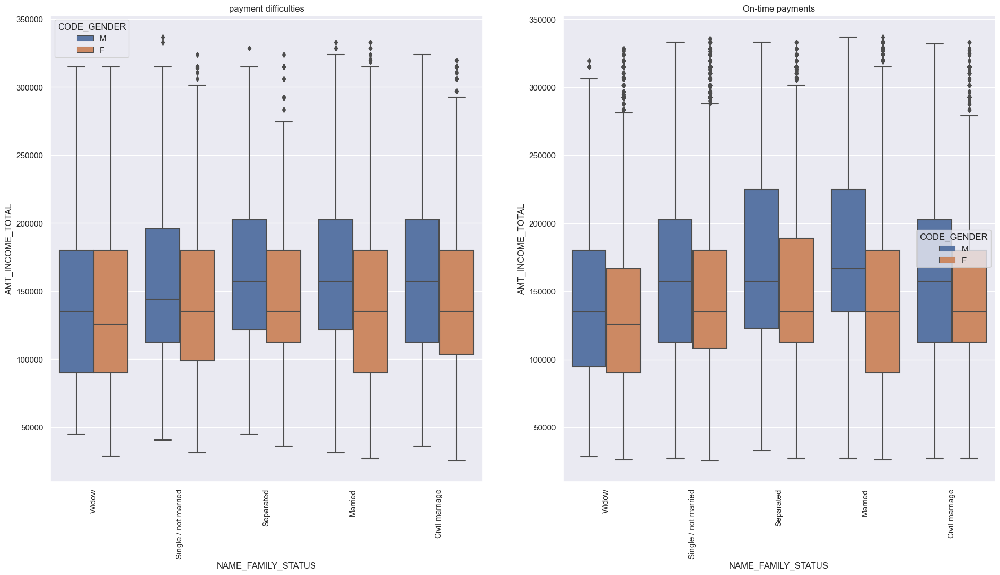

In [285]:
func_bi_boxplot('NAME_FAMILY_STATUS','AMT_INCOME_TOTAL',
                max_val1_amt_income_tot , max_val1_amt_income_tot, 'CODE_GENDER')

### Observations :
- Married & civil marraige have higher range of mean/median payment difficulties.
- Married clients have little bit high mean income for on-time payment compare to payment difficulties.

### Analysis of YEARS_BIRTH_CATEGORY vs AMT_INCOME_TOTAL vs NAME_HOUSING_TYPE

#### Analysing outliner of AMT_INCOME_TOTAL with payment difficulties :

In [286]:
max_val1_amt_income_tot = outlier_range(df1,'AMT_INCOME_TOTAL')
max_val1_amt_income_tot

337500.0

#### Analysing outliner of AMT_INCOME_TOTAL with on-time payments :

In [287]:
max_val0_amt_income_tot = outlier_range(df0,'AMT_INCOME_TOTAL')
max_val0_amt_income_tot

337500.0

#### Client with payment difficulties :

In [288]:
df1.groupby(by = ['YEARS_BIRTH_CATEGORY','NAME_HOUSING_TYPE']).AMT_INCOME_TOTAL.describe().head()

count           mean           std  \
YEARS_BIRTH_CATEGORY NAME_HOUSING_TYPE                                          
20-30                Co-op apartment        40.0  148628.700000  59516.236000   
                     House / apartment    4201.0  151897.216139  70874.650190   
                     Municipal apartment   153.0  153608.823529  78282.787422   
                     Office apartment       40.0  147375.000000  50817.263118   
                     Rented apartment      229.0  144210.104803  59998.658014   

                                              min       25%       50%  \
YEARS_BIRTH_CATEGORY NAME_HOUSING_TYPE                                  
20-30                Co-op apartment      67500.0  110250.0  135000.0   
                     House / apartment    31500.0  112500.0  135000.0   
                     Municipal apartment  45000.0  108000.0  135000.0   
                     Office apartment     67500.0  112500.0  135000.0   
                     Rented apartment     45000.0   99000.0  135000.0   

                                               75%       max  
YEARS_BIRTH_CATEGORY NAME_HOUSING_TYPE                        
20-30                Co-op apartment      185625.0  360000.0  
                     House / apartment    180000.0  810000.0  
                     Municipal apartment  180000.0  675000.0  
                     Office apartment     180000.0  270000.0  
                     Rented apartment     180000.0  405000.0

#### Client who do on-time payment :

In [289]:
df0.groupby(by = ['YEARS_BIRTH_CATEGORY','NAME_HOUSING_TYPE']).AMT_INCOME_TOTAL.describe().head()

count           mean  \
YEARS_BIRTH_CATEGORY NAME_HOUSING_TYPE                             
20-30                Co-op apartment        298.0  161153.154362   
                     House / apartment    33165.0  163944.390551   
                     Municipal apartment   1099.0  166235.077343   
                     Office apartment       455.0  177960.184615   
                     Rented apartment      1535.0  153028.061238   

                                                    std      min       25%  \
YEARS_BIRTH_CATEGORY NAME_HOUSING_TYPE                                       
20-30                Co-op apartment       76171.261949  45000.0  112500.0   
                     House / apartment     92313.182190  27000.0  112500.0   
                     Municipal apartment   88698.468692  45000.0  112500.0   
                     Office apartment     115765.133191  36000.0  112500.0   
                     Rented apartment      70748.987226  29250.0  109125.0   

                                               50%       75%        max  
YEARS_BIRTH_CATEGORY NAME_HOUSING_TYPE                                   
20-30                Co-op apartment      139500.0  202500.0   720000.0  
                     House / apartment    141264.0  202500.0  4500000.0  
                     Municipal apartment  144000.0  202500.0  1417500.0  
                     Office apartment     157500.0  225000.0  1800000.0  
                     Rented apartment     135000.0  180000.0   742500.0

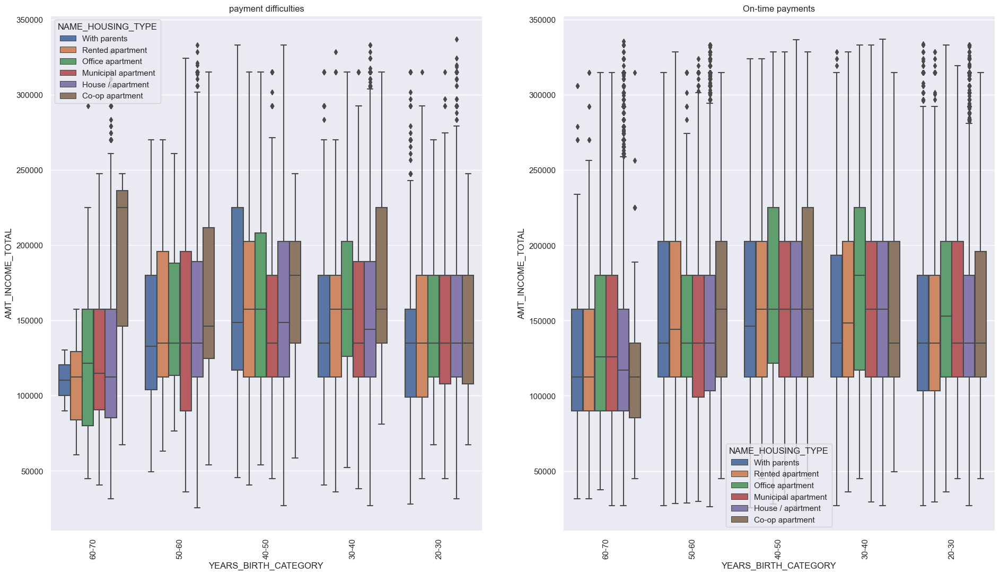

In [290]:
func_bi_boxplot('YEARS_BIRTH_CATEGORY','AMT_INCOME_TOTAL',
                max_val1_amt_income_tot, max_val0_amt_income_tot, 'NAME_HOUSING_TYPE')

### Observations:
- Age b/w 20-30 with Office Apartment have very high income median for on-time payments compare to difficulties.
- Age b/w 60-70 with Co-Op apartment have high income range in payment difficulties.

## Analysis of FLAG_OWN_CAR vs AMT_ANNUITY vs CODE_GENDER

#### Analysing outliner of AMT_ANNUITY with payment difficulties :

In [291]:
max_val1_amt_annuity = outlier_range(df1,'AMT_ANNUITY')
max_val1_amt_annuity

56398.5

#### Analysing outliner of AMT_ANNUITY with on-time payments :

In [292]:
max_val0_amt_annuity = outlier_range(df0,'AMT_ANNUITY')
max_val0_amt_annuity

62187.75

#### Client with payment difficulties :

In [293]:
df1.groupby(by = ['FLAG_OWN_CAR','CODE_GENDER']).AMT_ANNUITY.describe().head()

count          mean           std     min  \
FLAG_OWN_CAR CODE_GENDER                                                
N            F            11567.0  24910.533717  11855.563615  2722.5   
             M             5682.0  26258.836061  12075.777539  3172.5   
Y            F             2603.0  28577.909527  13256.174575  3559.5   
             M             4973.0  29293.817313  13130.940168  4374.0   

                                25%       50%       75%       max  
FLAG_OWN_CAR CODE_GENDER                                           
N            F            16350.750  23715.00  31261.50  149211.0  
             M            17517.375  25202.25  32352.75  127507.5  
Y            F            18969.750  26797.50  35961.75  128178.0  
             M            20007.000  27558.00  36459.00  115803.0

#### client with on-time payment :

In [294]:
df0.groupby(by = ['FLAG_OWN_CAR','CODE_GENDER']).AMT_ANNUITY.describe().head()

count          mean           std     min  \
FLAG_OWN_CAR CODE_GENDER                                                 
N            F            145917.0  25351.258280  13579.026022  1615.5   
             M             39749.0  26799.801001  14295.319107  1980.0   
Y            F             42357.0  29830.221120  15705.982418  1993.5   
             M             54651.0  30200.482077  15988.655901  2317.5   

                              25%      50%      75%       max  
FLAG_OWN_CAR CODE_GENDER                                       
N            F            15448.5  23283.0  32125.5  230161.5  
             M            16294.5  24750.0  34114.5  225000.0  
Y            F            18409.5  27085.5  38133.0  225000.0  
             M            19125.0  27630.0  38322.0  258025.5

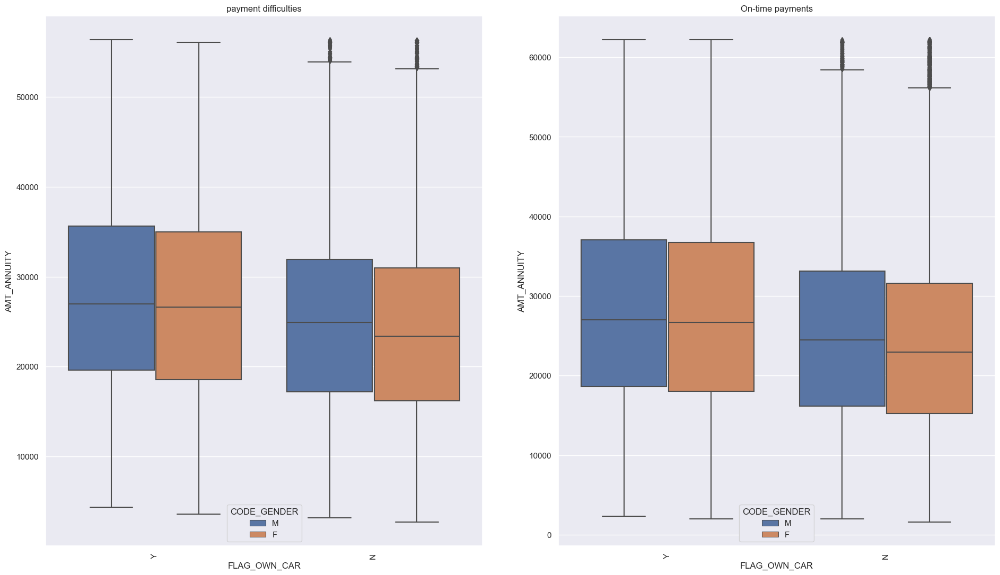

In [295]:
func_bi_boxplot('FLAG_OWN_CAR','AMT_ANNUITY',
                max_val1_amt_annuity, max_val0_amt_annuity,'CODE_GENDER')

### Observations :
- We can't see any notable observations.

## Analysis of NAME_INCOME_TYPE vs AMT_GOODS_PRICE vs CODE_GENDER

#### Analysing outliner of AMT_GOODS_PRICE with payment difficulties :

In [296]:
max_val1_agp = outlier_range(df1,'AMT_GOODS_PRICE')
max_val1_agp

1329750.0

#### Analysing outliner of AMT_GOODS_PRICE with on-time payment :

In [297]:
max_val0_agp = outlier_range(df0,'AMT_GOODS_PRICE')
max_val0_agp

1363500.0

#### client with payment difficulties :

In [298]:
df1.groupby(by = ['NAME_INCOME_TYPE','CODE_GENDER']).AMT_GOODS_PRICE.describe().head()

count           mean            std  \
NAME_INCOME_TYPE     CODE_GENDER                                         
Commercial associate F            2966.0  536362.214262  353710.652628   
                     M            2391.0  526387.309912  335859.941286   
Maternity leave      F               2.0  929250.000000  715945.615951   
Pensioner            F            2241.0  495016.255020  317042.451456   
                     M             739.0  486543.075101  321104.431714   

                                       min       25%       50%        75%  \
NAME_INCOME_TYPE     CODE_GENDER                                            
Commercial associate F             45000.0  270000.0  450000.0   675000.0   
                     M             45000.0  270000.0  450000.0   675000.0   
Maternity leave      F            423000.0  676125.0  929250.0  1182375.0   
Pensioner            F             45000.0  229500.0  450000.0   675000.0   
                     M             45000.0  229500.0  450000.0   675000.0   

                                        max  
NAME_INCOME_TYPE     CODE_GENDER             
Commercial associate F            3600000.0  
                     M            2961000.0  
Maternity leave      F            1435500.0  
Pensioner            F            2173500.0  
                     M            1800000.0

#### client with on-time payment :

In [299]:
df0.groupby(by = ['NAME_INCOME_TYPE','CODE_GENDER']).AMT_GOODS_PRICE.describe().head()

count          mean           std  \
NAME_INCOME_TYPE     CODE_GENDER                                        
Businessman          F                3.0  1.125000e+06  1.031080e+06   
                     M                7.0  1.272857e+06  7.551041e+05   
Commercial associate F            41522.0  6.022426e+05  4.008250e+05   
                     M            24691.0  6.202202e+05  4.224455e+05   
Maternity leave      F                2.0  5.625000e+05  3.500179e+05   

                                       min       25%        50%        75%  \
NAME_INCOME_TYPE     CODE_GENDER                                             
Businessman          F            225000.0  562500.0   900000.0  1575000.0   
                     M            495000.0  607500.0  1350000.0  1800000.0   
Commercial associate F             45000.0  270000.0   472500.0   837000.0   
                     M             45000.0  270000.0   472500.0   900000.0   
Maternity leave      F            315000.0  438750.0   562500.0   686250.0   

                                        max  
NAME_INCOME_TYPE     CODE_GENDER             
Businessman          F            2250000.0  
                     M            2250000.0  
Commercial associate F            4050000.0  
                     M            4050000.0  
Maternity leave      F             810000.0

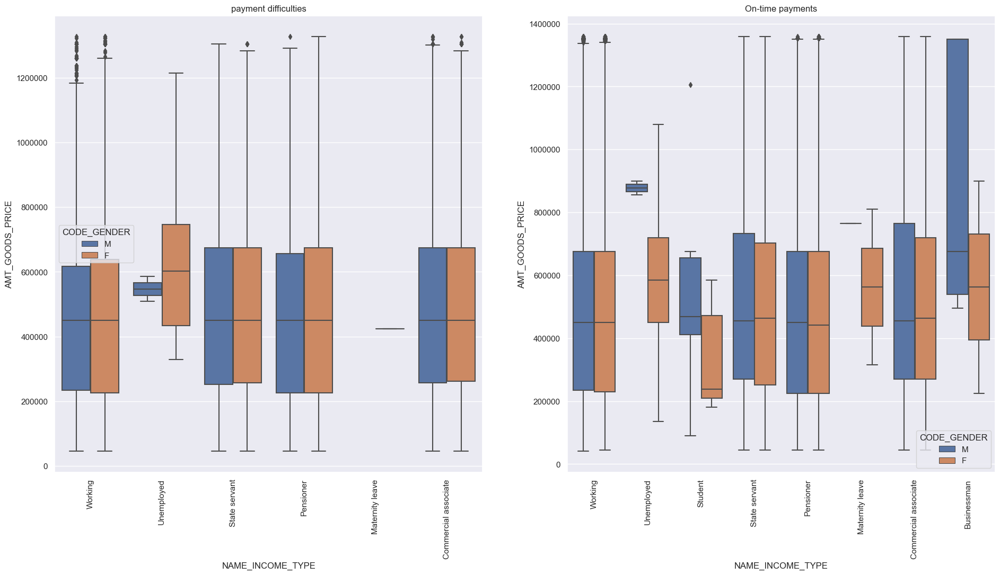

In [300]:
func_bi_boxplot('NAME_INCOME_TYPE','AMT_GOODS_PRICE',
              max_val1_agp, max_val0_agp, 'CODE_GENDER')

### Observations 

- Businessman do on-time payments either Male or Female. They don't have payment difficulties. Company must consider this      category to give loan.
- Student do on-time payments either Male or Female. They don't have payment difficulties. Company must consider this      category to give loan.
- Male in who are unemployeed are very high price of goods in on-time payments.

## Analysis of NAME_INCOME_TYPE vs AMT_INCOME_TOTAL vs CODE_GENDER

#### Analysing outliner of AMT_INCOME_TOTAL with payment difficulties :

In [301]:
max_val1_amt_income_tot = outlier_range(df1,'AMT_INCOME_TOTAL')
max_val1_amt_income_tot

337500.0

#### Analysing outliner of AMT_INCOME_TOTAL with on-time payment :

In [302]:
max_val0_amt_income_tot = outlier_range(df0,'AMT_INCOME_TOTAL')
max_val0_amt_income_tot

337500.0

#### Client with payment difficulties :

In [303]:
df1.groupby(by = ['NAME_INCOME_TYPE','CODE_GENDER']).AMT_INCOME_TOTAL.describe().head()

count           mean            std  \
NAME_INCOME_TYPE     CODE_GENDER                                         
Commercial associate F            2968.0  172962.535209   94922.968878   
                     M            2392.0  207145.505017  120281.013430   
Maternity leave      F               2.0   58500.000000   12727.922061   
Pensioner            F            2243.0  133275.589166   71580.630080   
                     M             739.0  142481.259134   76941.738672   

                                      min       25%       50%       75%  \
NAME_INCOME_TYPE     CODE_GENDER                                          
Commercial associate F            36000.0  112500.0  157500.0  202500.0   
                     M            45000.0  135000.0  180000.0  225000.0   
Maternity leave      F            49500.0   54000.0   58500.0   63000.0   
Pensioner            F            25650.0   90000.0  117000.0  157500.0   
                     M            31500.0   90000.0  135000.0  180000.0   

                                        max  
NAME_INCOME_TYPE     CODE_GENDER             
Commercial associate F            1575000.0  
                     M            1890000.0  
Maternity leave      F              67500.0  
Pensioner            F            1260000.0  
                     M             585000.0

#### client with on-time payment :

In [304]:
df0.groupby(by = ['NAME_INCOME_TYPE','CODE_GENDER']).AMT_INCOME_TOTAL.describe().head()

count           mean            std  \
NAME_INCOME_TYPE     CODE_GENDER                                          
Businessman          F                3.0  555000.000000  337749.907476   
                     M                7.0  694285.714286  738446.728904   
Commercial associate F            41552.0  187223.556855  108354.861814   
                     M            24705.0  232612.571849  199602.652415   
Maternity leave      F                2.0  112500.000000   31819.805153   

                                       min       25%       50%       75%  \
NAME_INCOME_TYPE     CODE_GENDER                                           
Businessman          F            225000.0  382500.0  540000.0  720000.0   
                     M            180000.0  202500.0  450000.0  787500.0   
Commercial associate F             26550.0  117000.0  157500.0  225000.0   
                     M             36000.0  157500.0  202500.0  270000.0   
Maternity leave      F             90000.0  101250.0  112500.0  123750.0   

                                         max  
NAME_INCOME_TYPE     CODE_GENDER              
Businessman          F              900000.0  
                     M             2250000.0  
Commercial associate F             3600000.0  
                     M            18000090.0  
Maternity leave      F              135000.0

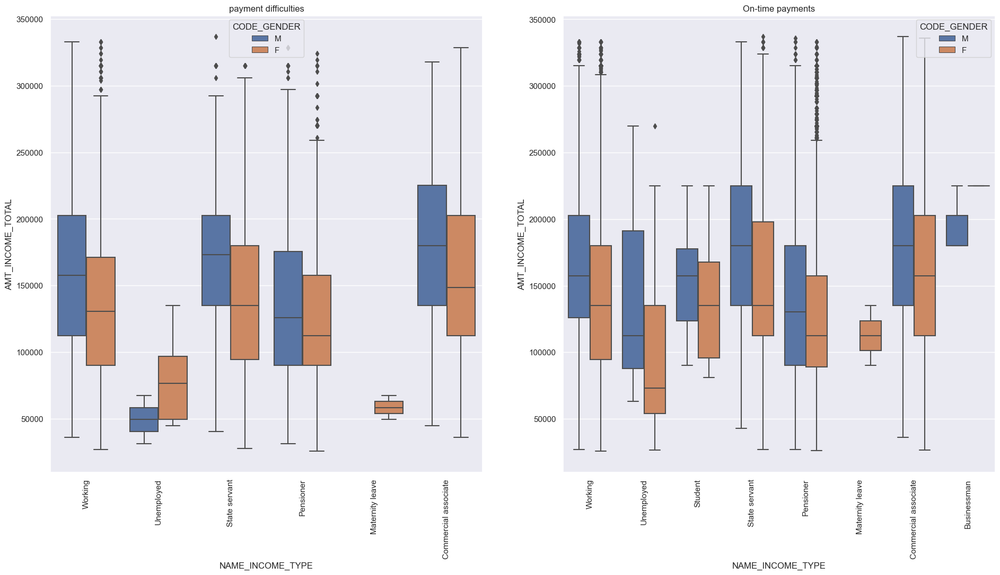

In [305]:
func_bi_boxplot('NAME_INCOME_TYPE','AMT_INCOME_TOTAL',
              max_val1_amt_income_tot, max_val0_amt_income_tot, 'CODE_GENDER')

### Observations 

- Businessman do on-time payments either Male or Female. They don't have payment difficulties. Company must consider this      category to give loan.
- Student do on-time payments either Male or Female. They don't have payment difficulties. Company must consider this      category to give loan.
- Unemployeed clients in Male category have very high income in on-time payments.
- Female client who are on Maternity leave have high income in on-time payemnts.

## Analysis of OCCUPATION_TYPE vs AMT_INCOME_TOTAL vs CODE_GENDER

#### Analysing outliner of AMT_INCOME_TOTAL with payment difficulties :

In [306]:
max_val1_amt_income_tot = outlier_range(df1,'AMT_INCOME_TOTAL')
max_val1_amt_income_tot

337500.0

#### Analysing outliner of AMT_INCOME_TOTAL with on-time payment  :

In [307]:
max_val0_amt_income_tot = outlier_range(df0,'AMT_INCOME_TOTAL')
max_val0_amt_income_tot

337500.0

##### client with payment difficulties :

In [308]:
df1.groupby(by = ['OCCUPATION_TYPE','CODE_GENDER']).AMT_INCOME_TOTAL.describe().head()

count           mean           std      min  \
OCCUPATION_TYPE CODE_GENDER                                                
Accountants     F            457.0  174840.636761  79021.040323  54000.0   
                M             17.0  202367.647059  98623.658009  81000.0   
Cleaning staff  F            410.0  128907.987805  70328.229454  31500.0   
                M             37.0  119493.243243  45786.206320  45000.0   
Cooking staff   F            555.0  129298.378378  55531.877347  32400.0   

                                  25%       50%       75%       max  
OCCUPATION_TYPE CODE_GENDER                                          
Accountants     F            112500.0  157500.0  202500.0  540000.0  
                M            121500.0  180000.0  252000.0  438750.0  
Cleaning staff  F             90000.0  112500.0  157500.0  720000.0  
                M             90000.0  112500.0  135000.0  247500.0  
Cooking staff   F             90000.0  112500.0  157500.0  405000.0

#### client who do on-time payments :

In [309]:
df0.groupby(by = ['OCCUPATION_TYPE','CODE_GENDER']).AMT_INCOME_TOTAL.describe().head()

count           mean            std      min  \
OCCUPATION_TYPE CODE_GENDER                                                  
Accountants     F            9072.0  194324.507937  109135.608131  27000.0   
                M             267.0  236490.893258  131795.325488  54000.0   
Cleaning staff  F            3904.0  130602.052254   63495.045291  25650.0   
                M             302.0  137172.516556   64373.090447  31500.0   
Cooking staff   F            4830.0  134460.402922   60213.558132  27000.0   

                                  25%       50%       75%        max  
OCCUPATION_TYPE CODE_GENDER                                           
Accountants     F            130500.0  175500.0  225000.0  2214117.0  
                M            141750.0  216000.0  270000.0  1035000.0  
Cleaning staff  F             90000.0  112500.0  157500.0  1080000.0  
                M             90000.0  132750.0  169875.0   450000.0  
Cooking staff   F             90000.0  121500.0  157500.0   540000.0

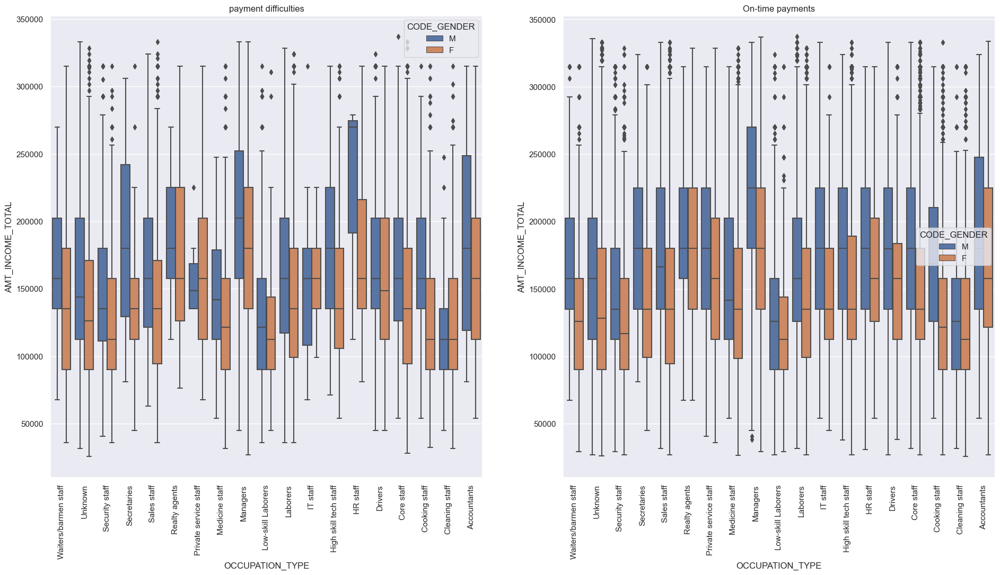

In [310]:
func_bi_boxplot('OCCUPATION_TYPE','AMT_INCOME_TOTAL',
                max_val1_amt_income_tot, max_val0_amt_income_tot,'CODE_GENDER')

### Observations :
- Private Staff Male has less payment difficulties compared to Female.
- Male Managers have more median on-time payments than difficulties.
- Male HR Staff have more median payment difficulties than on-time payments.
- Female Cleaning Staff have more median on-time payments.

# Categorical vs Categorical variables :

In [311]:
def func_bi_countplot(column,hue_column):
    plt.figure(figsize = [20,8])
    palt = sns.color_palette("dark")

    plt.subplot(1,2,1)
    pltname = 'Clients with payment difficulties'
    plt.title(pltname)
    sns.countplot(x = column, data = df1, 
                  order = sorted(df1[column].unique(), reverse = True), palette = palt,
                  hue = hue_column, hue_order = sorted(df1[hue_column].unique(), reverse = True))
    plt.xticks(rotation = 90)
    
    plt.subplot(1,2,2)
    pltname = 'Clients with on-time payments'
    plt.title(pltname)
    sns.countplot(x = column, data = df0, 
                  order = sorted(df0[column].unique(), reverse = True), palette = palt,
                  hue = hue_column, hue_order = sorted(df0[hue_column].unique(), reverse = True))
    plt.xticks(rotation = 90)

    plt.tight_layout(pad = 4)
    plt.show()

### Analysis of NAME_INCOME_TYPE vs CODE_GENDER

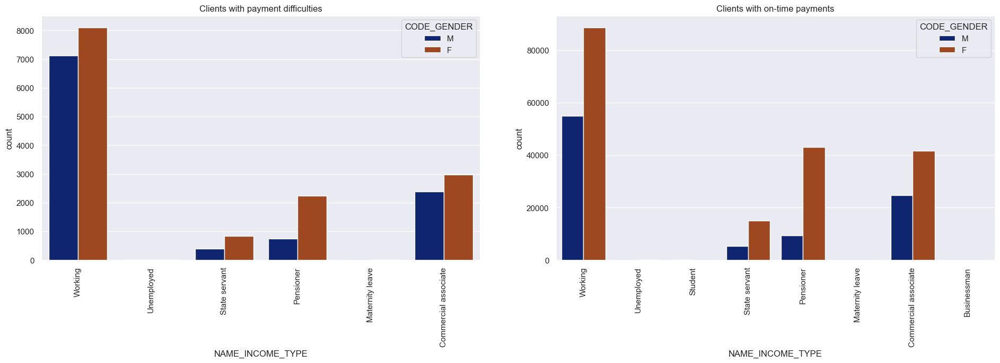

In [312]:
func_bi_countplot('NAME_INCOME_TYPE','CODE_GENDER')

### Observations :
- Client who are Pensioner and Female, they have more on-time payments compared to payment difficulties.
- Male working clients do on-time payments but have more payment difficulties.

### Analysis of NAME_EDUCATION_TYPE vs CODE_GENDER

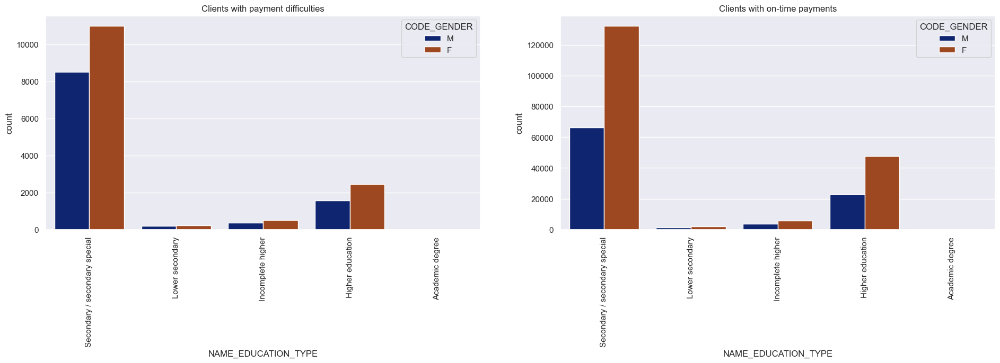

In [313]:
func_bi_countplot('NAME_EDUCATION_TYPE','CODE_GENDER')

### Observations :
- Male working clients who have Secondary/ secondary special education do on-time payments but have more payment difficulties.
- Clients who have higher education in Female have on-time payments compared to payment difficulties.

### Analysis of NAME_FAMILY_STATUS vs OCCUPATION_TYPE

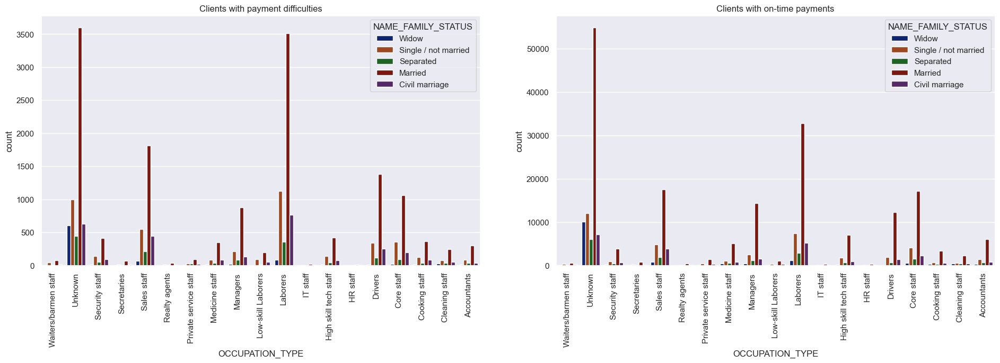

In [314]:
func_bi_countplot('OCCUPATION_TYPE','NAME_FAMILY_STATUS')

### Observations :
- Laborers who are Single/Not married have more payment difficulties than on-time payments.
- Drivers and Married clients have more payment difficulties.
- High-skill tech staff, accountants have on-time payments.

### Analysis of ORGANIZATION_TYPE vs FLAG_OWN_CAR

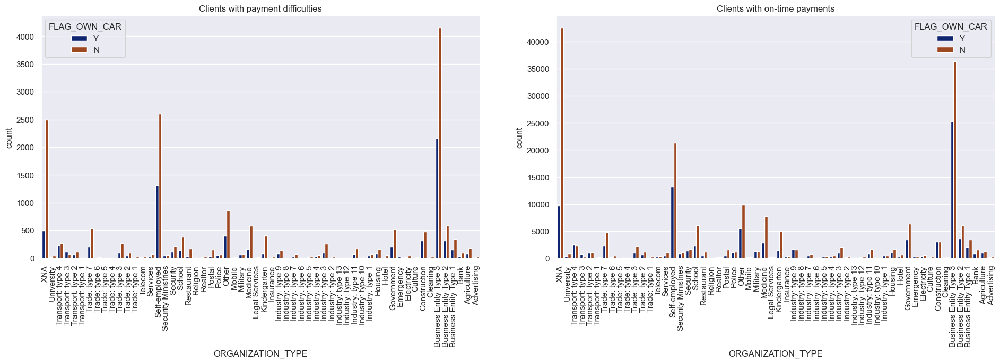

In [315]:
func_bi_countplot('ORGANIZATION_TYPE','FLAG_OWN_CAR')

### Observations :
- Self-employeed people who don't own car have more payment difficulties than on-time payments.

### Analysis of OCCUPATION_TYPE vs NAME_CONTRACT_TYPE

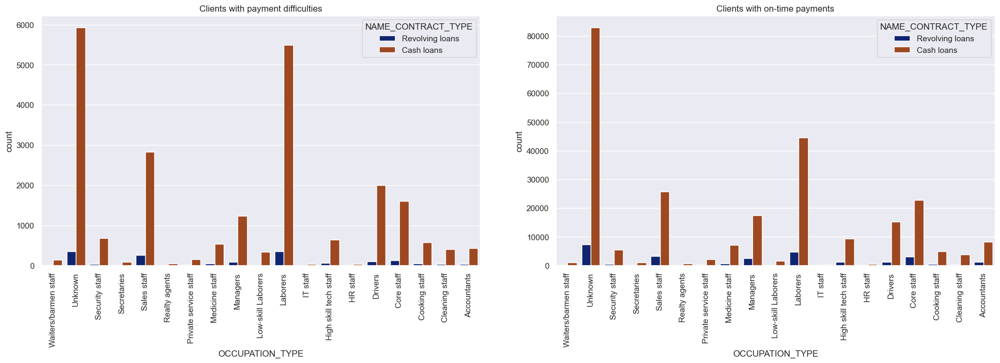

In [316]:
func_bi_countplot('OCCUPATION_TYPE','NAME_CONTRACT_TYPE')

### Observations :
- Core staff, Drivers, Laborers and Sales staff have more payment difficulties than on-time payments.

# Analysis of Previous Application Data

In [317]:
df_pad = pd.read_csv('previous_application.csv')

In [318]:
df_pad.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [319]:
df_pad.shape

(1670214, 37)

In [320]:
df_pad.describe()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,...,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.670214e+06,1.670214e+06,1.297979e+06,1.670214e+06,1.670213e+06,7.743700e+05,1.284699e+06,1.670214e+06,1.670214e+06,774370.000000,...,5951.000000,1.670214e+06,1.670214e+06,1.297984e+06,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000
mean,1.923089e+06,2.783572e+05,1.595512e+04,1.752339e+05,1.961140e+05,6.697402e+03,2.278473e+05,1.248418e+01,9.964675e-01,0.079637,...,0.773503,-8.806797e+02,3.139511e+02,1.605408e+01,342209.855039,13826.269337,33767.774054,76582.403064,81992.343838,0.332570
std,5.325980e+05,1.028148e+05,1.478214e+04,2.927798e+05,3.185746e+05,2.092150e+04,3.153966e+05,3.334028e+00,5.932963e-02,0.107823,...,0.100879,7.790997e+02,7.127443e+03,1.456729e+01,88916.115834,72444.869708,106857.034789,149647.415123,153303.516729,0.471134
min,1.000001e+06,1.000010e+05,0.000000e+00,0.000000e+00,0.000000e+00,-9.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,-0.000015,...,0.373150,-2.922000e+03,-1.000000e+00,0.000000e+00,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000
25%,1.461857e+06,1.893290e+05,6.321780e+03,1.872000e+04,2.416050e+04,0.000000e+00,5.084100e+04,1.000000e+01,1.000000e+00,0.000000,...,0.715645,-1.300000e+03,-1.000000e+00,6.000000e+00,365243.000000,-1628.000000,-1242.000000,-1314.000000,-1270.000000,0.000000
50%,1.923110e+06,2.787145e+05,1.125000e+04,7.104600e+04,8.054100e+04,1.638000e+03,1.123200e+05,1.200000e+01,1.000000e+00,0.051605,...,0.835095,-5.810000e+02,3.000000e+00,1.200000e+01,365243.000000,-831.000000,-361.000000,-537.000000,-499.000000,0.000000
75%,2.384280e+06,3.675140e+05,2.065842e+04,1.803600e+05,2.164185e+05,7.740000e+03,2.340000e+05,1.500000e+01,1.000000e+00,0.108909,...,0.852537,-2.800000e+02,8.200000e+01,2.400000e+01,365243.000000,-411.000000,129.000000,-74.000000,-44.000000,1.000000
max,2.845382e+06,4.562550e+05,4.180581e+05,6.905160e+06,6.905160e+06,3.060045e+06,6.905160e+06,2.300000e+01,1.000000e+00,1.000000,...,1.000000,-1.000000e+00,4.000000e+06,8.400000e+01,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000


In [321]:
df_pad.info(null_counts= True, verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

- There are not any null columns.
- As well as no any incorrect data types found. No data types changes are required.

# Let's check Categorical variables :

In [322]:
df_pad.select_dtypes(include= 'object').columns

Index(['NAME_CONTRACT_TYPE', 'WEEKDAY_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON',
       'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY',
       'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE',
       'NAME_SELLER_INDUSTRY', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION'],
      dtype='object')

In [323]:
# Length

len(df_pad.select_dtypes(include= 'object').columns)

16

# Let's check Numerical variables :

In [324]:
df_pad.select_dtypes(include= ['int64', 'float64']).columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'AMT_ANNUITY', 'AMT_APPLICATION',
       'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'HOUR_APPR_PROCESS_START', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', 'SELLERPLACE_AREA',
       'CNT_PAYMENT', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE',
       'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION',
       'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

In [325]:
# Length

len(df_pad.select_dtypes(include= ['int64', 'float64']).columns)

21

### Analysing Missing values :

In [326]:
df_pad.isnull().values.any()

True

In [327]:
df_pad.isnull().values.sum()

11109336

#### There are a lots of null values. Let's check which column contains null values.

In [328]:
df_pad.columns[df_pad.isnull().any()]

Index(['AMT_ANNUITY', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_TYPE_SUITE', 'CNT_PAYMENT',
       'PRODUCT_COMBINATION', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE',
       'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION',
       'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

## Calculating Percentage and Count of Missing values :

In [329]:
null_cnt = df_pad.isnull().sum()
null_per = round((df_pad.isnull().sum() / df_pad.shape[0] * 100), 2)

In [330]:
null_df = pd.DataFrame( { 'column_name': df_pad.columns, 'null_count': null_cnt, 'null_percentage': null_per  } )
null_df.reset_index(inplace= True, drop= True)

In [331]:
null_df.sort_values(by= 'null_percentage', ascending= False)

,column_name,null_count,null_percentage
14,RATE_INTEREST_PRIVILEGED,1664263,99.64
13,RATE_INTEREST_PRIMARY,1664263,99.64
12,RATE_DOWN_PAYMENT,895844,53.64
6,AMT_DOWN_PAYMENT,895844,53.64
20,NAME_TYPE_SUITE,820405,49.12
36,NFLAG_INSURED_ON_APPROVAL,673065,40.30
31,DAYS_FIRST_DRAWING,673065,40.30
32,DAYS_FIRST_DUE,673065,40.30
33,DAYS_LAST_DUE_1ST_VERSION,673065,40.30
34,DAYS_LAST_DUE,673065,40.30


## Removing null values columns > 40 %

In [332]:
deleted_coulumn = null_df[null_df['null_percentage'] > 40].column_name.to_list()

In [333]:
deleted_coulumn

['AMT_DOWN_PAYMENT',
 'RATE_DOWN_PAYMENT',
 'RATE_INTEREST_PRIMARY',
 'RATE_INTEREST_PRIVILEGED',
 'NAME_TYPE_SUITE',
 'DAYS_FIRST_DRAWING',
 'DAYS_FIRST_DUE',
 'DAYS_LAST_DUE_1ST_VERSION',
 'DAYS_LAST_DUE',
 'DAYS_TERMINATION',
 'NFLAG_INSURED_ON_APPROVAL']

In [334]:
df_pad.drop(columns= deleted_coulumn, inplace= True)

In [335]:
df_pad.shape

(1670214, 26)

#### 11 columns has been deleted from our dataframe.

## Removing null values columns < 40 %

In [336]:
null_coulumn_below_40 = null_df[null_df['null_percentage'] < 40]

In [337]:
null_coulumn_below_40.sort_values(by = 'null_percentage', ascending= False)

,column_name,null_count,null_percentage
7,AMT_GOODS_PRICE,385515,23.08
3,AMT_ANNUITY,372235,22.29
28,CNT_PAYMENT,372230,22.29
30,PRODUCT_COMBINATION,346,0.02
18,NAME_PAYMENT_TYPE,0,0.00
29,NAME_YIELD_GROUP,0,0.00
27,NAME_SELLER_INDUSTRY,0,0.00
26,SELLERPLACE_AREA,0,0.00
25,CHANNEL_TYPE,0,0.00
24,NAME_PRODUCT_TYPE,0,0.00


#### Let's analysed AMT_GOODS_PRICE

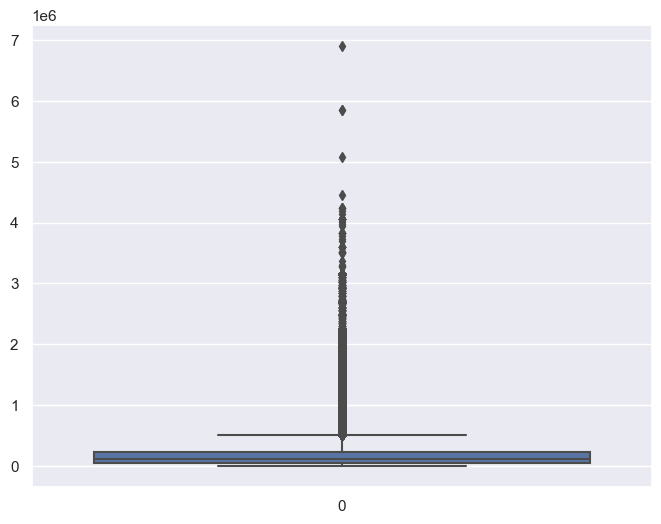

In [338]:
# Let's plot a boxplot for better understanding :

plt.figure(figsize= [8,6])
sns.boxplot(df_pad.AMT_GOODS_PRICE)
plt.show()

In [339]:
df_pad.AMT_GOODS_PRICE.quantile(q = [0.25, 0.5, 0.75, 1])

0.25      50841.0
0.50     112320.0
0.75     234000.0
1.00    6905160.0
Name: AMT_GOODS_PRICE, dtype: float64

In [340]:
df_pad.AMT_GOODS_PRICE.value_counts().head()

45000.0     47831
225000.0    43549
135000.0    40666
450000.0    38926
90000.0     29367
Name: AMT_GOODS_PRICE, dtype: int64

In [341]:
df_pad.AMT_GOODS_PRICE.mode()[0]

45000.0

In [342]:
round(df_pad.AMT_GOODS_PRICE.mean(), 2)

227847.28

#### Observations :
- Mode is 45000.
- Mean is 227847.
- Median is 112320.
- Missing percentage are higher 23.08%. Let's not impute new values.

#### Let's analysed AMT_ANNUITY

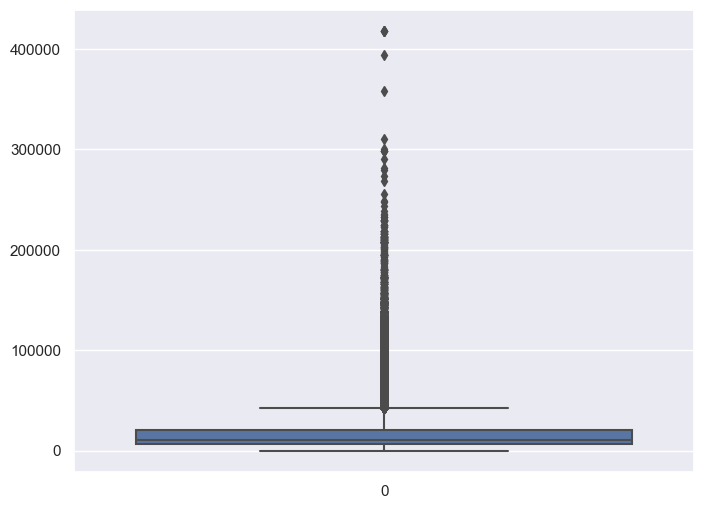

In [343]:
# Let's plot a boxplot for better understanding :

plt.figure(figsize= [8,6])
sns.boxplot(df_pad.AMT_ANNUITY)
plt.show()

In [344]:
df_pad.AMT_ANNUITY.quantile(q = [0.25, 0.5, 0.75, 1])

0.25      6321.780
0.50     11250.000
0.75     20658.420
1.00    418058.145
Name: AMT_ANNUITY, dtype: float64

In [345]:
df_pad.AMT_ANNUITY.mode()[0]

2250.0

In [346]:
df_pad.AMT_ANNUITY.mean()

15955.120659452119

#### Observations :
- Mode is 2250.
- Mean is 15955.
- Median is 11250.
- Missing percentage are higher 22.29%. Let's not impute new values.

#### Let's analysed CNT_PAYMENT

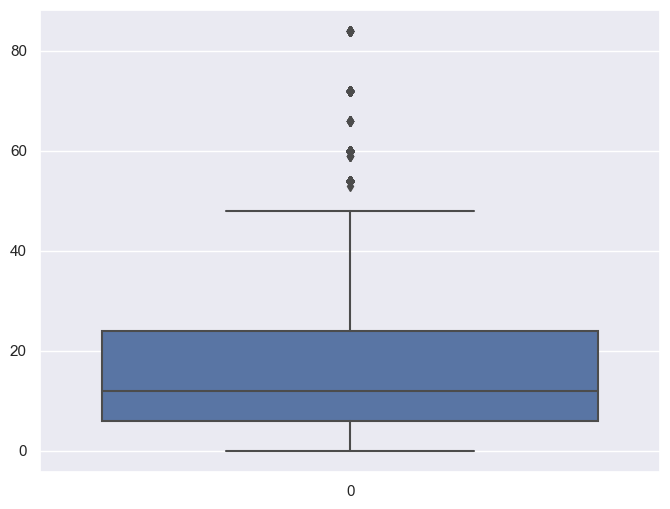

In [347]:
# Let's plot a boxplot for better understanding :

plt.figure(figsize= [8,6])
sns.boxplot(df_pad.CNT_PAYMENT)
plt.show()

In [348]:
df_pad.CNT_PAYMENT.value_counts().head()

12.0    323049
6.0     190461
0.0     144985
10.0    141851
24.0    137764
Name: CNT_PAYMENT, dtype: int64

In [349]:
df_pad.CNT_PAYMENT.quantile(q = [0.25, 0.5, 0.74, 1])

0.25     6.0
0.50    12.0
0.74    24.0
1.00    84.0
Name: CNT_PAYMENT, dtype: float64

In [350]:
df_pad.CNT_PAYMENT.mode()[0]

12.0

In [351]:
round(df_pad.CNT_PAYMENT.mean(), 2)

16.05

#### Observations :
- Mean is 16.
- Mode & Median both are same 12.
- Percentage values are still higher 22.29%. Let's not impute new values.

## Let's check Null values columns with > 0% and < 1%

In [352]:
null_df_below1 = null_df[( null_df['null_percentage'] > 0 ) & ( null_df['null_percentage'] < 1 ) ]

In [353]:
null_df_below1.sort_values(by = 'null_percentage', ascending= False)

,column_name,null_count,null_percentage
30,PRODUCT_COMBINATION,346,0.02


In [354]:
# Let's analysed PRODUCT_COMBINATION in detail :

df_pad['PRODUCT_COMBINATION'].value_counts().head()

Cash                           285990
POS household with interest    263622
POS mobile with interest       220670
Cash X-Sell: middle            143883
Cash X-Sell: low               130248
Name: PRODUCT_COMBINATION, dtype: int64

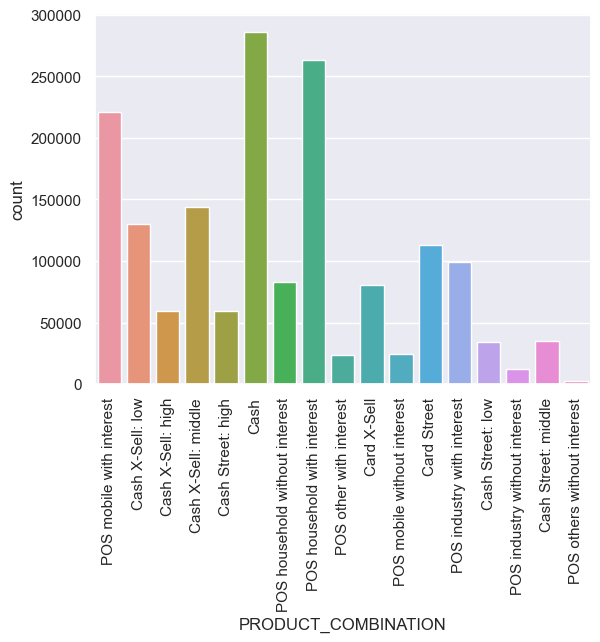

In [355]:
#Let's plot countplot :

sns.countplot(data = df_pad, x='PRODUCT_COMBINATION')
plt.xticks(rotation = 90)
plt.show()

### Observations :
- Here in plot we can see that Cash category has highest number of applicants.
- We can impute Cash into dataframe.

## Let's deal with incorrect values :

### Analysis of NAME_PAYMENT_TYPE

In [356]:
round(df_pad['NAME_PAYMENT_TYPE'].value_counts(normalize= True) * 100, 2)

Cash through the bank                        61.88
XNA                                          37.56
Non-cash from your account                    0.49
Cashless from the account of the employer     0.06
Name: NAME_PAYMENT_TYPE, dtype: float64

### Observations :
- XNA has 37% of data which is not applicable. Let's leave it as it is.

### Analysis of CODE_REJECT_REASON

In [357]:
round(df_pad['CODE_REJECT_REASON'].value_counts(normalize= True) * 100, 2)

XAP       81.01
HC        10.49
LIMIT      3.33
SCO        2.24
CLIENT     1.58
SCOFR      0.77
XNA        0.31
VERIF      0.21
SYSTEM     0.04
Name: CODE_REJECT_REASON, dtype: float64

### Observations :
- XAP desen't seems any Payment type and have 81%. Better to leave it as it is.

### Analysis of NAME_CASH_LOAN_PURPOSE

In [358]:
round(df_pad['NAME_CASH_LOAN_PURPOSE'].value_counts(normalize= True) * 100, 2)

XAP                                 55.24
XNA                                 40.59
Repairs                              1.42
Other                                0.93
Urgent needs                         0.50
Buying a used car                    0.17
Building a house or an annex         0.16
Everyday expenses                    0.14
Medicine                             0.13
Payments on other loans              0.12
Education                            0.09
Journey                              0.07
Purchase of electronic equipment     0.06
Buying a new car                     0.06
Wedding / gift / holiday             0.06
Buying a home                        0.05
Car repairs                          0.05
Furniture                            0.04
Buying a holiday home / land         0.03
Business development                 0.03
Gasification / water supply          0.02
Buying a garage                      0.01
Hobby                                0.00
Money for a third person          

### Observations :
- XAP and XNA doesn't seems any practical payment type. 
- Here XAP have 55% and XAN have 40% of data.
- Combine data is 95%. Better to leave as it is.

## Analysis of DAYS_DECISION

In [359]:
round(df_pad['DAYS_DECISION'].value_counts(normalize= True) * 100, 2)

-245     0.15
-238     0.14
-210     0.14
-273     0.14
-196     0.14
         ... 
-2882    0.01
-2922    0.01
-2921    0.01
-2902    0.01
-1       0.00
Name: DAYS_DECISION, Length: 2922, dtype: float64

In [360]:
df_pad['DAYS_DECISION'].nunique()

2922

In [361]:
df_pad['DAYS_DECISION'].unique()

array([  -73,  -164,  -301, ..., -1967, -2389,    -1], dtype=int64)

In [362]:
# let's convert values into positive :

df_pad['DAYS_DECISION'] = df_pad['DAYS_DECISION'].apply(lambda x: -x if x < 0 else x)

In [363]:
df_pad['DAYS_DECISION'].value_counts().head()

245    2444
238    2390
210    2375
273    2350
196    2315
Name: DAYS_DECISION, dtype: int64

#### now all values are positive

### Analysis of NAME_CLIENT_TYPE

In [364]:
round(df_pad['NAME_CLIENT_TYPE'].value_counts(normalize= True) * 100, 2)

Repeater     73.72
New          18.04
Refreshed     8.12
XNA           0.12
Name: NAME_CLIENT_TYPE, dtype: float64

- Here we can observe that Repeater are 73%.
- XNA indicates either appicants have not provided values or missed by officer.

In [365]:
df_pad[df_pad['NAME_CLIENT_TYPE'] == 'XNA'].head(10)

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,...,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION
694,1044207,241230,Cash loans,NaN,0.000,0.000,NaN,SUNDAY,12,Y,...,XNA,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
3419,1167657,366138,Cash loans,55400.895,1354500.000,1451047.500,1354500.000,MONDAY,17,Y,...,XNA,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,36.0,low_normal,Cash X-Sell: low
3594,2609511,334664,Consumer loans,2223.990,20659.500,23112.000,20659.500,MONDAY,11,Y,...,XNA,Computers,POS,XNA,Country-wide,50,Consumer electronics,12.0,low_action,POS household without interest
5819,2092311,281867,Cash loans,NaN,0.000,0.000,NaN,MONDAY,13,Y,...,XNA,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
5990,2680830,335491,Cash loans,32048.460,877500.000,1016496.000,877500.000,MONDAY,9,Y,...,XNA,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,48.0,low_normal,Cash Street: low
7295,2648261,456166,Cash loans,NaN,0.000,0.000,NaN,SUNDAY,15,Y,...,XNA,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
7365,1790082,392127,Revolving loans,NaN,0.000,0.000,NaN,SUNDAY,10,Y,...,XNA,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Card Street
8190,2311300,109168,Cash loans,NaN,0.000,0.000,NaN,MONDAY,4,Y,...,XNA,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
8401,1446302,118369,Consumer loans,24888.465,114367.500,120406.500,114367.500,SUNDAY,6,Y,...,XNA,Mobile,POS,XNA,Country-wide,39,Connectivity,6.0,high,POS mobile with interest
10244,1740587,379619,Consumer loans,14621.535,128733.525,128733.525,128733.525,MONDAY,19,Y,...,XNA,Mobile,POS,XNA,Country-wide,10,Connectivity,10.0,low_normal,POS mobile without interest


- We can see that data is authentic. We can go for imputations.
- As mentioned above Repeater are 71%, so we will impute NAME_CLIENT_TYPE with Repeater.

In [366]:
df_pad['NAME_CLIENT_TYPE'] = df_pad['NAME_CLIENT_TYPE'].apply(lambda x: 'Repeater' if x == 'XNA' else x)

In [367]:
round(df_pad['NAME_CLIENT_TYPE'].value_counts(normalize= True) * 100, 2)

Repeater     73.83
New          18.04
Refreshed     8.12
Name: NAME_CLIENT_TYPE, dtype: float64

#### So we can't see much difference in Repeater. Successfully imputed.

# Outliers for Numerical columns :

### Analysis of AMT_ANNUITY

In [368]:
df_pad['AMT_ANNUITY'].value_counts().sort_values(ascending = False).head()

2250.0     31865
11250.0    13974
6750.0     13442
9000.0     12496
22500.0    11903
Name: AMT_ANNUITY, dtype: int64

In [369]:
round(df_pad['AMT_ANNUITY'].value_counts(normalize= True).sort_values(ascending = False).head() * 100, 2)

2250.0     2.45
11250.0    1.08
6750.0     1.04
9000.0     0.96
22500.0    0.92
Name: AMT_ANNUITY, dtype: float64

In [370]:
df_pad.AMT_ANNUITY.quantile(q = [0.25, 0.5, 0.75, 1])

0.25      6321.780
0.50     11250.000
0.75     20658.420
1.00    418058.145
Name: AMT_ANNUITY, dtype: float64

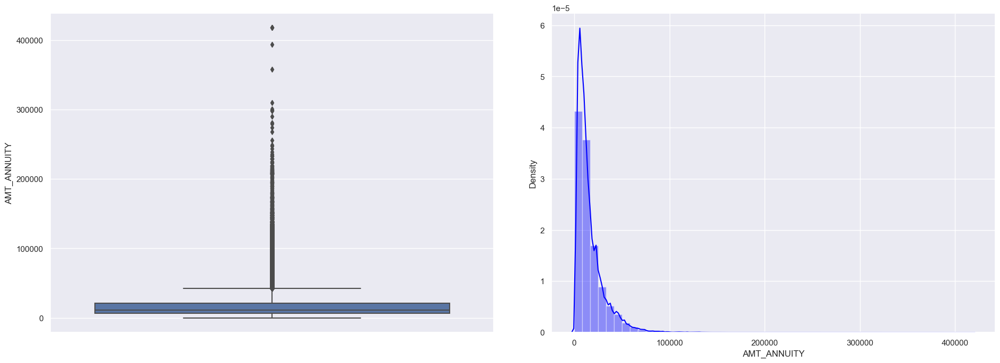

In [371]:
#let's plot the dist and box plot :

func_box_dist(df_pad, 'AMT_ANNUITY')

In [372]:
# let's calculate IQR

Q1 = df_pad['AMT_ANNUITY'].quantile(0.25)
Q3 = df_pad['AMT_ANNUITY'].quantile(0.75)
IQR = Q3 - Q1
IQR

14336.64

In [373]:
# let's count min and max value :

MinVal = (Q1 - 1.5 * IQR)
MaxVal = (Q3 + 1.5 * IQR)
print('Min value before outlier :', MinVal)
print('Max value after outlier :', MaxVal)

Min value before outlier : -15183.18
Max value after outlier : 42163.38


#### Here, values after 14336 are outliers.

### Analysis of AMT_CREDIT

In [374]:
df_pad['AMT_CREDIT'].value_counts().sort_values(ascending = False).head()

0.0         336768
45000.0      35051
225000.0     21094
450000.0     19954
135000.0     18720
Name: AMT_CREDIT, dtype: int64

In [375]:
round(df_pad['AMT_CREDIT'].value_counts(normalize= True).sort_values(ascending = False).head() * 100, 2)

0.0         20.16
45000.0      2.10
225000.0     1.26
450000.0     1.19
135000.0     1.12
Name: AMT_CREDIT, dtype: float64

In [376]:
df_pad.AMT_CREDIT.quantile(q = [0.25, 0.5, 0.75, 1])

0.25      24160.5
0.50      80541.0
0.75     216418.5
1.00    6905160.0
Name: AMT_CREDIT, dtype: float64

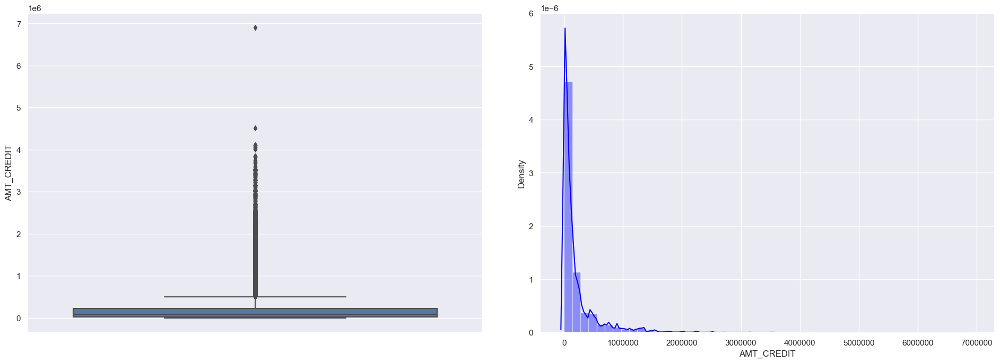

In [377]:
#let's plot the dist and box plot :

func_box_dist(df_pad, 'AMT_CREDIT')

In [378]:
# let's calculate IQR

Q1 = df_pad['AMT_CREDIT'].quantile(0.25)
Q3 = df_pad['AMT_CREDIT'].quantile(0.75)
IQR = Q3 - Q1
IQR

192258.0

In [379]:
# let's count min and max value :

MinVal = (Q1 - 1.5 * IQR)
MaxVal = (Q3 + 1.5 * IQR)
print('Min value before outlier :', MinVal)
print('Max value after outlier :', MaxVal)

Min value before outlier : -264226.5
Max value after outlier : 504805.5


#### In AMT_CREDIT, values after 504805.5 are outliers.

### Analysis of AMT_APPLICATION

In [380]:
df_pad['AMT_APPLICATION'].value_counts().sort_values(ascending = False).head()

0.0         392402
45000.0      47831
225000.0     43543
135000.0     40678
450000.0     38905
Name: AMT_APPLICATION, dtype: int64

In [381]:
round(df_pad['AMT_APPLICATION'].value_counts(normalize= True).sort_values(ascending = False).head() * 100, 2)

0.0         23.49
45000.0      2.86
225000.0     2.61
135000.0     2.44
450000.0     2.33
Name: AMT_APPLICATION, dtype: float64

In [382]:
df_pad.AMT_APPLICATION.quantile(q = [0.25, 0.5, 0.75, 1])

0.25      18720.0
0.50      71046.0
0.75     180360.0
1.00    6905160.0
Name: AMT_APPLICATION, dtype: float64

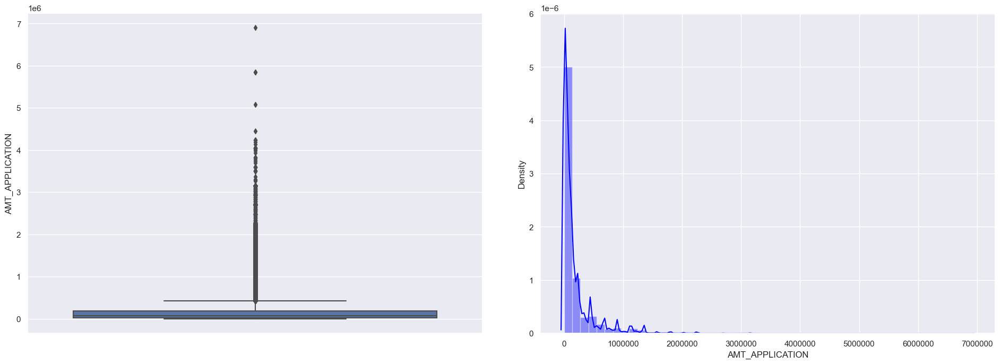

In [383]:
#let's plot the dist and box plot :

func_box_dist(df_pad, 'AMT_APPLICATION')

In [384]:
# let's calculate IQR

Q1 = df_pad['AMT_APPLICATION'].quantile(0.25)
Q3 = df_pad['AMT_APPLICATION'].quantile(0.75)
IQR = Q3 - Q1
IQR

161640.0

In [385]:
# let's count min and max value :

MinVal = (Q1 - 1.5 * IQR)
MaxVal = (Q3 + 1.5 * IQR)
print('Min value before outlier :', MinVal)
print('Max value after outlier :', MaxVal)

Min value before outlier : -223740.0
Max value after outlier : 422820.0


#### In AMT_APPLICATION, values after 422820 are outliers.

# Merge Datasets :

In [386]:
df1_merge = applicant.merge(df_pad, how = 'inner', right_on = 'SK_ID_CURR', left_on = 'SK_ID_CURR')

In [387]:
applicant.shape

(307511, 81)

In [388]:
df_pad.shape

(1670214, 26)

In [389]:
df1_merge.shape

(1413701, 106)

In [390]:
df1_merge.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE_x', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT_x', 'AMT_ANNUITY_x',
       ...
       'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO',
       'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE', 'SELLERPLACE_AREA',
       'NAME_SELLER_INDUSTRY', 'CNT_PAYMENT', 'NAME_YIELD_GROUP',
       'PRODUCT_COMBINATION'],
      dtype='object', length=106)

In [391]:
df1_merge.info(verbose = True,null_counts = True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413701 entries, 0 to 1413700
Data columns (total 106 columns):
 #    Column                        Non-Null Count    Dtype   
---   ------                        --------------    -----   
 0    SK_ID_CURR                    1413701 non-null  int64   
 1    TARGET                        1413701 non-null  int64   
 2    NAME_CONTRACT_TYPE_x          1413701 non-null  object  
 3    CODE_GENDER                   1413701 non-null  object  
 4    FLAG_OWN_CAR                  1413701 non-null  object  
 5    FLAG_OWN_REALTY               1413701 non-null  object  
 6    CNT_CHILDREN                  1413701 non-null  int64   
 7    AMT_INCOME_TOTAL              1413701 non-null  float64 
 8    AMT_CREDIT_x                  1413701 non-null  float64 
 9    AMT_ANNUITY_x                 1413608 non-null  float64 
 10   AMT_GOODS_PRICE_x             1412493 non-null  float64 
 11   NAME_TYPE_SUITE               1410175 non-null  object  
 12 

##### No null columns exists

In [392]:
df1_merge.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,SK_ID_PREV,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_GOODS_PRICE_y,HOUR_APPR_PROCESS_START_y,NFLAG_LAST_APPL_IN_DAY,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT
count,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413608e+06,1.412493e+06,1.413701e+06,1.413701e+06,1.413701e+06,...,1.413701e+06,1.106483e+06,1.413701e+06,1.413700e+06,1.094176e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.106488e+06
mean,2.784813e+05,8.655296e-02,4.048933e-01,1.733160e+05,5.875537e+05,2.701702e+04,5.277186e+05,2.074985e-02,1.632105e+04,7.266347e+04,...,1.922744e+06,1.583718e+04,1.752436e+05,1.963541e+05,2.264512e+05,1.247893e+01,9.964321e-01,8.803670e+02,3.149878e+02,1.605194e+01
std,1.028118e+05,2.811789e-01,7.173454e-01,1.985734e+05,3.849173e+05,1.395116e+04,3.532465e+05,1.334702e-02,4.344557e+03,1.433374e+05,...,5.327153e+05,1.472491e+04,2.936222e+05,3.194813e+05,3.159376e+05,3.331474e+00,5.962560e-02,7.835402e+02,7.695082e+03,1.456675e+01
min,1.000020e+05,0.000000e+00,0.000000e+00,2.565000e+04,4.500000e+04,1.615500e+03,4.050000e+04,2.900000e-04,7.489000e+03,0.000000e+00,...,1.000001e+06,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,-1.000000e+00,0.000000e+00
25%,1.893640e+05,0.000000e+00,0.000000e+00,1.125000e+05,2.700000e+05,1.682100e+04,2.385000e+05,1.003200e-02,1.273900e+04,1.042000e+03,...,1.461346e+06,6.257858e+03,1.975050e+04,2.488050e+04,4.982850e+04,1.000000e+01,1.000000e+00,2.710000e+02,-1.000000e+00,6.000000e+00
50%,2.789920e+05,0.000000e+00,0.000000e+00,1.575000e+05,5.084955e+05,2.492550e+04,4.500000e+05,1.885000e-02,1.604400e+04,2.401000e+03,...,1.922698e+06,1.122376e+04,7.087050e+04,8.059500e+04,1.102455e+05,1.200000e+01,1.000000e+00,5.820000e+02,4.000000e+00,1.200000e+01
75%,3.675560e+05,0.000000e+00,1.000000e+00,2.070000e+05,8.079840e+05,3.454200e+04,6.795000e+05,2.866300e-02,1.998000e+04,6.313000e+03,...,2.384012e+06,2.042078e+04,1.800000e+05,2.156400e+05,2.295000e+05,1.500000e+01,1.000000e+00,1.313000e+03,8.500000e+01,2.400000e+01
max,4.562550e+05,1.000000e+00,1.900000e+01,1.170000e+08,4.050000e+06,2.250000e+05,4.050000e+06,7.250800e-02,2.520100e+04,3.652430e+05,...,2.845381e+06,4.180581e+05,5.850000e+06,4.509688e+06,5.850000e+06,2.300000e+01,1.000000e+00,2.922000e+03,4.000000e+06,8.400000e+01


## Numerical Columns :

In [393]:
df1_merge.select_dtypes(include= ['int64', 'float64']).columns

Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT_x', 'AMT_ANNUITY_x', 'AMT_GOODS_PRICE_x',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL', 'FLAG_EMP_PHONE',
       'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL',
       'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START_x',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_2',
       'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3',
       'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6',
       'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG

### Categorical Columns :

In [394]:
df1_merge.select_dtypes(include= 'object').columns

Index(['NAME_CONTRACT_TYPE_x', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START_x', 'ORGANIZATION_TYPE',
       'YEARS_BIRTH_CATEGORY', 'YEARS_REGISTRATION_CATEGORY',
       'NAME_CONTRACT_TYPE_y', 'WEEKDAY_APPR_PROCESS_START_y',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON',
       'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO',
       'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE', 'NAME_SELLER_INDUSTRY',
       'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION'],
      dtype='object')

# Let's Analysed Univariate analysis on Numerical variables :

### Outlier of AMT_APPLICATION

In [395]:
Q1 = df1_merge['AMT_APPLICATION'].quantile(0.25)
Q3 = df1_merge['AMT_APPLICATION'].quantile(0.75)
IQR = Q3 - Q1
IQR

160249.5

In [396]:
MinVal = Q1 - 1.5 * IQR
MaxVal = Q3 + 1.5 * IQR
print('Min value before outlier :', MinVal)
print('Max value after outlier :', MaxVal)

Min value before outlier : -220623.75
Max value after outlier : 420374.25


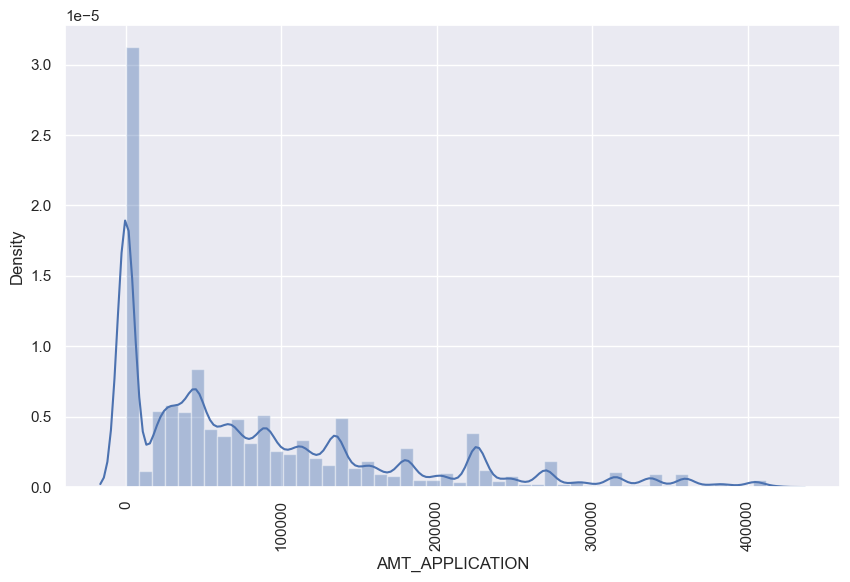

In [397]:
# Let's remove outliers and plot :

plt.figure(figsize= [10,6])
sns.distplot(df1_merge[df1_merge['AMT_APPLICATION'] <= MaxVal].AMT_APPLICATION, hist=True)
plt.xticks(rotation=90)
plt.show()

#### In the begining, loan amount applied by clients looks small.

### Outlier of AMT_ANNUITY_y

In [398]:
Q1 = df1_merge['AMT_ANNUITY_y'].quantile(0.25)
Q3 = df1_merge['AMT_ANNUITY_y'].quantile(0.75)
IQR = Q3 - Q1
IQR

14162.917500000001

In [399]:
MinVal = Q1 - 1.5 * IQR
MaxVal = Q3 + 1.5 * IQR
print('Min value before outlier :', MinVal)
print('Max value after outlier :', MaxVal)

Min value before outlier : -14986.518750000001
Max value after outlier : 41665.15125


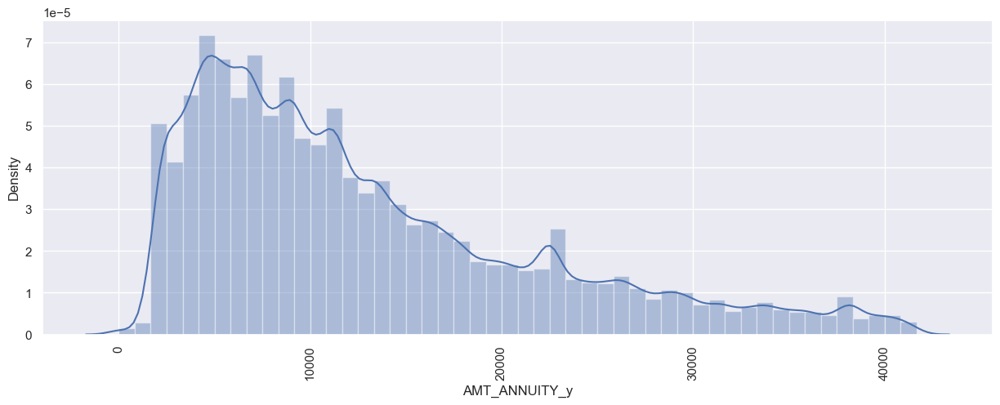

In [400]:
# Let's remove outliers and plot :

plt.figure(figsize= [15,5])
sns.distplot(df1_merge[df1_merge['AMT_ANNUITY_y'] <= MaxVal].AMT_ANNUITY_y, hist=True)
plt.xticks(rotation=90)
plt.show()

### Observations :
- In previous, loan's annuity increases as number of client decreases.
- Previous loan annuity is less than 8000 to 9000 as we can see the high peak in the beginning.


### Outlires of AMT_CREDIT_y

In [401]:
Q1 = df1_merge['AMT_CREDIT_y'].quantile(0.25)
Q3 = df1_merge['AMT_CREDIT_y'].quantile(0.75)
IQR = Q3 - Q1
IQR

190759.5

In [402]:
MinVal = Q1 - 1.5 * IQR
MaxVal = Q3 + 1.5 * IQR
print('Min value before outlier :', MinVal)
print('Max value after outlier :', MaxVal)

Min value before outlier : -261258.75
Max value after outlier : 501779.25


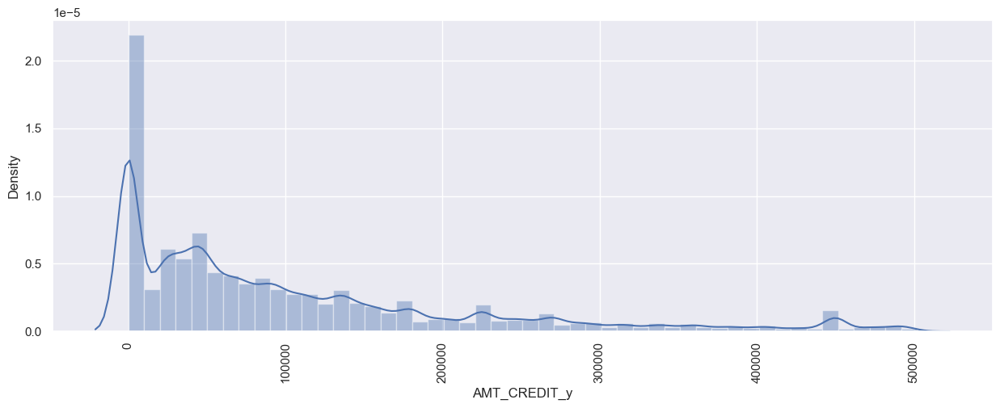

In [403]:
# Let's remove outliers and plot :

plt.figure(figsize= [15,5])
sns.distplot(df1_merge[df1_merge['AMT_CREDIT_y'] <= MaxVal].AMT_CREDIT_y, hist=True)
plt.xticks(rotation=90)
plt.show()

### Observations:
- AMT_APPLICATION & AMT_CREDIT_y both looks very similar.
- Those applicants who applied for loans, they all get their loan amount.

### Outlires of AMT_GOODS_PRICE_y

In [404]:
Q1 = df1_merge['AMT_GOODS_PRICE_y'].quantile(0.25)
Q3 = df1_merge['AMT_GOODS_PRICE_y'].quantile(0.75)
IQR = Q3 - Q1
IQR

179671.5

In [405]:
MinVal = Q1 - 1.5 * IQR
MaxVal = Q3 + 1.5 * IQR
print('Min value before outlier :', MinVal)
print('Max value after outlier :', MaxVal)

Min value before outlier : -219678.75
Max value after outlier : 499007.25


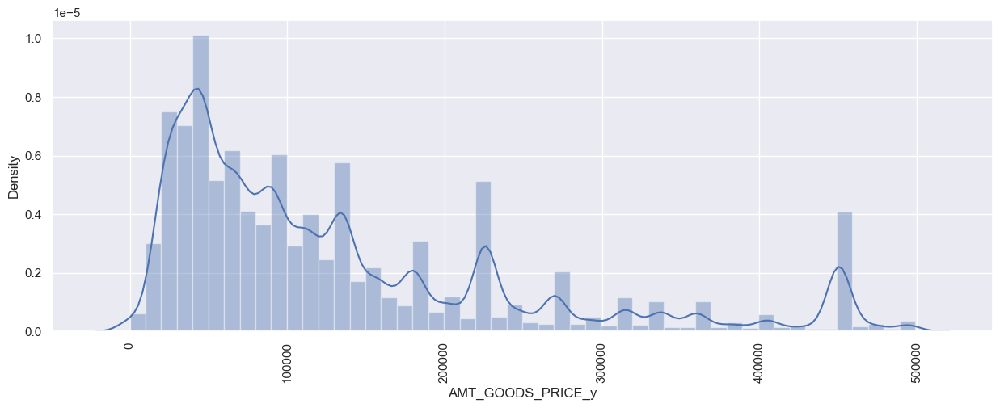

In [406]:
# Let's remove outliers and plot :

plt.figure(figsize= [15,5])
sns.distplot(df1_merge[df1_merge['AMT_GOODS_PRICE_y'] <= MaxVal].AMT_GOODS_PRICE_y, hist=True)
plt.xticks(rotation=90)
plt.show()

### Observations:
- Good Price of the most of clients in previous application asked below 130K.

# Let's Analysed Univariate analysis on Categorical variables :

#### Analysis of -NAME_CONTRACT_STATUS

In [407]:
df1_merge['NAME_CONTRACT_STATUS'].value_counts().sort_values(ascending = False)

Approved        886099
Canceled        259441
Refused         245390
Unused offer     22771
Name: NAME_CONTRACT_STATUS, dtype: int64

# Universal Function to use Piechart for Univariate Categorical variables :

In [408]:
def func_uni_pie(column):
    plt.figure(figsize = [10,6])

    pltname = 'Analysis of ' + column
    plt.title(pltname)
    df1_merge[column].value_counts().plot.pie(autopct='%1.2f%%',
                                             colors = ['brown','orange','red','green','yellow','pink'],
                                             labeldistance=None)
    
    plt.legend(loc='lower right', prop= {'size': 9})
    plt.show()

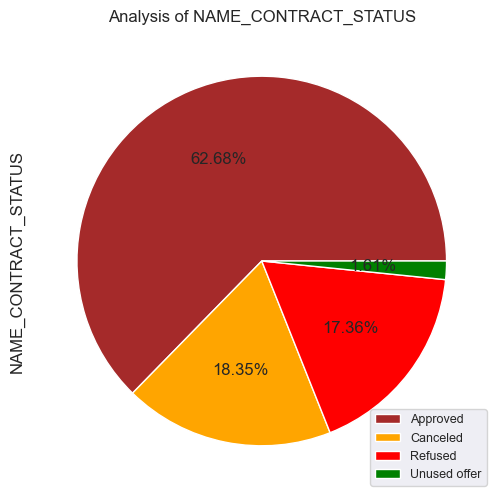

In [409]:
# let's plot the pie chart for better understanding :

func_uni_pie('NAME_CONTRACT_STATUS')

### Observations:
- Approval of loan is highest 63%.
- Cancellation of loan is 18% which is second highest.

#### Analysis of NAME_CLIENT_TYPE

In [410]:
df1_merge['NAME_CLIENT_TYPE'].value_counts().sort_values(ascending = False)

Repeater     1039225
New           259540
Refreshed     114936
Name: NAME_CLIENT_TYPE, dtype: int64

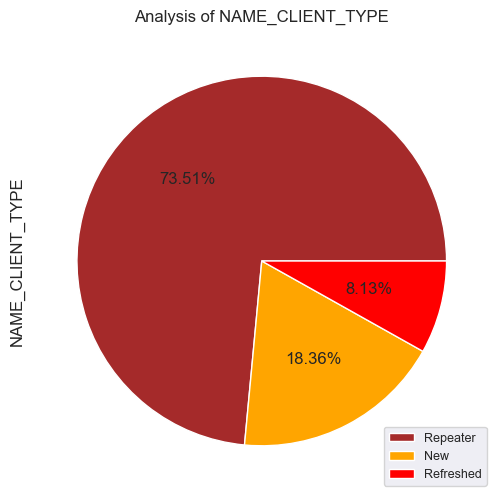

In [411]:
# let's plot the pie chart for better understanding :

func_uni_pie('NAME_CLIENT_TYPE')

### Observations:
- Repeater clients are highest 73%.
- New clients are 18% which is second highest.

#### Analysis of CHANNEL_TYPE

In [412]:
df1_merge['CHANNEL_TYPE'].value_counts().sort_values(ascending = False)

Credit and cash offices       600342
Country-wide                  423062
Stone                         183508
Regional / Local               92472
Contact center                 58891
AP+ (Cash loan)                49624
Channel of corporate sales      5396
Car dealer                       406
Name: CHANNEL_TYPE, dtype: int64

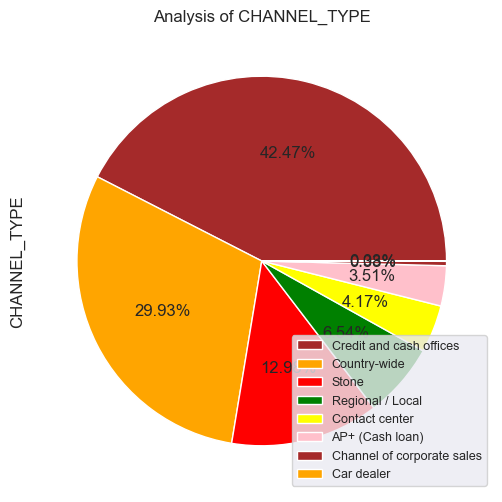

In [413]:
func_uni_pie('CHANNEL_TYPE')

### Observatons:
- Credit and cash offices is highest from rest of the applications.
- Country-wide is the second highest.

#### Analysis of NAME_YIELD_GROUP

In [414]:
df1_merge['NAME_YIELD_GROUP'].value_counts().sort_values(ascending = False)

XNA           429198
middle        324971
high          306061
low_normal    274884
low_action     78587
Name: NAME_YIELD_GROUP, dtype: int64

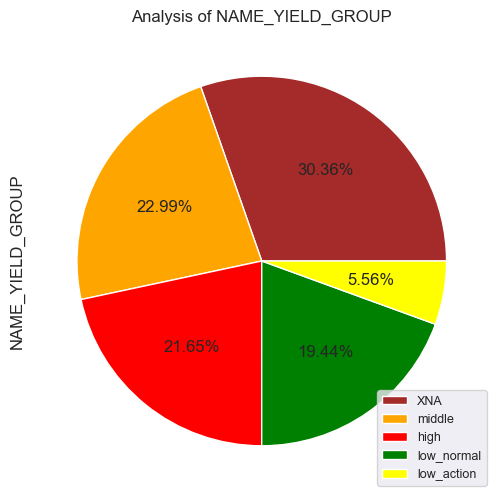

In [415]:
func_uni_pie('NAME_YIELD_GROUP')

### Observations:
- XNA interest rate is the highest from others.
- Middle and High interest rate are second and third respectively.

#### Analysis of NAME_GOODS_CATEGORY

In [416]:
df1_merge['NAME_GOODS_CATEGORY'].value_counts().sort_values(ascending = False)

XNA                         797209
Mobile                      193743
Consumer Electronics        104785
Computers                    89923
Audio/Video                  85502
Furniture                    45439
Photo / Cinema Equipment     21707
Construction Materials       21356
Clothing and Accessories     19590
Auto Accessories              6228
Jewelry                       5188
Homewares                     4309
Medical Supplies              3240
Vehicles                      2854
Sport and Leisure             2540
Other                         2337
Gardening                     2322
Office Appliances             1985
Tourism                       1324
Medicine                      1302
Direct Sales                   330
Fitness                        166
Additional Service             109
Education                       89
Weapon                          65
Insurance                       58
Animals                          1
Name: NAME_GOODS_CATEGORY, dtype: int64

## Universal function for Univariate categorical variable :

#### Here countplot would be better to display multiple columns at a time :

In [417]:
def func_uni_cat(column):
    plt.figure(figsize = [20,8])
    palt = sns.color_palette("bright")
    
    pltname = 'Analysis of ' + column
    plt.title(pltname)
    sns.countplot(x = column, data = df1_merge, order = sorted(df1_merge[column].unique(),
                                                              reverse = True), palette = palt)
    plt.xticks(rotation = 90)

    plt.tight_layout(pad = 4)
    plt.show()

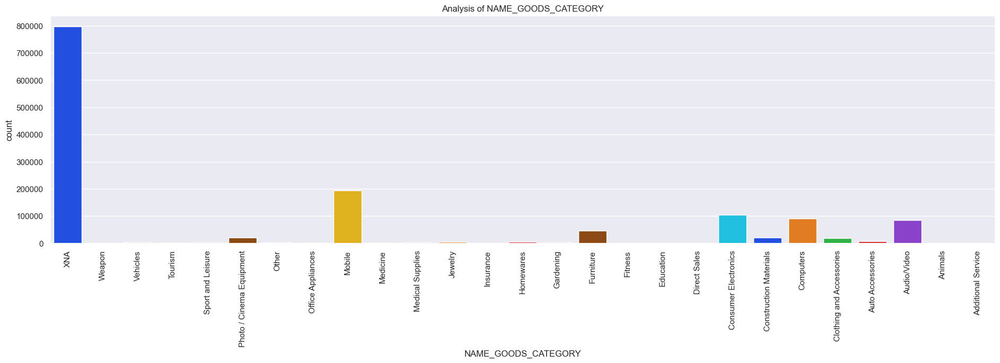

In [418]:
func_uni_cat('NAME_GOODS_CATEGORY')

### Observations
- XNA is the highest category across all loan applications.
- Mobile is the second highest category across all loan applications.

# Correlation Analysis of Numerical variables :

In [419]:
# Let's plot correlation Matrix:

corr0 = df1_merge[['AMT_ANNUITY_x', 'AMT_APPLICATION','AMT_CREDIT_x', 'AMT_GOODS_PRICE_x',
                    'AMT_ANNUITY_y', 'AMT_CREDIT_y', 'AMT_GOODS_PRICE_y', 'CNT_PAYMENT']].corr()

In [420]:
corr0.head()

,AMT_ANNUITY_x,AMT_APPLICATION,AMT_CREDIT_x,AMT_GOODS_PRICE_x,AMT_ANNUITY_y,AMT_CREDIT_y,AMT_GOODS_PRICE_y,CNT_PAYMENT
AMT_ANNUITY_x,1.000000,0.112063,0.758441,0.762251,0.202537,0.107646,0.134160,-0.005500
AMT_APPLICATION,0.112063,1.000000,0.118809,0.120734,0.809972,0.975683,0.999871,0.683056
AMT_CREDIT_x,0.758441,0.118809,1.000000,0.986310,0.152961,0.116746,0.137746,0.037726
AMT_GOODS_PRICE_x,0.762251,0.120734,0.986310,1.000000,0.155065,0.117226,0.138942,0.036073
AMT_ANNUITY_y,0.202537,0.809972,0.152961,0.155065,1.000000,0.817977,0.822204,0.398084


## Plotting Heatmap :

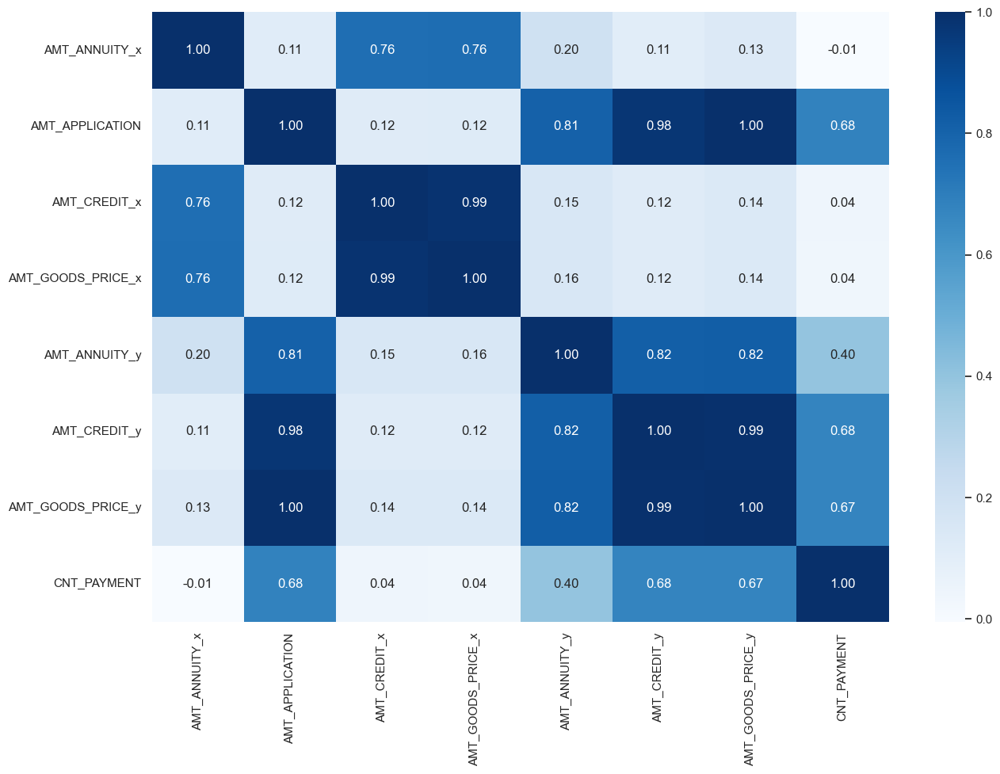

In [421]:
plt.figure(figsize= [15,10])
sns.heatmap(data= corr0, annot= True, fmt= '0.2f', cmap= 'Blues', cbar= True)
plt.show()

### Observations :

* AMT_APPLICATON has highest correlation with AMT_GOODS_PRICE, AMT_CREDIT_y, AMT_ANNUITY_y and good correlation with CNT_PAYMENT.
* AMT_ANNUITY_x has good correlation with AMT_CREDIT_x and AMT_GOODS_PRICE_x.
* AMT_CREDIT_x has solid correlation with AMT_GOODS_PRICE_x and good correlation with AMT_ANNUITY_x.
* AMT_GOODS_PRICE_x has strong correlation with AMT_CREDIT_x and good correlation with AMT_ANNUITY_x.
* AMT_ANNUITY_y has good correlation with AMT_GOOD_PRICE_y, AMT_CREDIT_y AND AMT_APPLICATIONs.
* AMT_CREDIT_y has strong correlation with AMT_GOODS_PRICE_y and AMT_APPLICATION.
* AMT_GOODS_PRICE_y has string correlation with AMT_CREDIT_y and AMT_APPLICATION. It has also good correlation with AMT_ANNUITY_y.
* CNT_PAYMENT has normal correlation with AMT_GOODS_PRICE_y, AMT_CREDIT_y and AMT_APPLICATIONS.

# Multivariate Analysis :

## Continuous vs Continuous Variable :

### Analysis of AMT_GOODS_PRICE_y vs AMT_CREDIT_y vs NAME_CONTRACT_STATUS

#### Let's check outlier of AMT_GOODS_PRICE_y

In [422]:
max_val1_AMT_GOODS_PRICE_y = outlier_range(df1_merge,'AMT_GOODS_PRICE_y')
max_val1_AMT_GOODS_PRICE_y

499007.25

#### Let's check outlier of AMT_CREDIT_y

In [423]:
max_val1_AMT_CREDIT_y = outlier_range(df1_merge,'AMT_CREDIT_y')
max_val1_AMT_CREDIT_y

501779.25

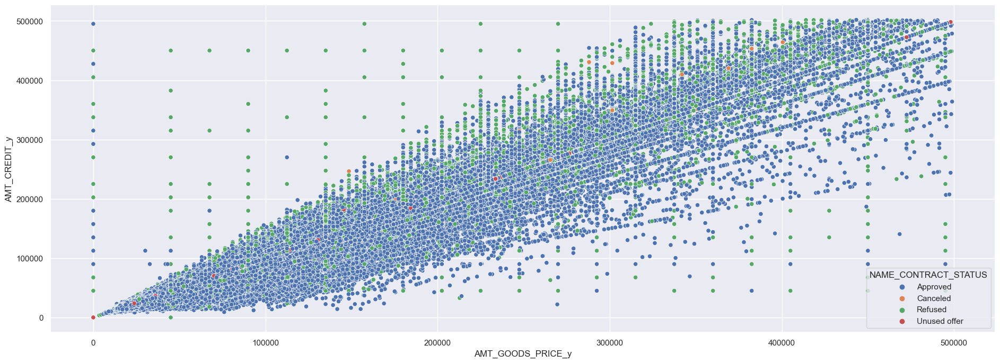

In [426]:
# let's plot the Scatterplot

plt.figure(figsize = [20,8])

sns.scatterplot(x = df1_merge[df1_merge['AMT_GOODS_PRICE_y'] < max_val1_AMT_GOODS_PRICE_y].AMT_GOODS_PRICE_y, 
                y = df1_merge[df1_merge['AMT_CREDIT_y'] < max_val1_AMT_CREDIT_y].AMT_CREDIT_y,
                data = df1_merge,
                hue = 'NAME_CONTRACT_STATUS')

plt.tight_layout(pad = 4)
plt.show()

* Here we can easily observed that the Goods Price is <200K and Credit >300K. This is weak correlation. Chances of Rejection is high.

### Analysis of AMT_ANNUITY_y vs AMT_CREDIT_y vs NAME_CONTRACT_STATUS

#### Let's check outlier of AMT_ANNUITY_y

In [427]:
max_val1_AMT_ANNUITY_y = outlier_range(df1_merge,'AMT_ANNUITY_y')
max_val1_AMT_ANNUITY_y

41665.15125

#### Let's check outlier of AMT_CREDIT_y

In [430]:
max_val1_AMT_CREDIT_y = outlier_range(df1_merge,'AMT_CREDIT_y')
max_val1_AMT_CREDIT_y

501779.25

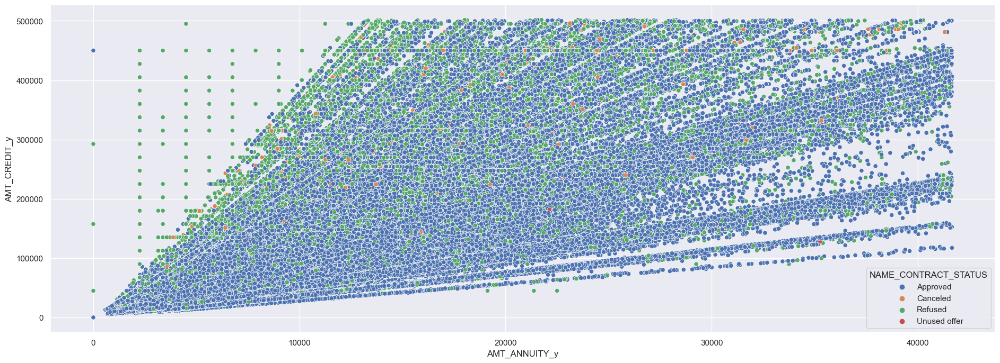

In [431]:
# let's plot the Scatterplot

plt.figure(figsize = [20,8])

sns.scatterplot(x = df1_merge[df1_merge['AMT_ANNUITY_y'] < max_val1_AMT_ANNUITY_y].AMT_ANNUITY_y, 
                y = df1_merge[df1_merge['AMT_CREDIT_y'] < max_val1_AMT_CREDIT_y].AMT_CREDIT_y,
                data = df1_merge,
                hue = 'NAME_CONTRACT_STATUS')

plt.tight_layout(pad = 4)
plt.show()

* In the begining part, we can see more Refused cases.
* These cases are between <10K of AMT_ANNUITY and >200K of Credit Amount.
* And it also shows when Credit amount is high, client also have huge amount of Annuity to pay.

### Analysis of AMT_APPLICATION vs AMT_GOODS_PRICE_y vs NAME_CONTRACT_STATUS

#### Let's check outlier of AMT_APPLICATION

In [432]:
max_val1_AMT_APPLICATION = outlier_range(df1_merge,'AMT_APPLICATION')
max_val1_AMT_APPLICATION

420374.25

#### Let's check outlier of AMT_GOODS_PRICE_y

In [433]:
max_val1_AMT_GOODS_PRICE_y = outlier_range(df1_merge,'AMT_GOODS_PRICE_y')
max_val1_AMT_GOODS_PRICE_y

499007.25

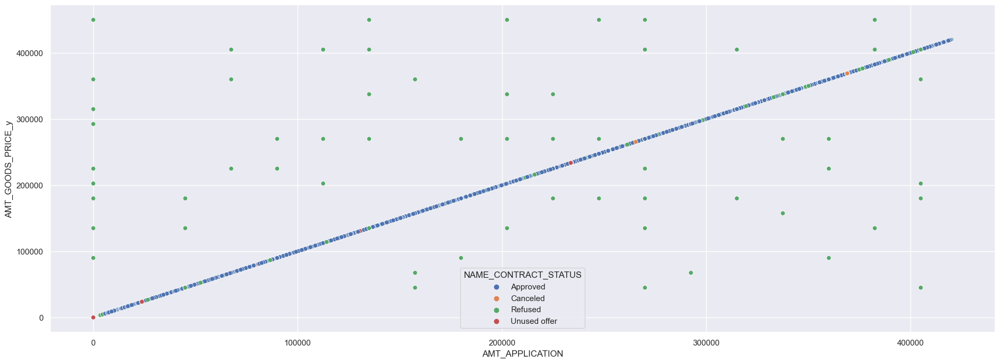

In [434]:
# let's plot the Scatterplot

plt.figure(figsize = [20,8])

sns.scatterplot(x = df1_merge[df1_merge['AMT_APPLICATION'] < max_val1_AMT_APPLICATION].AMT_APPLICATION, 
                y = df1_merge[df1_merge['AMT_GOODS_PRICE_y'] < max_val1_AMT_GOODS_PRICE_y].AMT_GOODS_PRICE_y,
                data = df1_merge,
                hue = 'NAME_CONTRACT_STATUS')

plt.tight_layout(pad = 4)
plt.show()

* This is the very good and very strong correlation with Goods Price.

### Analysis of AMT_APPLICATION vs AMT_CREDIT_y vs NAME_CONTRACT_STATUS

#### Let's check outlier of AMT_APPLICATION

In [435]:
max_val1_AMT_APPLICATION = outlier_range(df1_merge,'AMT_APPLICATION')
max_val1_AMT_APPLICATION

420374.25

#### Let's check outlier of AMT_CREDIT_y

In [436]:
max_val1_AMT_CREDIT_y = outlier_range(df1_merge,'AMT_CREDIT_y')
max_val1_AMT_CREDIT_y

501779.25

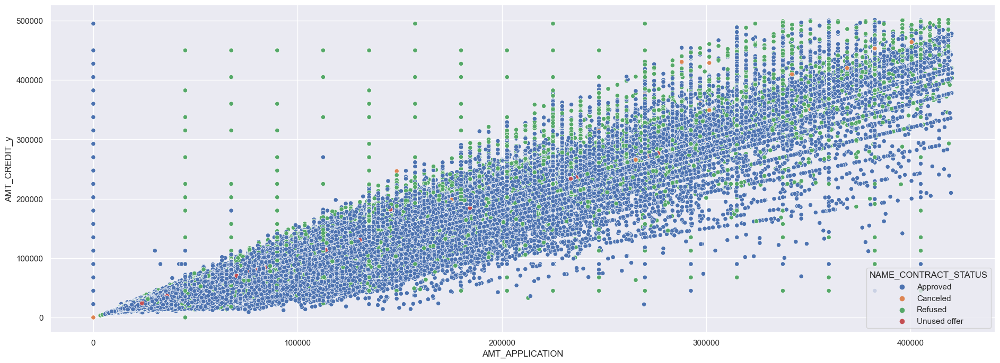

In [437]:
# let's plot the Scatterplot

plt.figure(figsize = [20,8])

sns.scatterplot(x = df1_merge[df1_merge['AMT_APPLICATION'] < max_val1_AMT_APPLICATION].AMT_APPLICATION, 
                y = df1_merge[df1_merge['AMT_CREDIT_y'] < max_val1_AMT_CREDIT_y].AMT_CREDIT_y,
                data = df1_merge,
                hue = 'NAME_CONTRACT_STATUS')

plt.tight_layout(pad = 4)
plt.show()

* There is strong correlation b/w Applicaiton Amount and Credit Amount.

## Continuous vs Categorical Variable :

### Analysis of NAME_CONTRACT_STATUS vs AMT_CREDIT_y vs CODE_GENDER

#### Let's check outlier of AMT_CREDIT_y

In [438]:
max_val1_AMT_CREDIT_y = outlier_range(df1_merge,'AMT_CREDIT_y')
max_val1_AMT_CREDIT_y

501779.25

#### Client who have Payment Difficulties :

In [439]:
df1_merge.groupby(by = ['NAME_CONTRACT_STATUS','CODE_GENDER']).AMT_CREDIT_y.describe().head()

count           mean            std  min  \
NAME_CONTRACT_STATUS CODE_GENDER                                                
Approved             F            598648.0  207549.311783  279373.334031  0.0   
                     M            287450.0  189288.803455  267951.423666  0.0   
Canceled             F            179044.0   24215.178872  160577.583695  0.0   
                     M             80397.0   26053.062186  174648.755786  0.0   
Refused              F            163327.0  376530.997804  458660.510607  0.0   

                                          25%       50%       75%        max  
NAME_CONTRACT_STATUS CODE_GENDER                                              
Approved             F            48078.00000  104935.5  229500.0  4509688.5  
                     M            45430.61625   94140.0  197820.0  4050000.0  
Canceled             F                0.00000       0.0       0.0  3847104.0  
                     M                0.00000       0.0       0.0  3524220.0  
Refused              F            66159.00000  202500.0  513531.0  4085550.0

In [443]:
 def func_ba_boxplot(categorical,continuous,max_continuous,hue_column):
    plt.figure(figsize = [20,12])

    sns.boxplot(x = categorical, 
                y = df1_merge[df1_merge[continuous] < max_continuous][continuous], 
                data = df1_merge,  
                order = sorted(df1_merge[categorical].unique(), reverse = True),
                hue = hue_column, hue_order = sorted(df1_merge[hue_column].unique(), reverse = True))
    
    plt.xticks(rotation=90)
    plt.tight_layout(pad = 4)
    plt.show()

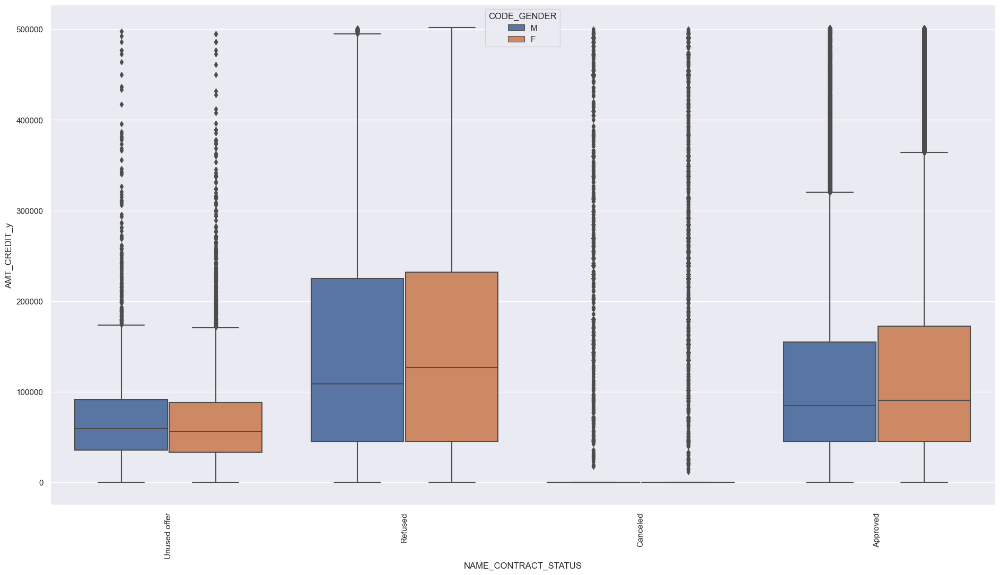

In [444]:
func_ba_boxplot('NAME_CONTRACT_STATUS','AMT_CREDIT_y', max_val1_AMT_CREDIT_y,'CODE_GENDER')

* We can see more number of Female Clients having high median Credit Amount Approved loan status.
* Clients who are Refused and Female applied for high median credit amount than Male.

### Analysis of NAME_CONTRACT_STATUS vs AMT_ANNUITY_y vs CODE_GENDER

#### Let's check outlier of AMT_ANNUITY_y

In [448]:
max_val1_AMT_ANNUITY_y = outlier_range(df1_merge,'AMT_ANNUITY_y')
max_val1_AMT_ANNUITY_y

41665.15125

#### Client who have Payment Difficulties :

In [449]:
df1_merge.groupby(by = ['NAME_CONTRACT_STATUS','CODE_GENDER']).AMT_ANNUITY_y.describe().head()

count          mean           std  \
NAME_CONTRACT_STATUS CODE_GENDER                                         
Approved             F            598644.0  14660.846512  13624.355984   
                     M            287448.0  14513.242696  13996.128661   
Canceled             F              6073.0  28917.041110  17584.221541   
                     M              2687.0  33066.864965  19936.904912   
Refused              F            141148.0  20318.152592  16580.619818   

                                       min          25%         50%  \
NAME_CONTRACT_STATUS CODE_GENDER                                      
Approved             F               0.000   5927.98500  10424.6100   
                     M               0.000   5790.79125  10010.4075   
Canceled             F            1324.305  16236.18000  25409.7450   
                     M            1780.875  19257.16500  29550.6000   
Refused              F               0.000   8765.83125  15750.0000   

                                          75%         max  
NAME_CONTRACT_STATUS CODE_GENDER                           
Approved             F            18314.93250  393868.665  
                     M            17900.91000  229274.955  
Canceled             F            38133.00000  210950.865  
                     M            43799.46750  218713.545  
Refused              F            27512.04375  418058.145

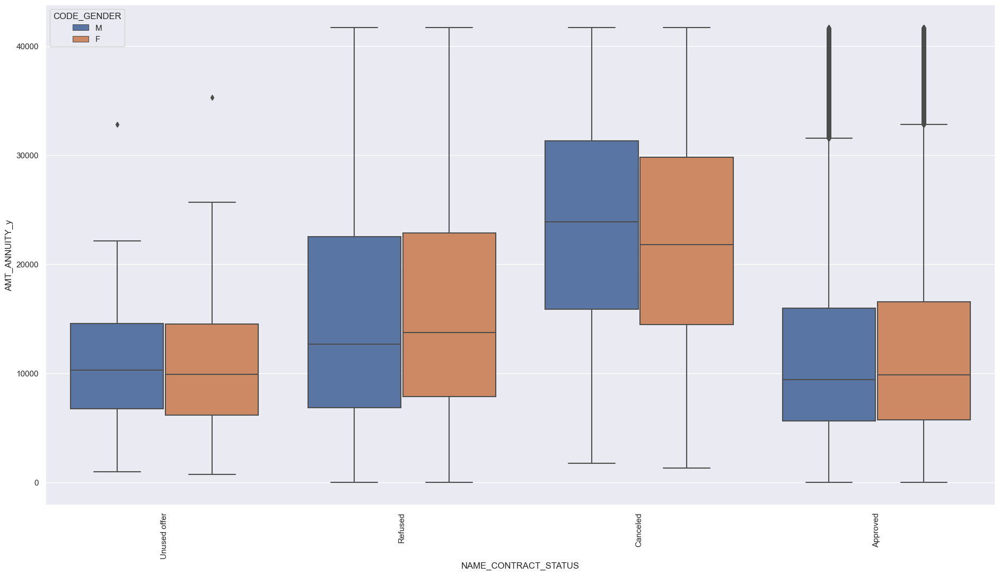

In [450]:
func_ba_boxplot('NAME_CONTRACT_STATUS','AMT_ANNUITY_y', 
                max_val1_AMT_ANNUITY_y,'CODE_GENDER')

* Clients who got Approved and Female paid higher median Annuity than Male.
* Client who got Refused and Female paid higher median Annuity than Male.
* Clients who got Canceled and Male paid higher median Annuity than Female.

### Analysis of NAME_CLIENT_TYPE vs AMT_GOODS_PRICE_y vs NAME_CONTRACT_STATUS

#### Let's check outlier of AMT_GOODS_PRICE_y

In [451]:
max_val1_AMT_GOODS_PRICE_y = outlier_range(df1_merge,'AMT_GOODS_PRICE_y')
max_val1_AMT_GOODS_PRICE_y

499007.25

#### Client who have Payment difficulties :

In [452]:
df1_merge.groupby(by = ['NAME_CLIENT_TYPE','NAME_CONTRACT_STATUS']).AMT_GOODS_PRICE_y.describe().head()

count           mean            std  \
NAME_CLIENT_TYPE NAME_CONTRACT_STATUS                                           
New              Approved              242297.0  103479.305513  137367.958950   
                 Canceled                 186.0  481775.177419  576602.841868   
                 Refused                12219.0  169230.614094  280373.275781   
                 Unused offer            1867.0   79936.321020   61318.331628   
Refreshed        Approved               79838.0  188335.881616  245136.327024   

                                           min       25%          50%  \
NAME_CLIENT_TYPE NAME_CONTRACT_STATUS                                   
New              Approved                  0.0   38106.0   67500.0000   
                 Canceled              22455.0  135000.0  225000.0000   
                 Refused                   0.0   45000.0   97452.0000   
                 Unused offer              0.0   39325.5   66758.8500   
Refreshed        Approved                  0.0   54859.5  106469.8875   

                                             75%        max  
NAME_CLIENT_TYPE NAME_CONTRACT_STATUS                        
New              Approved              121500.00  5850000.0  
                 Canceled              675000.00  3150000.0  
                 Refused               180000.00  4050000.0  
                 Unused offer          104231.25   688059.0  
Refreshed        Approved              219150.00  3150000.0

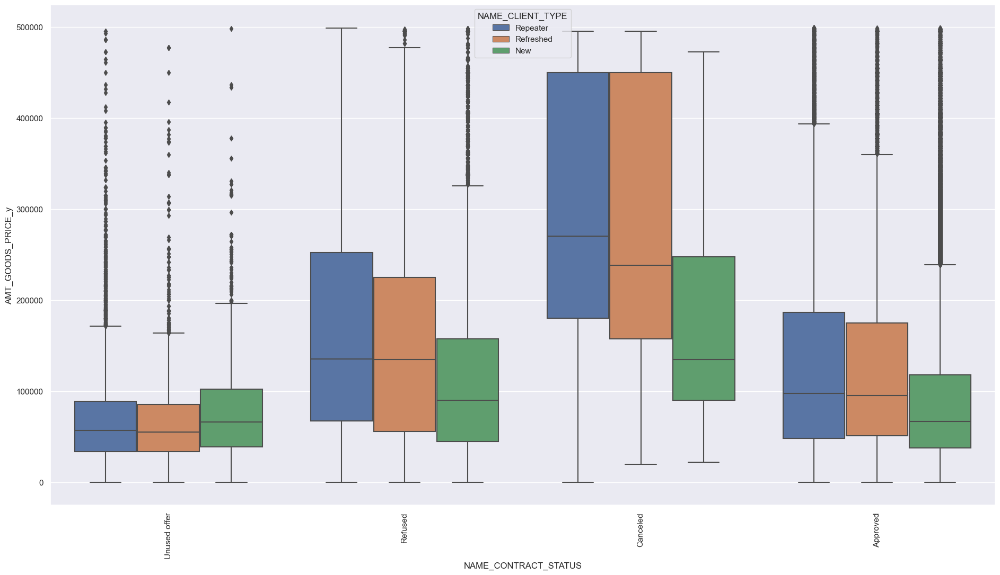

In [454]:
func_ba_boxplot('NAME_CONTRACT_STATUS','AMT_GOODS_PRICE_y',
                    max_val1_AMT_GOODS_PRICE_y, 'NAME_CLIENT_TYPE')

* Clients who are New and Refused have less median Goods price than Repeater and Refreshed.
* Clients who are New and Canceled have less median Goods price than Repeater and Refreshed.
* Clients who are New and Approved have less median Goods price than Repeater and Refreshed.

### Analysis of NAME_CONTRACT_STATUS vs AMT_CREDIT_y vs NAME_PORTFOLIO

#### Let's check outlier of AMT_CREDIT_y

In [455]:
max_val1_AMT_CREDIT_y = outlier_range(df1_merge,'AMT_CREDIT_y')
max_val1_AMT_CREDIT_y

501779.25

#### Client who have Payment difficulties :

In [456]:
df1_merge.groupby(by = ['NAME_PORTFOLIO','NAME_CONTRACT_STATUS']).AMT_CREDIT_y.describe().head()

count          mean            std  \
NAME_PORTFOLIO NAME_CONTRACT_STATUS                                         
Cards          Approved              82407.0  2.276054e+05  215931.325545   
               Canceled                417.0  2.287338e+05  186123.227075   
               Refused               39159.0  2.397627e+05  207093.853558   
               Unused offer              1.0  2.025000e+05            NaN   
Cars           Approved                241.0  1.122764e+06  644748.216327   

                                          min       25%       50%        75%  \
NAME_PORTFOLIO NAME_CONTRACT_STATUS                                            
Cards          Approved                   0.0   67500.0  157500.0   292500.0   
               Canceled               45000.0  112500.0  180000.0   270000.0   
               Refused                    0.0   90000.0  180000.0   270000.0   
               Unused offer          202500.0  202500.0  202500.0   202500.0   
Cars           Approved              202500.0  735520.5  980100.0  1293556.5   

                                           max  
NAME_PORTFOLIO NAME_CONTRACT_STATUS             
Cards          Approved              1350000.0  
               Canceled               900000.0  
               Refused               2250000.0  
               Unused offer           202500.0  
Cars           Approved              4509688.5

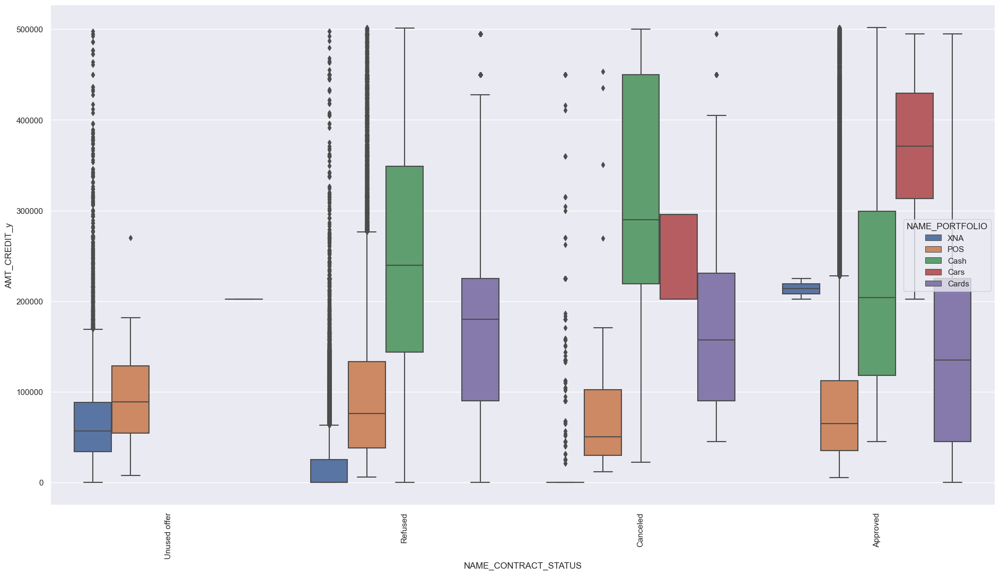

In [457]:
func_ba_boxplot('NAME_CONTRACT_STATUS','AMT_CREDIT_y',
                max_val1_AMT_CREDIT_y, 'NAME_PORTFOLIO')

* Clients who have Refused get more median Credit Amount in Cash portfolio.
* Client who have Approved get more median credit in Cars portfolio.
* Clients who have Unused Offer get more median Credit amount as POS portfolio.

# Categorical vs Categorical Variables :

### Analysis of YEARS_BIRTH_CATEGORY vs NAME_CONTRACT_STATUS

## Universal Funtion for Multivariate Categorical vs Categorical columns

In [460]:
def func_cc_countplot(column,hue_column):
    plt.figure(figsize = [20,8])
    palt = sns.color_palette("dark")

    sns.countplot(x = column, data = df1_merge, 
                  order = sorted(df1_merge[column].unique()), palette = palt,
                  hue = hue_column, hue_order = sorted(df1_merge[hue_column].unique(), reverse = True))
    
    plt.xticks(rotation = 90)
    plt.tight_layout(pad = 4)
    plt.show()

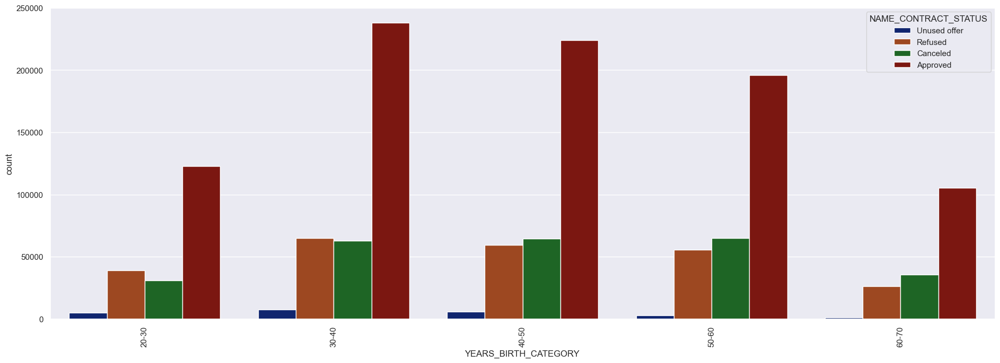

In [461]:
func_cc_countplot('YEARS_BIRTH_CATEGORY','NAME_CONTRACT_STATUS')

### Observations:
* Age b/w 30-40 and 40-50 gets most approvals respectively.
* Age b/w 60-70 gets least refusals.

### Analysis of NAME_FAMILY_STATUS vs NAME_CONTRACT_STATUS

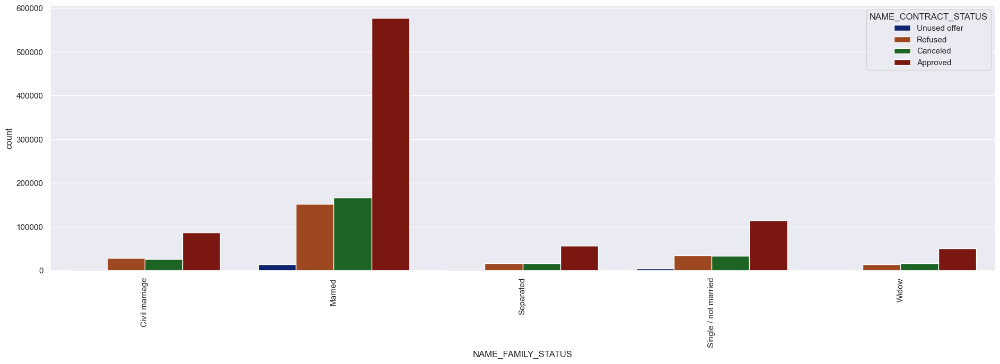

In [462]:
func_cc_countplot('NAME_FAMILY_STATUS','NAME_CONTRACT_STATUS')

### Observations:
* Clients who are Married gets most Approvals.

### Analysis of NAME_EDUCATION_TYPE vs NAME_CONTRACT_STATUS

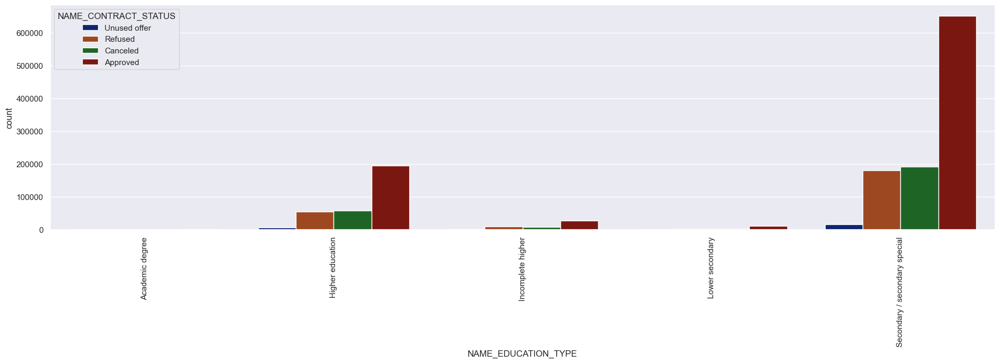

In [463]:
func_cc_countplot('NAME_EDUCATION_TYPE','NAME_CONTRACT_STATUS')

### Observation:
* Clients who have Secondary/ secondary special education gets most approvals.

### Analysis of NAME_CLIENT_TYPE vs NAME_CONTRACT_STATUS

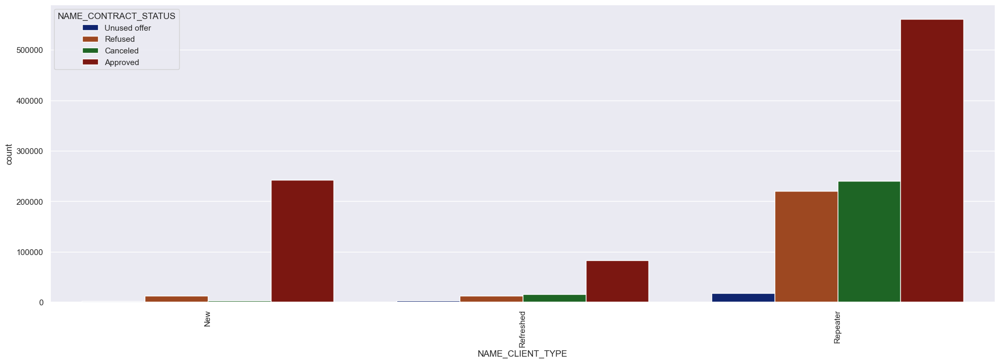

In [464]:
func_cc_countplot('NAME_CLIENT_TYPE','NAME_CONTRACT_STATUS')

### Observation:
* Clients who are Repeater and New gets most approvals respectively.

# Conclusion :

----- Below are the points that the Banks should focus on while providing the loan.
* Clients who's age between 30-40 and 40-50.
* Clients who are Married.
* Academic degree in Male category.
* Businessman and Students are the best category to target as they don’t have payment difficulties.
* Repeater clients.
* Clients Employment more than 18 years.